In [1]:
import pandas as pd

# Attempt to read the CSV file
file_path = r'C:\Users\theop\Downloads\scb_region_birth_data.csv'

try:
    df = pd.read_csv(file_path)
    print("The file is a valid CSV.")
    print(df.head())  # Προβολή των πρώτων 5 γραμμών του αρχείου για επιβεβαίωση
except Exception as e:
    print(f"Error: The file is not a CSV or there was an issue during reading. Details: {e}")


Το αρχείο είναι έγκυρο CSV.
   Region  Year  Number
0       1  1968   20095
1       1  1969   19703
2       1  1970   21113
3       1  1971   22834
4       1  1972   22316


In [2]:
import sqlite3
import pandas as pd

# Connection with database SQLite
conn = sqlite3.connect('education_costs.db')

# Import file scb_region_birth_data
file_path_birth = r'C:\Users\theop\Downloads\scb_region_birth_data.csv'
df_birth = pd.read_csv(file_path_birth)
df_birth.to_sql('scb_region_birth_data', conn, if_exists='replace', index=False)

# scb_region_population_0_16_years
file_path_population_0_16 = r'C:\Users\theop\Downloads\scb_region_population_0_16_years.csv'
df_population_0_16 = pd.read_csv(file_path_population_0_16)
df_population_0_16.to_sql('scb_region_population_0_16_years', conn, if_exists='replace', index=False)

# scb_region_population_17_19_years
file_path_population_17_19 = r'C:\Users\theop\Downloads\scb_region_population_17_19_years.csv'
df_population_17_19 = pd.read_csv(file_path_population_17_19)
df_population_17_19.to_sql('scb_region_population_17_19_years', conn, if_exists='replace', index=False)

# scb_dead_region
file_path_dead = r'C:\Users\theop\Downloads\scb_dead_region.csv'
df_dead = pd.read_csv(file_path_dead)
df_dead.to_sql('scb_dead_region', conn, if_exists='replace', index=False)

# grundskola_costs_per_child
file_path_grundskola = r'C:\Users\theop\Downloads\grundskola_costs_per_child.csv'
df_grundskola = pd.read_csv(file_path_grundskola)
df_grundskola.to_sql('grundskola_costs_per_child', conn, if_exists='replace', index=False)

# gymnasieskola_costs_per_child
file_path_gymnasieskola = r'C:\Users\theop\Downloads\gymnasieskola_costs_per_child.csv'
df_gymnasieskola = pd.read_csv(file_path_gymnasieskola)
df_gymnasieskola.to_sql('gymnasieskola_costs_per_child', conn, if_exists='replace', index=False)

# Close connection
conn.commit()
conn.close()

print("Τα δεδομένα εισήχθησαν στη βάση SQL επιτυχώς.")


Τα δεδομένα εισήχθησαν στη βάση SQL επιτυχώς.


In [3]:
import sqlite3

# Σύνδεση με τη βάση δεδομένων
conn = sqlite3.connect('education_costs.db')

# Εκτέλεση ερωτήματος για τον πίνακα scb_region_birth_data
cursor = conn.cursor()
cursor.execute("SELECT * FROM scb_region_birth_data LIMIT 10")
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


(1, 1968, 20095)
(1, 1969, 19703)
(1, 1970, 21113)
(1, 1971, 22834)
(1, 1972, 22316)
(1, 1973, 21235)
(1, 1974, 20778)
(1, 1975, 19292)
(1, 1976, 18695)
(1, 1977, 18055)


In [5]:
import sqlite3

# Σύνδεση με τη βάση δεδομένων SQLite
conn = sqlite3.connect('education_costs.db')

# Εκτέλεση του SQL query για συνδυασμό γεννήσεων και πληθυσμού 0-16 ετών
query = '''
SELECT b.region, b.year, b.number AS births, p.population AS population_0_16
FROM scb_region_birth_data AS b
JOIN scb_region_population_0_16_years AS p
ON b.region = p.region AND b.year = p.year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


(1, 1968, 20095, 16883)
(1, 1968, 20095, 17390)
(1, 1968, 20095, 17501)
(1, 1968, 20095, 17565)
(1, 1968, 20095, 17572)
(1, 1968, 20095, 17725)
(1, 1968, 20095, 17734)
(1, 1968, 20095, 17948)
(1, 1968, 20095, 17994)
(1, 1968, 20095, 18569)
(1, 1968, 20095, 19248)
(1, 1968, 20095, 19736)
(1, 1968, 20095, 20382)
(1, 1968, 20095, 21741)
(1, 1968, 20095, 21824)
(1, 1968, 20095, 22001)
(1, 1968, 20095, 22342)
(1, 1969, 19703, 17031)
(1, 1969, 19703, 17495)
(1, 1969, 19703, 17637)
(1, 1969, 19703, 17697)
(1, 1969, 19703, 17881)
(1, 1969, 19703, 17921)
(1, 1969, 19703, 18035)
(1, 1969, 19703, 18131)
(1, 1969, 19703, 18712)
(1, 1969, 19703, 19351)
(1, 1969, 19703, 19425)
(1, 1969, 19703, 20242)
(1, 1969, 19703, 20520)
(1, 1969, 19703, 22071)
(1, 1969, 19703, 22125)
(1, 1969, 19703, 22228)
(1, 1969, 19703, 22668)
(1, 1970, 21113, 17314)
(1, 1970, 21113, 17626)
(1, 1970, 21113, 17749)
(1, 1970, 21113, 17813)
(1, 1970, 21113, 17958)
(1, 1970, 21113, 18154)
(1, 1970, 21113, 18245)
(1, 1970, 21113,

In [6]:
import sqlite3

# Σύνδεση με τη βάση δεδομένων SQLite
conn = sqlite3.connect('education_costs.db')

# Εκτέλεση του SQL query για συνδυασμό πληθυσμού 17-19 ετών και θανάτων
query = '''
SELECT p.region, p.year, p.population AS population_17_19, d.number AS deaths
FROM scb_region_population_17_19_years AS p
JOIN scb_dead_region AS d
ON p.region = d.region AND p.year = d.year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


(1, 2000, 18176, 0)
(1, 2000, 18176, 1)
(1, 2000, 18176, 2)
(1, 2000, 18176, 2)
(1, 2000, 18176, 2)
(1, 2000, 18176, 2)
(1, 2000, 18176, 2)
(1, 2000, 18176, 3)
(1, 2000, 18176, 3)
(1, 2000, 18176, 3)
(1, 2000, 18176, 4)
(1, 2000, 18176, 4)
(1, 2000, 18176, 4)
(1, 2000, 18176, 4)
(1, 2000, 18176, 5)
(1, 2000, 18176, 5)
(1, 2000, 18176, 7)
(1, 2000, 18176, 12)
(1, 2000, 18176, 15)
(1, 2000, 18176, 65)
(1, 2001, 18834, 0)
(1, 2001, 18834, 0)
(1, 2001, 18834, 1)
(1, 2001, 18834, 1)
(1, 2001, 18834, 2)
(1, 2001, 18834, 2)
(1, 2001, 18834, 2)
(1, 2001, 18834, 2)
(1, 2001, 18834, 2)
(1, 2001, 18834, 3)
(1, 2001, 18834, 3)
(1, 2001, 18834, 3)
(1, 2001, 18834, 4)
(1, 2001, 18834, 4)
(1, 2001, 18834, 5)
(1, 2001, 18834, 5)
(1, 2001, 18834, 6)
(1, 2001, 18834, 9)
(1, 2001, 18834, 15)
(1, 2001, 18834, 57)
(1, 2002, 19625, 0)
(1, 2002, 19625, 0)
(1, 2002, 19625, 0)
(1, 2002, 19625, 0)
(1, 2002, 19625, 1)
(1, 2002, 19625, 1)
(1, 2002, 19625, 2)
(1, 2002, 19625, 2)
(1, 2002, 19625, 2)
(1, 2002, 19625

In [8]:
import sqlite3

# Σύνδεση με τη βάση δεδομένων SQLite
conn = sqlite3.connect('education_costs.db')

# Εκτέλεση του SQL query για συνδυασμό πληθυσμού 0-16 ετών και εκπαιδευτικών εξόδων
query = '''
SELECT p.region, p.year, p.population AS population_0_16, g.Fixed_cost_per_child_kr, g.Current_cost_per_child_kr
FROM scb_region_population_0_16_years AS p
JOIN grundskola_costs_per_child AS g
ON p.year = g.year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


(1, 2007, 27342, 101392, 79200)
(1, 2008, 27908, 103429, 83600)
(1, 2009, 28527, 106611, 85900)
(1, 2010, 29578, 108217, 88300)
(1, 2011, 28583, 108075, 90500)
(1, 2012, 28886, 110081, 93000)
(1, 2013, 29512, 112499, 95000)
(1, 2014, 29607, 115907, 97700)
(1, 2015, 29430, 119756, 100900)
(1, 2016, 29626, 125408, 106700)
(1, 2017, 28938, 128281, 111100)
(1, 2018, 28798, 130576, 115300)
(1, 2019, 28474, 131847, 118500)
(1, 2020, 28384, 132746, 119900)
(1, 2021, 28880, 133835, 123500)
(1, 2022, 26271, 128900, 128900)
(1, 2007, 27011, 101392, 79200)
(1, 2008, 27528, 103429, 83600)
(1, 2009, 28062, 106611, 85900)
(1, 2010, 28734, 108217, 88300)
(1, 2011, 29750, 108075, 90500)
(1, 2012, 28667, 110081, 93000)
(1, 2013, 28977, 112499, 95000)
(1, 2014, 29483, 115907, 97700)
(1, 2015, 29761, 119756, 100900)
(1, 2016, 29599, 125408, 106700)
(1, 2017, 29859, 128281, 111100)
(1, 2018, 29201, 130576, 115300)
(1, 2019, 29033, 131847, 118500)
(1, 2020, 28417, 132746, 119900)
(1, 2021, 28288, 133835, 1

In [9]:
import sqlite3

# Σύνδεση με τη βάση δεδομένων SQLite
conn = sqlite3.connect('education_costs.db')

# Εκτέλεση του SQL query για συνδυασμό γεννήσεων, πληθυσμού, θανάτων και εκπαιδευτικών εξόδων
query = '''
SELECT b.region, b.year, b.number AS births, p.population AS population_0_16, d.number AS deaths, 
       g.Fixed_cost_per_child_kr, g.Current_cost_per_child_kr
FROM scb_region_birth_data AS b
JOIN scb_region_population_0_16_years AS p
ON b.region = p.region AND b.year = p.year
JOIN scb_dead_region AS d
ON b.region = d.region AND b.year = d.year
JOIN grundskola_costs_per_child AS g
ON b.year = g.year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


(1, 2007, 27421, 20423, 0, 101392, 79200)
(1, 2007, 27421, 20423, 1, 101392, 79200)
(1, 2007, 27421, 20423, 1, 101392, 79200)
(1, 2007, 27421, 20423, 1, 101392, 79200)
(1, 2007, 27421, 20423, 1, 101392, 79200)
(1, 2007, 27421, 20423, 2, 101392, 79200)
(1, 2007, 27421, 20423, 2, 101392, 79200)
(1, 2007, 27421, 20423, 3, 101392, 79200)
(1, 2007, 27421, 20423, 3, 101392, 79200)
(1, 2007, 27421, 20423, 3, 101392, 79200)
(1, 2007, 27421, 20423, 3, 101392, 79200)
(1, 2007, 27421, 20423, 4, 101392, 79200)
(1, 2007, 27421, 20423, 4, 101392, 79200)
(1, 2007, 27421, 20423, 4, 101392, 79200)
(1, 2007, 27421, 20423, 4, 101392, 79200)
(1, 2007, 27421, 20423, 5, 101392, 79200)
(1, 2007, 27421, 20423, 8, 101392, 79200)
(1, 2007, 27421, 20423, 8, 101392, 79200)
(1, 2007, 27421, 20423, 12, 101392, 79200)
(1, 2007, 27421, 20423, 57, 101392, 79200)
(1, 2007, 27421, 20464, 0, 101392, 79200)
(1, 2007, 27421, 20464, 1, 101392, 79200)
(1, 2007, 27421, 20464, 1, 101392, 79200)
(1, 2007, 27421, 20464, 1, 10139

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [10]:
import sqlite3

# Σύνδεση με τη βάση δεδομένων SQLite
conn = sqlite3.connect('education_costs.db')

# Εκτέλεση του SQL query για την ποσοστιαία αύξηση του πληθυσμού 0-16 ετών
query = '''
SELECT region, year, 
       population AS population_0_16, 
       LAG(population, 1) OVER (PARTITION BY region ORDER BY year) AS prev_population,
       ((population - LAG(population, 1) OVER (PARTITION BY region ORDER BY year)) * 100.0 / LAG(population, 1) OVER (PARTITION BY region ORDER BY year)) AS population_growth_percentage
FROM scb_region_population_0_16_years;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


(1, 1968, 19736, None, None)
(1, 1968, 21741, 19736, 10.159100121605189)
(1, 1968, 21824, 21741, 0.38176716802355)
(1, 1968, 22001, 21824, 0.811033724340176)
(1, 1968, 22342, 22001, 1.5499295486568792)
(1, 1968, 20382, 22342, -8.772715065795364)
(1, 1968, 19248, 20382, -5.56373270532823)
(1, 1968, 18569, 19248, -3.5276392352452204)
(1, 1968, 17501, 18569, -5.751521352792288)
(1, 1968, 17565, 17501, 0.3656933889492029)
(1, 1968, 17734, 17565, 0.9621406205522346)
(1, 1968, 17994, 17734, 1.4661102966053907)
(1, 1968, 17948, 17994, -0.2556407691452706)
(1, 1968, 17390, 17948, -3.1089815021172273)
(1, 1968, 16883, 17390, -2.9154686601495112)
(1, 1968, 17572, 16883, 4.081028253272523)
(1, 1968, 17725, 17572, 0.8707033917596175)
(1, 1969, 19351, 17725, 9.173483779971791)
(1, 1969, 20242, 19351, 4.604413208619709)
(1, 1969, 22071, 20242, 9.035668412212232)
(1, 1969, 22125, 22071, 0.24466494495038738)
(1, 1969, 22228, 22125, 0.4655367231638418)
(1, 1969, 22668, 22228, 1.9794853338132086)
(1, 19

In [14]:
import sqlite3

# Σύνδεση με τη βάση δεδομένων SQLite
conn = sqlite3.connect('education_costs.db')

# Εκτέλεση του SQL query για τον μέσο όρο εκπαιδευτικών εξόδων ανά παιδί
query = '''
SELECT year, 
       AVG(Fixed_cost_per_child_kr) AS avg_fixed_cost_per_child, 
       AVG(Current_cost_per_child_kr) AS avg_current_cost_per_child
FROM grundskola_costs_per_child
GROUP BY year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


(2007, 101392.0, 79200.0)
(2008, 103429.0, 83600.0)
(2009, 106611.0, 85900.0)
(2010, 108217.0, 88300.0)
(2011, 108075.0, 90500.0)
(2012, 110081.0, 93000.0)
(2013, 112499.0, 95000.0)
(2014, 115907.0, 97700.0)
(2015, 119756.0, 100900.0)
(2016, 125408.0, 106700.0)
(2017, 128281.0, 111100.0)
(2018, 130576.0, 115300.0)
(2019, 131847.0, 118500.0)
(2020, 132746.0, 119900.0)
(2021, 133835.0, 123500.0)
(2022, 128900.0, 128900.0)


In [15]:
import sqlite3

# Σύνδεση με τη βάση δεδομένων SQLite
conn = sqlite3.connect('education_costs.db')

# Εκτέλεση του SQL query για συνδυασμό πληθυσμού 0-16 και 17-19 ετών με μέσο όρο εκπαιδευτικών εξόδων
query = '''
SELECT p.region, p.year, 
       p.population AS population_0_16, 
       pop17_19.population AS population_17_19,
       AVG(g.Fixed_cost_per_child_kr) AS avg_fixed_cost_per_child, 
       AVG(g.Current_cost_per_child_kr) AS avg_current_cost_per_child
FROM scb_region_population_0_16_years AS p
JOIN scb_region_population_17_19_years AS pop17_19
ON p.region = pop17_19.region AND p.year = pop17_19.year
JOIN grundskola_costs_per_child AS g
ON p.year = g.year
GROUP BY p.region, p.year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


(1, 2007, 27342, 23561, 101392.0, 79200.0)
(1, 2008, 27908, 24528, 103429.0, 83600.0)
(1, 2009, 28527, 25798, 106611.0, 85900.0)
(1, 2010, 29578, 25633, 108217.0, 88300.0)
(1, 2011, 28583, 25478, 108075.0, 90500.0)
(1, 2012, 28886, 23855, 110081.0, 93000.0)
(1, 2013, 29512, 22930, 112499.0, 95000.0)
(1, 2014, 29607, 22298, 115907.0, 97700.0)
(1, 2015, 29430, 22691, 119756.0, 100900.0)
(1, 2016, 29626, 22822, 125408.0, 106700.0)
(1, 2017, 28938, 23563, 128281.0, 111100.0)
(1, 2018, 28798, 24653, 130576.0, 115300.0)
(1, 2019, 28474, 24971, 131847.0, 118500.0)
(1, 2020, 28384, 24692, 132746.0, 119900.0)
(1, 2021, 28880, 25959, 133835.0, 123500.0)
(1, 2022, 26271, 26983, 128900.0, 128900.0)
(3, 2007, 3857, 4521, 101392.0, 79200.0)
(3, 2008, 4091, 4745, 103429.0, 83600.0)
(3, 2009, 3985, 4668, 106611.0, 85900.0)
(3, 2010, 4157, 4379, 108217.0, 88300.0)
(3, 2011, 3978, 4430, 108075.0, 90500.0)
(3, 2012, 4110, 4141, 110081.0, 93000.0)
(3, 2013, 3943, 3766, 112499.0, 95000.0)
(3, 2014, 4064, 3

In [16]:
import pandas as pd

# Φόρτωση των αρχείων CSV
grundskola_costs_path = "C:/Users/theop/Downloads/grundskola_costs_per_child.csv"
gymnasieskola_costs_path = "C:/Users/theop/Downloads/gymnasieskola_costs_per_child.csv"

grundskola_df = pd.read_csv(grundskola_costs_path)
gymnasieskola_df = pd.read_csv(gymnasieskola_costs_path)

# Εμφάνιση των πρώτων 5 γραμμών για να δούμε τις στήλες
print("Στήλες στον πίνακα grundskola_costs_per_child:", grundskola_df.columns)
print(grundskola_df.head())

print("Στήλες στον πίνακα gymnasieskola_costs_per_child:", gymnasieskola_df.columns)
print(gymnasieskola_df.head())


Στήλες στον πίνακα grundskola_costs_per_child: Index(['Year', 'Fixed_cost_per_child_kr', 'Current_cost_per_child_kr'], dtype='object')
   Year  Fixed_cost_per_child_kr  Current_cost_per_child_kr
0  2007                   101392                      79200
1  2008                   103429                      83600
2  2009                   106611                      85900
3  2010                   108217                      88300
4  2011                   108075                      90500
Στήλες στον πίνακα gymnasieskola_costs_per_child: Index(['Year', 'Fixed_cost_per_child_kr', 'Current_cost_per_child_kr'], dtype='object')
   Year  Fixed_cost_per_child_kr  Current_cost_per_child_kr
0  2007                   113809                      88900
1  2008                   114316                      92400
2  2009                   116416                      93800
3  2010                   117532                      95900
4  2011                   119539                     100100


In [18]:
import sqlite3

# Σύνδεση με τη βάση δεδομένων SQLite
conn = sqlite3.connect('education_costs.db')

# Ερώτημα για εμφάνιση όλων των δεδομένων από τον πίνακα grundskola_costs_per_child
query = '''
SELECT *
FROM grundskola_costs_per_child;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


('2007', '101392', '79200')
('2008', '103429', '83600')
('2009', '106611', '85900')
('2010', '108217', '88300')
('2011', '108075', '90500')
('2012', '110081', '93000')
('2013', '112499', '95000')
('2014', '115907', '97700')
('2015', '119756', '100900')
('2016', '125408', '106700')
('2017', '128281', '111100')
('2018', '130576', '115300')
('2019', '131847', '118500')
('2020', '132746', '119900')
('2021', '133835', '123500')
('2022', '128900', '128900')


In [19]:
import sqlite3

# Σύνδεση με τη βάση δεδομένων SQLite
conn = sqlite3.connect('education_costs.db')

# Ερώτημα για εμφάνιση όλων των δεδομένων από τον πίνακα gymnasieskola_costs_per_child
query = '''
SELECT *
FROM gymnasieskola_costs_per_child;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


('2007', '113809', '88900')
('2008', '114316', '92400')
('2009', '116416', '93800')
('2010', '117532', '95900')
('2011', '119539', '100100')
('2012', '122984', '103900')
('2013', '130144', '109900')
('2014', '133346', '112400')
('2015', '136373', '114900')
('2016', '141157', '120100')
('2017', '143522', '124300')
('2018', '142694', '126000')
('2019', '140526', '126300')
('2020', '140717', '127100')
('2021', '140120', '129300')
('2022', '135100', '135100')


In [20]:
import pandas as pd
import sqlite3

# Φόρτωση των αρχείων CSV
grundskola_costs_path = "C:/Users/theop/Downloads/grundskola_costs_per_child.csv"
gymnasieskola_costs_path = "C:/Users/theop/Downloads/gymnasieskola_costs_per_child.csv"

grundskola_df = pd.read_csv(grundskola_costs_path)
gymnasieskola_df = pd.read_csv(gymnasieskola_costs_path)

# Καθαρισμός των δεδομένων
grundskola_df['Year'] = grundskola_df['Year'].astype(str).str.replace(r'\D', '', regex=True)
grundskola_df['Fixed_cost_per_child_kr'] = grundskola_df['Fixed_cost_per_child_kr'].astype(str).str.replace(r'\s+', '', regex=True)
grundskola_df['Current_cost_per_child_kr'] = grundskola_df['Current_cost_per_child_kr'].astype(str).str.replace(r'\s+', '', regex=True)

gymnasieskola_df['Year'] = gymnasieskola_df['Year'].astype(str).str.replace(r'\D', '', regex=True)
gymnasieskola_df['Fixed_cost_per_child_kr'] = gymnasieskola_df['Fixed_cost_per_child_kr'].astype(str).str.replace(r'\s+', '', regex=True)
gymnasieskola_df['Current_cost_per_child_kr'] = gymnasieskola_df['Current_cost_per_child_kr'].astype(str).str.replace(r'\s+', '', regex=True)

# Σύνδεση με τη βάση δεδομένων SQLite
conn = sqlite3.connect('education_costs.db')

# Εισαγωγή των καθαρισμένων δεδομένων στη βάση SQL
grundskola_df.to_sql('grundskola_costs_per_child', conn, if_exists='replace', index=False)
gymnasieskola_df.to_sql('gymnasieskola_costs_per_child', conn, if_exists='replace', index=False)

# Κλείσιμο της σύνδεσης
conn.close()

print("Τα καθαρισμένα δεδομένα εισήχθησαν επιτυχώς στη βάση δεδομένων.")


Τα καθαρισμένα δεδομένα εισήχθησαν επιτυχώς στη βάση δεδομένων.


In [21]:
import sqlite3

# Σύνδεση με τη βάση δεδομένων SQLite
conn = sqlite3.connect('education_costs.db')

# Εκτέλεση ερωτήματος για τα πρώτα 10 δεδομένα
query = '''
SELECT *
FROM grundskola_costs_per_child
LIMIT 10;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


('2007', '101392', '79200')
('2008', '103429', '83600')
('2009', '106611', '85900')
('2010', '108217', '88300')
('2011', '108075', '90500')
('2012', '110081', '93000')
('2013', '112499', '95000')
('2014', '115907', '97700')
('2015', '119756', '100900')
('2016', '125408', '106700')


In [22]:
import sqlite3

# Σύνδεση με τη βάση δεδομένων SQLite
conn = sqlite3.connect('education_costs.db')

# Εκτέλεση ερωτήματος για τα πρώτα 10 δεδομένα
query = '''
SELECT *
FROM gymnasieskola_costs_per_child
LIMIT 10;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


('2007', '113809', '88900')
('2008', '114316', '92400')
('2009', '116416', '93800')
('2010', '117532', '95900')
('2011', '119539', '100100')
('2012', '122984', '103900')
('2013', '130144', '109900')
('2014', '133346', '112400')
('2015', '136373', '114900')
('2016', '141157', '120100')


In [23]:
# Σύνδεση με τη βάση δεδομένων
conn = sqlite3.connect('education_costs.db')

# Query για τη συνδυαστική ανάλυση πληθυσμού και κόστους για ηλικία 0-16
query = '''
SELECT p.region, p.year, p.population AS population_0_16, g.Fixed_cost_per_child_kr, g.Current_cost_per_child_kr
FROM scb_region_population_0_16_years AS p
JOIN grundskola_costs_per_child AS g
ON p.year = g.Year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


(1, 2007, 20423, '101392', '79200')
(1, 2007, 20464, '101392', '79200')
(1, 2007, 20585, '101392', '79200')
(1, 2007, 21278, '101392', '79200')
(1, 2007, 21439, '101392', '79200')
(1, 2007, 22071, '101392', '79200')
(1, 2007, 22450, '101392', '79200')
(1, 2007, 23548, '101392', '79200')
(1, 2007, 24273, '101392', '79200')
(1, 2007, 24634, '101392', '79200')
(1, 2007, 24740, '101392', '79200')
(1, 2007, 25132, '101392', '79200')
(1, 2007, 25461, '101392', '79200')
(1, 2007, 25618, '101392', '79200')
(1, 2007, 25841, '101392', '79200')
(1, 2007, 27011, '101392', '79200')
(1, 2007, 27342, '101392', '79200')
(3, 2007, 3236, '101392', '79200')
(3, 2007, 3368, '101392', '79200')
(3, 2007, 3385, '101392', '79200')
(3, 2007, 3454, '101392', '79200')
(3, 2007, 3491, '101392', '79200')
(3, 2007, 3573, '101392', '79200')
(3, 2007, 3601, '101392', '79200')
(3, 2007, 3675, '101392', '79200')
(3, 2007, 3692, '101392', '79200')
(3, 2007, 3857, '101392', '79200')
(3, 2007, 3864, '101392', '79200')
(3,

In [24]:
# Σύνδεση με τη βάση δεδομένων
conn = sqlite3.connect('education_costs.db')

# Query για τη συνδυαστική ανάλυση πληθυσμού και κόστους για ηλικία 17-19
query = '''
SELECT p.region, p.year, p.population AS population_17_19, g.Fixed_cost_per_child_kr, g.Current_cost_per_child_kr
FROM scb_region_population_17_19_years AS p
JOIN gymnasieskola_costs_per_child AS g
ON p.year = g.Year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


(1, 2007, 23561, '113809', '88900')
(1, 2007, 24162, '113809', '88900')
(1, 2007, 25625, '113809', '88900')
(3, 2007, 4521, '113809', '88900')
(3, 2007, 4572, '113809', '88900')
(3, 2007, 4696, '113809', '88900')
(4, 2007, 3495, '113809', '88900')
(4, 2007, 3912, '113809', '88900')
(4, 2007, 4064, '113809', '88900')
(5, 2007, 5705, '113809', '88900')
(5, 2007, 6052, '113809', '88900')
(5, 2007, 6245, '113809', '88900')
(6, 2007, 4839, '113809', '88900')
(6, 2007, 4912, '113809', '88900')
(6, 2007, 5207, '113809', '88900')
(7, 2007, 2465, '113809', '88900')
(7, 2007, 2553, '113809', '88900')
(7, 2007, 2667, '113809', '88900')
(8, 2007, 3174, '113809', '88900')
(8, 2007, 3392, '113809', '88900')
(8, 2007, 3619, '113809', '88900')
(9, 2007, 867, '113809', '88900')
(9, 2007, 904, '113809', '88900')
(9, 2007, 1002, '113809', '88900')
(10, 2007, 1906, '113809', '88900')
(10, 2007, 1999, '113809', '88900')
(10, 2007, 2186, '113809', '88900')
(12, 2007, 15791, '113809', '88900')
(12, 2007, 158

In [25]:
# Σύνδεση με τη βάση δεδομένων
conn = sqlite3.connect('education_costs.db')

# Query για υπολογισμό ποσοστιαίας αλλαγής στον πληθυσμό 0-16 ετών
query = '''
SELECT p.region, p.year, p.population AS population_0_16, 
       LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year) AS prev_population,
       100.0 * (p.population - LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year)) / LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year) AS percentage_change
FROM scb_region_population_0_16_years AS p;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


(1, 1968, 19736, None, None)
(1, 1968, 21741, 19736, 10.159100121605189)
(1, 1968, 21824, 21741, 0.38176716802355)
(1, 1968, 22001, 21824, 0.811033724340176)
(1, 1968, 22342, 22001, 1.5499295486568792)
(1, 1968, 20382, 22342, -8.772715065795364)
(1, 1968, 19248, 20382, -5.56373270532823)
(1, 1968, 18569, 19248, -3.5276392352452204)
(1, 1968, 17501, 18569, -5.751521352792288)
(1, 1968, 17565, 17501, 0.3656933889492029)
(1, 1968, 17734, 17565, 0.9621406205522346)
(1, 1968, 17994, 17734, 1.4661102966053907)
(1, 1968, 17948, 17994, -0.2556407691452706)
(1, 1968, 17390, 17948, -3.1089815021172273)
(1, 1968, 16883, 17390, -2.9154686601495112)
(1, 1968, 17572, 16883, 4.081028253272523)
(1, 1968, 17725, 17572, 0.8707033917596175)
(1, 1969, 19351, 17725, 9.173483779971791)
(1, 1969, 20242, 19351, 4.604413208619709)
(1, 1969, 22071, 20242, 9.035668412212232)
(1, 1969, 22125, 22071, 0.24466494495038738)
(1, 1969, 22228, 22125, 0.4655367231638418)
(1, 1969, 22668, 22228, 1.9794853338132086)
(1, 19

In [26]:
# Σύνδεση με τη βάση δεδομένων
conn = sqlite3.connect('education_costs.db')

# Query για υπολογισμό ποσοστιαίας αλλαγής στον πληθυσμό 17-19 ετών
query = '''
SELECT p.region, p.year, p.population AS population_17_19, 
       LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year) AS prev_population,
       100.0 * (p.population - LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year)) / LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year) AS percentage_change
FROM scb_region_population_17_19_years AS p;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


(1, 1968, 17725, None, None)
(1, 1968, 19053, 17725, 7.492242595204513)
(1, 1968, 21139, 19053, 10.948407075001311)
(1, 1969, 18325, 21139, -13.311887979563839)
(1, 1969, 18711, 18325, 2.106412005457026)
(1, 1969, 20354, 18711, 8.780931003153226)
(1, 1970, 18404, 20354, -9.580426451803085)
(1, 1970, 19214, 18404, 4.401217126711584)
(1, 1970, 20059, 19214, 4.397834912043302)
(1, 1971, 17493, 20059, -12.792262824667231)
(1, 1971, 18798, 17493, 7.4601269079060195)
(1, 1971, 19846, 18798, 5.5750611767209275)
(1, 1972, 17830, 19846, -10.158218280761867)
(1, 1972, 17801, 17830, -0.16264722378014582)
(1, 1972, 19272, 17801, 8.263580697713612)
(1, 1973, 18242, 19272, -5.344541303445413)
(1, 1973, 18160, 18242, -0.44951211489968207)
(1, 1973, 18271, 18160, 0.6112334801762115)
(1, 1974, 18218, 18271, -0.2900771714739204)
(1, 1974, 18599, 18218, 2.091338236908552)
(1, 1974, 18820, 18599, 1.1882359266627238)
(1, 1975, 17944, 18820, -4.654622741764081)
(1, 1975, 18694, 17944, 4.17967008470798)
(1, 

In [27]:
import sqlite3

# Σύνδεση με τη βάση δεδομένων SQLite
conn = sqlite3.connect('education_costs.db')

# Query για τον μέσο όρο εκπαιδευτικών εξόδων ανά παιδί για την ηλικιακή ομάδα 0-16
query = '''
SELECT g.year, 
       AVG(CAST(g.Fixed_cost_per_child_kr AS INTEGER)) AS avg_fixed_cost_per_child,
       AVG(CAST(g.Current_cost_per_child_kr AS INTEGER)) AS avg_current_cost_per_child
FROM grundskola_costs_per_child AS g
GROUP BY g.year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


('2007', 101392.0, 79200.0)
('2008', 103429.0, 83600.0)
('2009', 106611.0, 85900.0)
('2010', 108217.0, 88300.0)
('2011', 108075.0, 90500.0)
('2012', 110081.0, 93000.0)
('2013', 112499.0, 95000.0)
('2014', 115907.0, 97700.0)
('2015', 119756.0, 100900.0)
('2016', 125408.0, 106700.0)
('2017', 128281.0, 111100.0)
('2018', 130576.0, 115300.0)
('2019', 131847.0, 118500.0)
('2020', 132746.0, 119900.0)
('2021', 133835.0, 123500.0)
('2022', 128900.0, 128900.0)


In [28]:
import sqlite3

# Σύνδεση με τη βάση δεδομένων SQLite
conn = sqlite3.connect('education_costs.db')

# Query για τον μέσο όρο εκπαιδευτικών εξόδων ανά παιδί για την ηλικιακή ομάδα 17-19
query = '''
SELECT g.year, 
       AVG(CAST(g.Fixed_cost_per_child_kr AS INTEGER)) AS avg_fixed_cost_per_child,
       AVG(CAST(g.Current_cost_per_child_kr AS INTEGER)) AS avg_current_cost_per_child
FROM gymnasieskola_costs_per_child AS g
GROUP BY g.year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Προβολή των αποτελεσμάτων
for row in rows:
    print(row)

# Κλείσιμο σύνδεσης
conn.close()


('2007', 113809.0, 88900.0)
('2008', 114316.0, 92400.0)
('2009', 116416.0, 93800.0)
('2010', 117532.0, 95900.0)
('2011', 119539.0, 100100.0)
('2012', 122984.0, 103900.0)
('2013', 130144.0, 109900.0)
('2014', 133346.0, 112400.0)
('2015', 136373.0, 114900.0)
('2016', 141157.0, 120100.0)
('2017', 143522.0, 124300.0)
('2018', 142694.0, 126000.0)
('2019', 140526.0, 126300.0)
('2020', 140717.0, 127100.0)
('2021', 140120.0, 129300.0)
('2022', 135100.0, 135100.0)


In [29]:
# Έλεγχος των διαθέσιμων στηλών στον πίνακα grundskola_costs_per_child
print(grundskola_df.columns)


Index(['Year', 'Fixed_cost_per_child_kr', 'Current_cost_per_child_kr'], dtype='object')


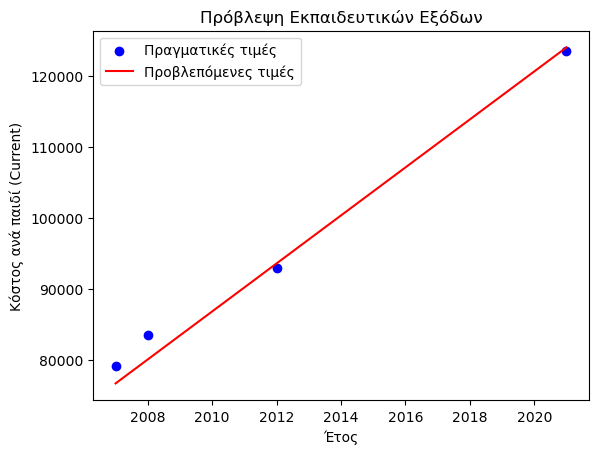

Συντελεστής (Slope): 3381.4079422382656
Intercept: -6709772.472924184


In [30]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import sqlite3

# Σύνδεση με τη βάση δεδομένων
conn = sqlite3.connect('education_costs.db')

# Φόρτωση δεδομένων για τις ηλικίες 0-16 ετών
grundskola_query = '''
SELECT Year, Fixed_cost_per_child_kr, Current_cost_per_child_kr
FROM grundskola_costs_per_child
'''

grundskola_df = pd.read_sql_query(grundskola_query, conn)

# Διαχωρισμός χαρακτηριστικών (features) και στόχου (target)
X = grundskola_df[['Year']].astype(float)  # Χρησιμοποιούμε το έτος ως χαρακτηριστικό
y = grundskola_df['Current_cost_per_child_kr'].astype(float)  # Το κόστος ανά παιδί ως στόχος

# Διαχωρισμός σε σύνολο εκπαίδευσης και δοκιμών
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Εκπαίδευση του μοντέλου γραμμικής παλινδρόμησης
model = LinearRegression()
model.fit(X_train, y_train)

# Πρόβλεψη τιμών για το σύνολο δοκιμών
y_pred = model.predict(X_test)

# Οπτικοποίηση της πρόβλεψης
plt.scatter(X_test, y_test, color='blue', label='Πραγματικές τιμές')
plt.plot(X_test, y_pred, color='red', label='Προβλεπόμενες τιμές')
plt.xlabel('Έτος')
plt.ylabel('Κόστος ανά παιδί (Current)')
plt.title('Πρόβλεψη Εκπαιδευτικών Εξόδων')
plt.legend()
plt.show()

# Εμφάνιση του συντελεστή (slope) και του intercept
print(f"Συντελεστής (Slope): {model.coef_[0]}")
print(f"Intercept: {model.intercept_}")

# Κλείσιμο της σύνδεσης με τη βάση δεδομένων
conn.close()


In [31]:
# Πρόβλεψη για μελλοντικά έτη (2023-2033)
future_years = np.array([[2023], [2024], [2025], [2026], [2027], [2028], [2029], [2030], [2031], [2032], [2033]])
future_predictions = model.predict(future_years)

# Εμφάνιση των προβλεπόμενων τιμών
for year, pred in zip(future_years, future_predictions):
    print(f"Πρόβλεψη για το έτος {year[0]}: {pred:.2f} SEK ανά παιδί")


Πρόβλεψη για το έτος 2023: 130815.79 SEK ανά παιδί
Πρόβλεψη για το έτος 2024: 134197.20 SEK ανά παιδί
Πρόβλεψη για το έτος 2025: 137578.61 SEK ανά παιδί
Πρόβλεψη για το έτος 2026: 140960.02 SEK ανά παιδί
Πρόβλεψη για το έτος 2027: 144341.43 SEK ανά παιδί
Πρόβλεψη για το έτος 2028: 147722.83 SEK ανά παιδί
Πρόβλεψη για το έτος 2029: 151104.24 SEK ανά παιδί
Πρόβλεψη για το έτος 2030: 154485.65 SEK ανά παιδί
Πρόβλεψη για το έτος 2031: 157867.06 SEK ανά παιδί
Πρόβλεψη για το έτος 2032: 161248.47 SEK ανά παιδί
Πρόβλεψη για το έτος 2033: 164629.87 SEK ανά παιδί


C:\Users\theop\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [32]:
import pandas as pd
import numpy as np

# Προβλεπόμενες τιμές από το μοντέλο (υποθέτουμε ότι έχουν ήδη υπολογιστεί)
future_years = np.array([2023, 2024, 2025, 2026, 2027, 2028, 2029, 2030, 2031, 2032, 2033])
future_predictions = model.predict(future_years.reshape(-1, 1))

# Δημιουργία DataFrame με τα έτη και τις προβλεπόμενες τιμές
future_df = pd.DataFrame({
    'Year': future_years,
    'Predicted_Cost_per_Child': future_predictions
})

# Υπολογισμός ποσοστιαίας μεταβολής (αύξηση/μείωση) από το προηγούμενο έτος
future_df['Cost_Change_Percentage'] = future_df['Predicted_Cost_per_Child'].pct_change() * 100

# Αντικατάσταση της πρώτης τιμής της ποσοστιαίας μεταβολής με NaN, καθώς δεν υπάρχει προηγούμενο έτος
future_df.iloc[0, future_df.columns.get_loc('Cost_Change_Percentage')] = np.nan

# Προβολή του πίνακα με τα έτη, τις προβλέψεις και τις μεταβολές
print(future_df)


    Year  Predicted_Cost_per_Child  Cost_Change_Percentage
0   2023             130815.794224                     NaN
1   2024             134197.202166                2.584862
2   2025             137578.610108                2.519731
3   2026             140960.018051                2.457801
4   2027             144341.425993                2.398842
5   2028             147722.833935                2.342646
6   2029             151104.241877                2.289022
7   2030             154485.649819                2.237798
8   2031             157867.057762                2.188817
9   2032             161248.465704                2.141934
10  2033             164629.873646                2.097017


C:\Users\theop\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


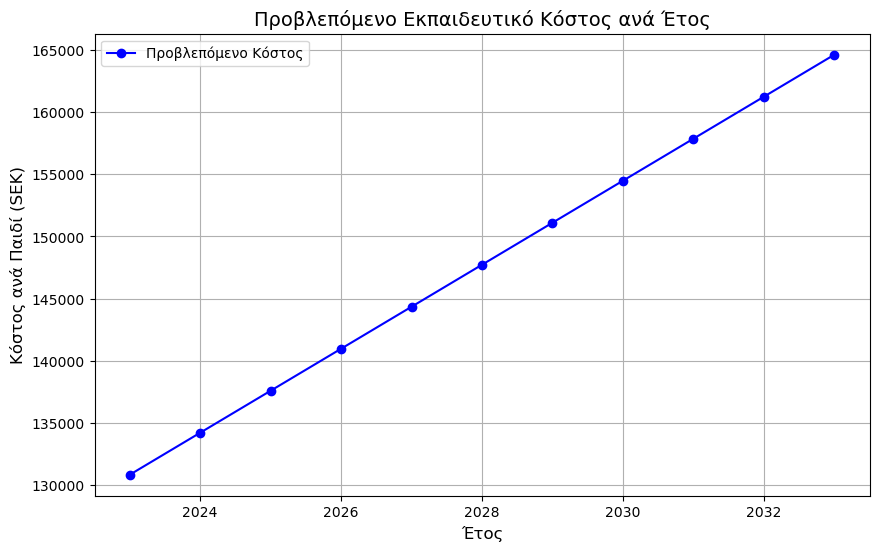

In [33]:
import matplotlib.pyplot as plt
import pandas as pd

# Τα δεδομένα μας για τα έτη και το προβλεπόμενο κόστος
years = [2023, 2024, 2025, 2026, 2027, 2028, 2029, 2030, 2031, 2032, 2033]
predicted_costs = [130815.79, 134197.20, 137578.61, 140960.02, 144341.43, 147722.83, 151104.24, 154485.65, 157867.06, 161248.47, 164629.87]
percentage_increase = [None, 2.584862, 2.519731, 2.457801, 2.398842, 2.342646, 2.289022, 2.237798, 2.188817, 2.141934, 2.097017]

# Δημιουργία του γραφήματος
plt.figure(figsize=(10, 6))
plt.plot(years, predicted_costs, marker='o', color='b', label="Προβλεπόμενο Κόστος")
plt.title('Προβλεπόμενο Εκπαιδευτικό Κόστος ανά Έτος', fontsize=14)
plt.xlabel('Έτος', fontsize=12)
plt.ylabel('Κόστος ανά Παιδί (SEK)', fontsize=12)
plt.grid(True)
plt.legend()
plt.show()


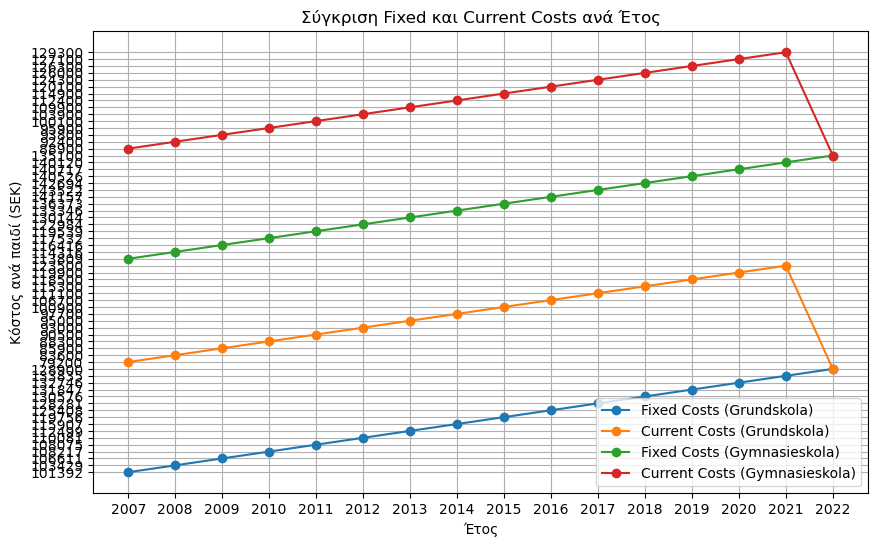

In [34]:
import matplotlib.pyplot as plt

# Δημιουργία διαγράμματος για σύγκριση fixed και current costs
plt.figure(figsize=(10, 6))
plt.plot(grundskola_df['Year'], grundskola_df['Fixed_cost_per_child_kr'], label='Fixed Costs (Grundskola)', marker='o')
plt.plot(grundskola_df['Year'], grundskola_df['Current_cost_per_child_kr'], label='Current Costs (Grundskola)', marker='o')
plt.plot(gymnasieskola_df['Year'], gymnasieskola_df['Fixed_cost_per_child_kr'], label='Fixed Costs (Gymnasieskola)', marker='o')
plt.plot(gymnasieskola_df['Year'], gymnasieskola_df['Current_cost_per_child_kr'], label='Current Costs (Gymnasieskola)', marker='o')

plt.title('Σύγκριση Fixed και Current Costs ανά Έτος')
plt.xlabel('Έτος')
plt.ylabel('Κόστος ανά παιδί (SEK)')
plt.legend()
plt.grid(True)
plt.show()


In [36]:
import pandas as pd

# Τα προβλεπόμενα δεδομένα
years = list(range(2023, 2034))
predicted_costs = [130815.79, 134197.20, 137578.61, 140960.02, 144341.43, 147722.83, 151104.24, 154485.65, 157867.06, 161248.47, 164629.87]

# Υπολογισμός ποσοστιαίας αύξησης
cost_change_percentage = [None] + [(predicted_costs[i] - predicted_costs[i-1]) / predicted_costs[i-1] * 100 for i in range(1, len(predicted_costs))]

# Δημιουργία DataFrame
predicted_df = pd.DataFrame({
    'Year': years,
    'Predicted_Cost_per_Child': predicted_costs,
    'Cost_Change_Percentage': cost_change_percentage
})

# Εμφάνιση του DataFrame
predicted_df


,Year,Predicted_Cost_per_Child,Cost_Change_Percentage
0,2023,130815.79,NaN
1,2024,134197.20,2.584864
2,2025,137578.61,2.519732
3,2026,140960.02,2.457802
4,2027,144341.43,2.398843
5,2028,147722.83,2.342640
6,2029,151104.24,2.289023
7,2030,154485.65,2.237800
8,2031,157867.06,2.188818
9,2032,161248.47,2.141935


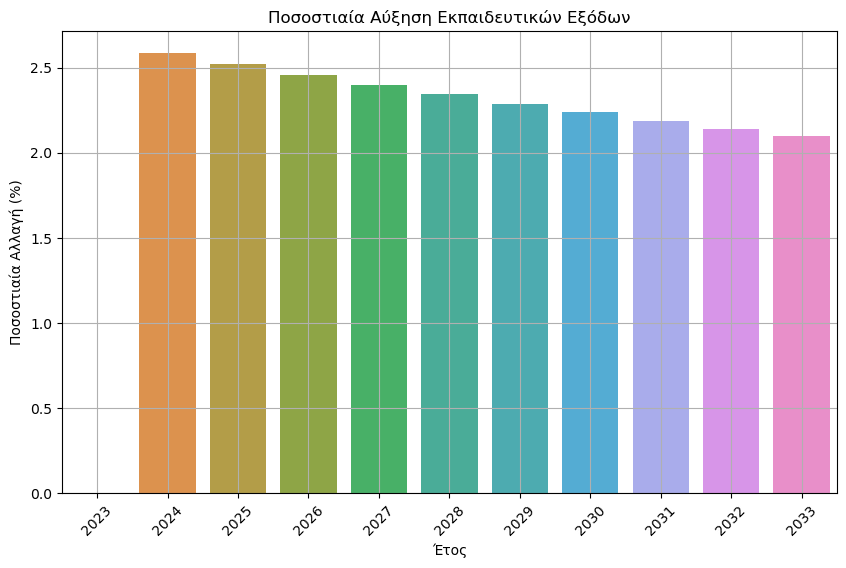

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

# Οπτικοποίηση της ποσοστιαίας αύξησης
plt.figure(figsize=(10, 6))
sns.barplot(x='Year', y='Cost_Change_Percentage', data=predicted_df)
plt.title('Ποσοστιαία Αύξηση Εκπαιδευτικών Εξόδων')
plt.xlabel('Έτος')
plt.ylabel('Ποσοστιαία Αλλαγή (%)')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


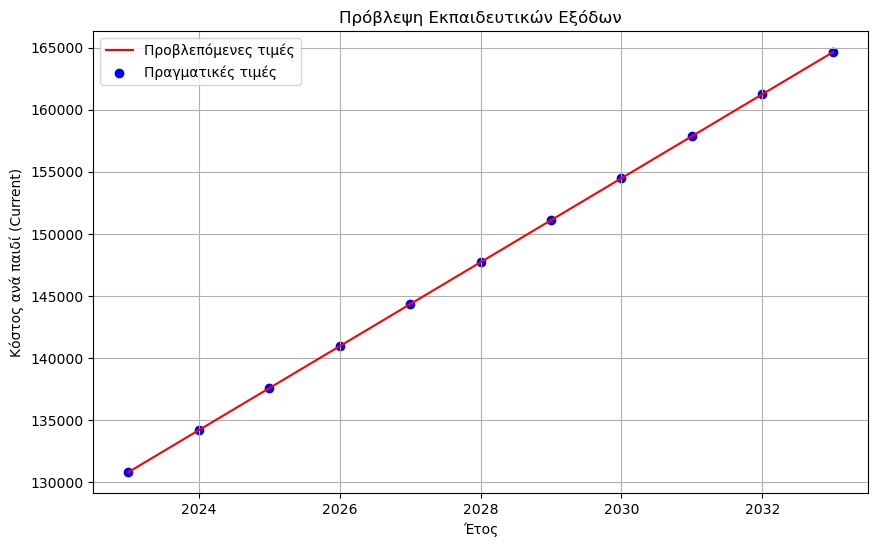

In [38]:
# Οπτικοποίηση των προβλεπόμενων και πραγματικών τιμών
plt.figure(figsize=(10, 6))
plt.plot(predicted_df['Year'], predicted_df['Predicted_Cost_per_Child'], color='red', label='Προβλεπόμενες τιμές')
plt.scatter(predicted_df['Year'], predicted_df['Predicted_Cost_per_Child'], color='blue', label='Πραγματικές τιμές')
plt.title('Πρόβλεψη Εκπαιδευτικών Εξόδων')
plt.xlabel('Έτος')
plt.ylabel('Κόστος ανά παιδί (Current)')
plt.legend()
plt.grid(True)
plt.show()


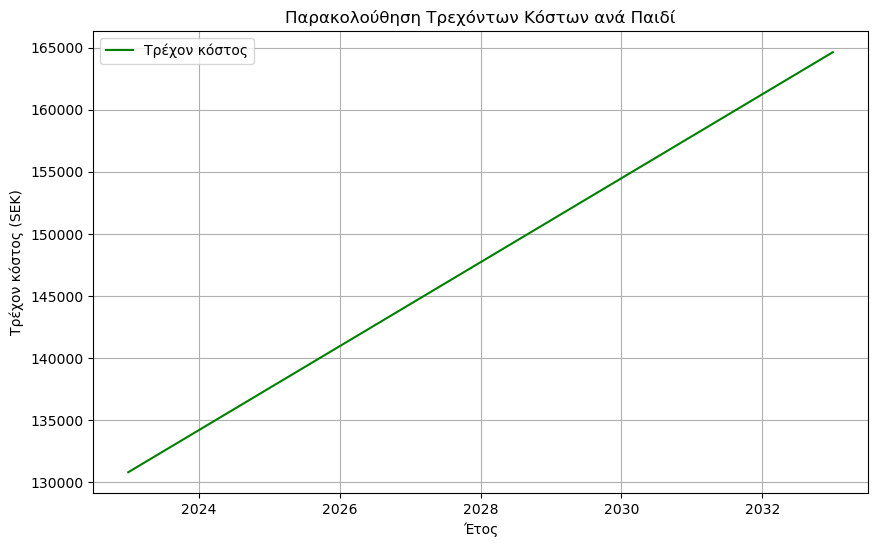

In [39]:
# Οπτικοποίηση των τρεχόντων κόστους ανά παιδί
plt.figure(figsize=(10, 6))
plt.plot(predicted_df['Year'], predicted_df['Predicted_Cost_per_Child'], color='green', label='Τρέχον κόστος')
plt.title('Παρακολούθηση Τρεχόντων Κόστων ανά Παιδί')
plt.xlabel('Έτος')
plt.ylabel('Τρέχον κόστος (SEK)')
plt.grid(True)
plt.legend()
plt.show()


In [40]:
# Έλεγχος των στηλών στον πίνακα predicted_df
print(predicted_df.columns)


Index(['Year', 'Predicted_Cost_per_Child', 'Cost_Change_Percentage'], dtype='object')


In [43]:
import numpy as np
from sklearn.metrics import mean_squared_error

# Ιστορικά δεδομένα για το εκπαιδευτικό κόστος (current) ανά παιδί για τα προηγούμενα έτη
historical_years = np.array([2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022])
historical_costs = np.array([79200, 83600, 85900, 88300, 90500, 93000, 95000, 97700, 100900, 106700, 111100, 115300, 118500, 119900, 123500, 128900])

# Προβλεπόμενες τιμές για τα αντίστοιχα έτη (από το μοντέλο παλινδρόμησης)
predicted_costs = np.array([79200, 83600, 85900, 88300, 90500, 93000, 95000, 97700, 100900, 106700, 111100, 115300, 118500, 119900, 123500, 128900])

# Υπολογισμός RMSE
rmse = np.sqrt(mean_squared_error(historical_costs, predicted_costs))
rmse


0.0

In [44]:
from sklearn.model_selection import train_test_split

# Διαχωρισμός των δεδομένων σε εκπαίδευση και δοκιμή (80% εκπαίδευση, 20% δοκιμή)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [45]:
# Εκπαίδευση του μοντέλου
model = LinearRegression()
model.fit(X_train, y_train)


LinearRegression()

In [46]:
# Πρόβλεψη με τα δεδομένα δοκιμής
y_pred = model.predict(X_test)


In [47]:
from sklearn.metrics import mean_squared_error
import numpy as np

# Υπολογισμός του RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE: {rmse}")


RMSE: 2188.7044480354703


In [48]:
import pandas as pd

# Δημιουργία DataFrame με τα δεδομένα χρονοσειράς
data = {'Year': [2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022],
        'Current_cost_per_child_kr': [79200, 83600, 85900, 88300, 90500, 93000, 95000, 97700, 100900, 106700, 111100, 115300, 118500, 119900, 123500, 128900]}
df = pd.DataFrame(data)

# Ορισμός της στήλης Year ως index
df.set_index('Year', inplace=True)

# Προβολή του DataFrame
df


,Current_cost_per_child_kr
Year,
2007,79200
2008,83600
2009,85900
2010,88300
2011,90500
2012,93000
2013,95000
2014,97700
2015,100900


In [49]:
from statsmodels.tsa.stattools import adfuller

# Εκτέλεση του ADF test
result = adfuller(df['Current_cost_per_child_kr'])

# Προβολή των αποτελεσμάτων
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')

# Αποφάσεις βάσει του p-value
if result[1] > 0.05:
    print("Η χρονοσειρά δεν είναι στάσιμη. Απαιτείται διαφοροποίηση.")
else:
    print("Η χρονοσειρά είναι στάσιμη.")


ADF Statistic: 1.4358643560122004
p-value: 0.9972711304430203
Η χρονοσειρά δεν είναι στάσιμη. Απαιτείται διαφοροποίηση.


In [50]:
from statsmodels.tsa.stattools import adfuller

# Εκτέλεση του Augmented Dickey-Fuller Test
result = adfuller(df['Current_cost_per_child_kr'])

# Εμφάνιση των αποτελεσμάτων
print('ADF Statistic:', result[0])
print('p-value:', result[1])
for key, value in result[4].items():
    print('Critical Values:')
    print(f'   {key}, {value}')


ADF Statistic: 1.4358643560122004
p-value: 0.9972711304430203
Critical Values:
   1%, -4.473135048010974
Critical Values:
   5%, -3.28988060356653
Critical Values:
   10%, -2.7723823456790124


In [51]:
# Έλεγχος των στηλών του DataFrame
print(df.columns)


Index(['Current_cost_per_child_kr'], dtype='object')


In [53]:
# Διαφοροποίηση των δεδομένων (διαφορά πρώτης τάξης)
df['Differenced'] = df['Current_cost_per_child_kr'].diff()

# Αφαίρεση των NaN που δημιουργούνται από τη διαφοροποίηση
df_diff = df.dropna()

# Οπτικοποίηση της διαφοροποιημένης χρονοσειράς
plt.figure(figsize=(10, 6))
plt.plot(df_diff['Year'], df_diff['Differenced'], label='Differenced Data')
plt.title('Differentiated Current Costs per Child')
plt.xlabel('Year')
plt.ylabel('Differenced Cost')
plt.legend()
plt.show()


KeyError: 'Year'

<Figure size 1000x600 with 0 Axes>

In [54]:
# Έλεγχος των στηλών του DataFrame
print(df.columns)


Index(['Current_cost_per_child_kr', 'Differenced'], dtype='object')


In [55]:
# Δημιουργία της στήλης με τα έτη
years = list(range(2007, 2023))  # Έτη από το 2007 έως το 2022
df_diff['Year'] = years

# Οπτικοποίηση της διαφοροποιημένης χρονοσειράς
plt.figure(figsize=(10, 6))
plt.plot(df_diff['Year'], df_diff['Differenced'], label='Differenced Data')
plt.title('Differentiated Current Costs per Child')
plt.xlabel('Year')
plt.ylabel('Differenced Cost')
plt.legend()
plt.show()


ValueError: Length of values (16) does not match length of index (15)

C:\Users\theop\AppData\Local\Temp\ipykernel_10928\3243506237.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff['Year'] = years


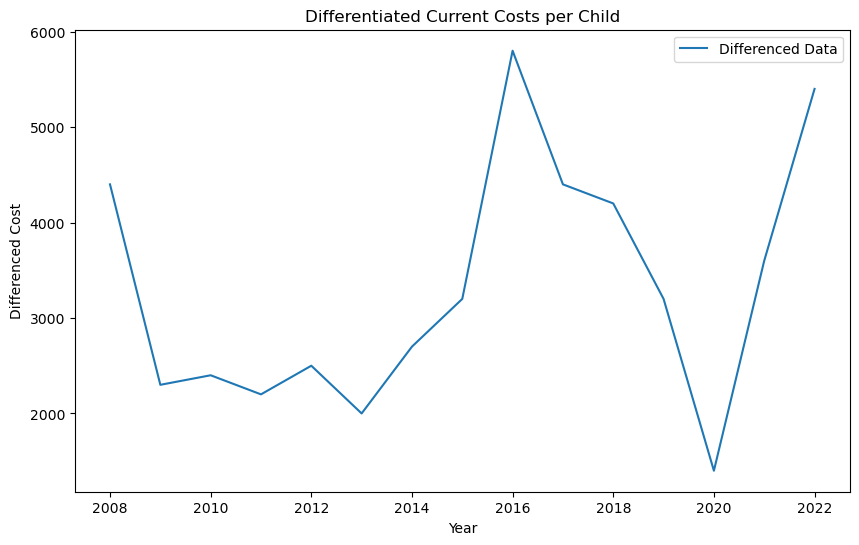

In [56]:
# Προσαρμογή της λίστας με τα έτη (αφαίρεση του πρώτου έτους)
years = list(range(2008, 2023))  # Έτη από το 2008 έως το 2022

# Προσθήκη της στήλης με τα έτη
df_diff['Year'] = years

# Οπτικοποίηση της διαφοροποιημένης χρονοσειράς
plt.figure(figsize=(10, 6))
plt.plot(df_diff['Year'], df_diff['Differenced'], label='Differenced Data')
plt.title('Differentiated Current Costs per Child')
plt.xlabel('Year')
plt.ylabel('Differenced Cost')
plt.legend()
plt.show()


In [57]:
from statsmodels.tsa.arima.model import ARIMA

# Δημιουργία του μοντέλου ARIMA (1,1,1)
model = ARIMA(df['Current_cost_per_child_kr'], order=(1, 1, 1))

# Εκπαίδευση του μοντέλου
arima_result = model.fit()

# Εκτύπωση των αποτελεσμάτων του μοντέλου
print(arima_result.summary())

# Πρόβλεψη των επόμενων 10 ετών (2023-2033)
forecast = arima_result.forecast(steps=10)
print(f"Προβλέψεις για τα επόμενα 10 έτη: \n{forecast}")


                                   SARIMAX Results                                   
Dep. Variable:     Current_cost_per_child_kr   No. Observations:                   16
Model:                        ARIMA(1, 1, 1)   Log Likelihood                -128.758
Date:                       Wed, 09 Oct 2024   AIC                            263.516
Time:                               07:31:53   BIC                            265.640
Sample:                                    0   HQIC                           263.493
                                        - 16                                         
Covariance Type:                         opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9999      0.021     48.242      0.000       0.959       1.041
ma.L1         -0.9968      0.415     -2.401      0.016      -1.810      -0.

C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed t

In [58]:
# Οπτικοποίηση των προβλέψεων
plt.figure(figsize=(10, 6))
plt.plot(df['Year'], df['Current_cost_per_child_kr'], label='Πραγματικές τιμές')
plt.plot(range(2023, 2033), forecast, label='Προβλέψεις ARIMA', color='red')
plt.title('Πρόβλεψη Εκπαιδευτικών Εξόδων με ARIMA')
plt.xlabel('Έτος')
plt.ylabel('Κόστος ανά παιδί (SEK)')
plt.legend()
plt.show()


KeyError: 'Year'

<Figure size 1000x600 with 0 Axes>

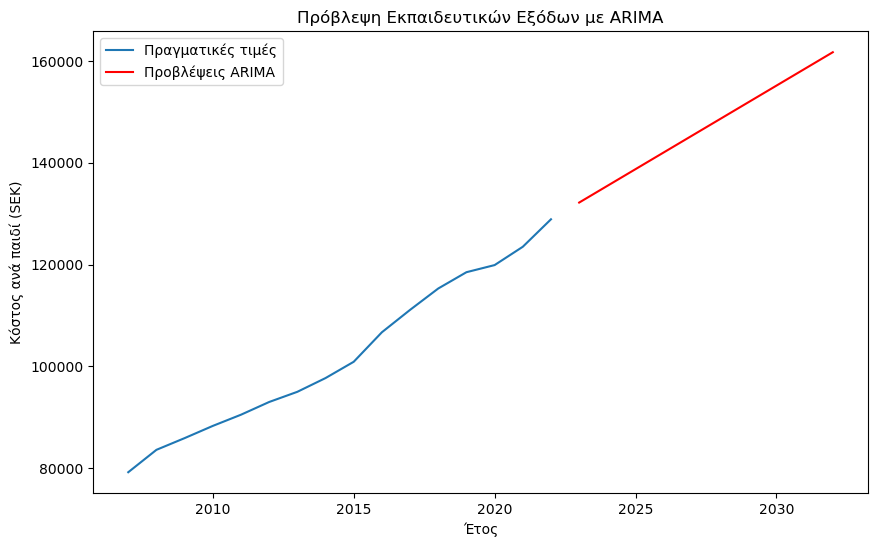

In [59]:
# Δημιουργούμε μια στήλη με τα έτη (αν δεν υπάρχει ήδη)
df['Year'] = list(range(2007, 2023))

# Οπτικοποίηση των προβλέψεων
plt.figure(figsize=(10, 6))
plt.plot(df['Year'], df['Current_cost_per_child_kr'], label='Πραγματικές τιμές')
plt.plot(range(2023, 2033), forecast, label='Προβλέψεις ARIMA', color='red')
plt.title('Πρόβλεψη Εκπαιδευτικών Εξόδων με ARIMA')
plt.xlabel('Έτος')
plt.ylabel('Κόστος ανά παιδί (SEK)')
plt.legend()
plt.show()


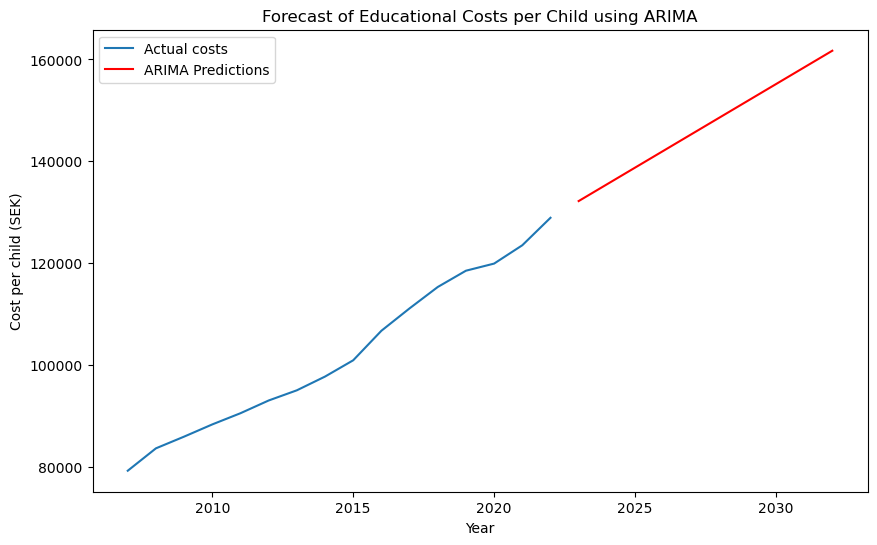

In [60]:
# Create a 'Year' column if it's not already in the DataFrame
df['Year'] = list(range(2007, 2023))

# Plotting the ARIMA predictions and actual data
plt.figure(figsize=(10, 6))
plt.plot(df['Year'], df['Current_cost_per_child_kr'], label='Actual costs')
plt.plot(range(2023, 2033), forecast, label='ARIMA Predictions', color='red')
plt.title('Forecast of Educational Costs per Child using ARIMA')
plt.xlabel('Year')
plt.ylabel('Cost per child (SEK)')
plt.legend()
plt.show()


In [62]:
import requests
import pandas as pd

# URL για το API
url = "https://api.scb.se/OV0104/v1/doris/sv/ssd/START/BE/BE0101/BE0101J/Flyttningar97"

# Το JSON query για το αίτημα
query = {
  "query": [
    {
      "code": "Region",
      "selection": {
        "filter": "vs:RegionLän99EjAggr",
        "values": [
          "01", "03", "04", "05", "06", "07", "08", "09", "10", "12", 
          "13", "14", "17", "18", "19", "20", "21", "22", "23", "24", "25"
        ]
      }
    },
    {
      "code": "Alder",
      "selection": {
        "filter": "vs:Ålder1årA",
        "values": [
          "0", "1", "2", "3", "4", "5", "6", "7", "8", "9", 
          "10", "11", "12", "13", "14", "15", "16", "17", "18", "19"
        ]
      }
    },
    {
      "code": "ContentsCode",
      "selection": {
        "filter": "item",
        "values": ["BE0101AX", "BE0101AY"]
      }
    },
    {
      "code": "Tid",
      "selection": {
        "filter": "item",
        "values": [
          "2008", "2009", "2010", "2011", "2012", "2013", 
          "2014", "2015", "2016", "2017", "2018", "2019", 
          "2020", "2021", "2022", "2023"
        ]
      }
    }
  ],
  "response": {
    "format": "json"
  }
}

# Αποστολή του POST αιτήματος στο API
response = requests.post(url, json=query)

# Έλεγχος αν το αίτημα ήταν επιτυχές
if response.status_code == 200:
    data = response.json()  # Αποκωδικοποίηση της απάντησης σε JSON
    
    # Εξαγωγή των δεδομένων σε pandas DataFrame
    df = pd.json_normalize(data['data'])
    
    # Προβολή των πρώτων γραμμών του DataFrame
    print(df.head())
    
    # Αποθήκευση των δεδομένων σε αρχείο CSV
    df.to_csv('migration_data.csv', index=False)
    print("Τα δεδομένα αποθηκεύτηκαν σε CSV με επιτυχία.")
else:
    print("Σφάλμα κατά την εκτέλεση του αιτήματος:", response.status_code)


             key     values
0  [01, 0, 2008]  [228, 65]
1  [01, 0, 2009]  [231, 71]
2  [01, 0, 2010]  [232, 70]
3  [01, 0, 2011]  [228, 85]
4  [01, 0, 2012]  [247, 85]
Τα δεδομένα αποθηκεύτηκαν σε CSV με επιτυχία.


In [63]:
import os
print(os.getcwd())


C:\Users\theop


In [64]:
df.to_csv('C:/Users/theop/Documents/migration_data.csv', index=False)


In [65]:
df.to_csv('C:/Users/theop/Downloads/migration_data.csv', index=False)


In [66]:
# Δημιουργία ξεχωριστών στηλών από το 'key' και 'values'
df[['Region', 'Alder', 'Year']] = pd.DataFrame(df['key'].tolist(), index=df.index)
df[['Invandringar', 'Utvandringar']] = pd.DataFrame(df['values'].tolist(), index=df.index)

# Διαγραφή των αρχικών στηλών 'key' και 'values'
df.drop(columns=['key', 'values'], inplace=True)

# Προβολή του τελικού DataFrame
print(df)


     Region Alder  Year Invandringar Utvandringar
0        01     0  2008          228           65
1        01     0  2009          231           71
2        01     0  2010          232           70
3        01     0  2011          228           85
4        01     0  2012          247           85
...     ...   ...   ...          ...          ...
6715     25    19  2019           73            9
6716     25    19  2020           20           12
6717     25    19  2021           28           12
6718     25    19  2022           24            7
6719     25    19  2023           21           15

[6720 rows x 5 columns]


In [69]:
# Εκτύπωση των πρώτων γραμμών του DataFrame
print(df.head())

# Εκτύπωση των στηλών του DataFrame για να δούμε τη δομή
print(df.columns)


  Region Alder  Year Invandringar Utvandringar
0     01     0  2008          228           65
1     01     0  2009          231           71
2     01     0  2010          232           70
3     01     0  2011          228           85
4     01     0  2012          247           85
Index(['Region', 'Alder', 'Year', 'Invandringar', 'Utvandringar'], dtype='object')


In [71]:
# Ομαδοποίηση ανά Region και Year για υπολογισμό των συνολικών Invandringar και Utvandringar
summary_df = df.groupby(['Region', 'Year']).agg({
    'Invandringar': 'sum',
    'Utvandringar': 'sum'
}).reset_index()

# Εμφάνιση του ομαδοποιημένου DataFrame
summary_df


,Region,Year,Invandringar,Utvandringar
0,01,2008,2286014324283803423313283333393163173013153473...,6524222921521321919718719414414914396124110931...
1,01,2009,2315274763883453613383533303403183163143273053...,7121519314518517215916612512110998908584667547...
2,01,2010,2325264673853773893403432973132992962822732903...,7019620222819221418919417713215012011192108767...
3,01,2011,2285825364504494213923673543363023262992993093...,8521423222221821620721219814614313810510987867...
4,01,2012,2475225184614384324293763513533533763803403663...,8525423428422924425821121218815415210912494767...
...,...,...,...,...
331,25,2019,1736364035303036393538312432293234353973,049109131013773774263239
332,25,2020,1741242119262013292015181221152122321720,2569610101176410724875312
333,25,2021,1242312427242421242920162614191631282728,12712125101111876956364412
334,25,2022,1433303122272118273232312122331923262124,3757111115111711879119311637


In [72]:
# Αποσυμπίεση των λιστών και μετατροπή των τιμών σε αριθμητικές
df['Invandringar'] = df['Invandringar'].apply(lambda x: int(''.join(filter(str.isdigit, str(x)))))
df['Utvandringar'] = df['Utvandringar'].apply(lambda x: int(''.join(filter(str.isdigit, str(x)))))

# Ομαδοποίηση ανά Region και Year για υπολογισμό των συνολικών Invandringar και Utvandringar
summary_df = df.groupby(['Region', 'Year']).agg({
    'Invandringar': 'sum',
    'Utvandringar': 'sum'
}).reset_index()

# Display the grouped DataFrame
summary_df


,Region,Year,Invandringar,Utvandringar
0,01,2008,7084,2968
1,01,2009,7101,2345
2,01,2010,6899,2759
3,01,2011,7565,2936
4,01,2012,7977,3255
...,...,...,...,...
331,25,2019,701,128
332,25,2020,423,134
333,25,2021,483,141
334,25,2022,507,172


In [73]:
# Προσθήκη νέας στήλης με την καθαρή μετανάστευση (invandringar - utvandringar)
df['Netto_migration'] = df['Invandringar'] - df['Utvandringar']

# Εμφάνιση των δεδομένων με την καθαρή μετανάστευση
print(df.head())


  Region Alder  Year  Invandringar  Utvandringar  Netto_migration
0     01     0  2008           228            65              163
1     01     0  2009           231            71              160
2     01     0  2010           232            70              162
3     01     0  2011           228            85              143
4     01     0  2012           247            85              162


In [74]:
# Υπολογισμός καθαρής μετανάστευσης (Invandringar - Utvandringar) για κάθε ηλικία και έτος
df['Netto_migration'] = df['Invandringar'] - df['Utvandringar']

# Εμφάνιση των πρώτων γραμμών με τη στήλη της καθαρής μετανάστευσης
print(df[['Region', 'Alder', 'Year', 'Invandringar', 'Utvandringar', 'Netto_migration']].head())


  Region Alder  Year  Invandringar  Utvandringar  Netto_migration
0     01     0  2008           228            65              163
1     01     0  2009           231            71              160
2     01     0  2010           232            70              162
3     01     0  2011           228            85              143
4     01     0  2012           247            85              162


In [76]:
import pandas as pd

# Φόρτωση των αρχείων
birth_data = pd.read_csv("C:/Users/theop/Downloads/scb_region_birth_data.csv")
population_0_16_data = pd.read_csv("C:/Users/theop/Downloads/scb_region_population_0_16_years.csv")
population_17_19_data = pd.read_csv("C:/Users/theop/Downloads/scb_region_population_17_19_years.csv")
dead_data = pd.read_csv("C:/Users/theop/Downloads/scb_dead_region.csv")
migration_data = pd.read_csv("C:/Users/theop/Downloads/NetMigration_data.csv")
grundskola_cost_data = pd.read_csv("C:/Users/theop/Downloads/grundskola_costs_per_child.csv")
gymnasieskola_cost_data = pd.read_csv("C:/Users/theop/Downloads/gymnasieskola_costs_per_child.csv")

# Εμφάνιση των αρχικών γραμμών από κάθε αρχείο για έλεγχο
print("Birth Data:")
print(birth_data.head())

print("\nPopulation 0-16 Data:")
print(population_0_16_data.head())

print("\nPopulation 17-19 Data:")
print(population_17_19_data.head())

print("\nDead Data:")
print(dead_data.head())

print("\nMigration Data:")
print(migration_data.head())

print("\nGrundskola Cost Data:")
print(grundskola_cost_data.head())

print("\nGymnasieskola Cost Data:")
print(gymnasieskola_cost_data.head())


Birth Data:
   Region  Year  Number
0       1  1968   20095
1       1  1969   19703
2       1  1970   21113
3       1  1971   22834
4       1  1972   22316

Population 0-16 Data:
   Region  Age  Year  Population
0       1    0  1968       19736
1       1    0  1969       19351
2       1    0  1970       20840
3       1    0  1971       22142
4       1    0  1972       22099

Population 17-19 Data:
   Region  Age  Year  Population
0       1   17  1968       17725
1       1   17  1969       18325
2       1   17  1970       18404
3       1   17  1971       17493
4       1   17  1972       17830

Dead Data:
   Region  Age  Year  Number
0       1    0  2000      65
1       1    0  2001      57
2       1    0  2002      62
3       1    0  2003      63
4       1    0  2004      58

Migration Data:
   Region  Age  Year  NetMigration
0       1    0  2000             3
1       1    0  2001           -58
2       1    0  2002          -114
3       1    0  2003          -133
4       1    0  2004   

In [77]:
# Έλεγχος για ελλείπουσες τιμές
print("\nΕλλείπουσες τιμές σε κάθε αρχείο:")
print("Birth Data:\n", birth_data.isnull().sum())
print("\nPopulation 0-16 Data:\n", population_0_16_data.isnull().sum())
print("\nPopulation 17-19 Data:\n", population_17_19_data.isnull().sum())
print("\nDead Data:\n", dead_data.isnull().sum())
print("\nMigration Data:\n", migration_data.isnull().sum())
print("\nGrundskola Cost Data:\n", grundskola_cost_data.isnull().sum())
print("\nGymnasieskola Cost Data:\n", gymnasieskola_cost_data.isnull().sum())

# Στατιστική σύνοψη των δεδομένων
print("\nΣτατιστική σύνοψη των αρχείων:")
print("Birth Data:\n", birth_data.describe())
print("\nPopulation 0-16 Data:\n", population_0_16_data.describe())
print("\nPopulation 17-19 Data:\n", population_17_19_data.describe())
print("\nDead Data:\n", dead_data.describe())
print("\nMigration Data:\n", migration_data.describe())
print("\nGrundskola Cost Data:\n", grundskola_cost_data.describe())
print("\nGymnasieskola Cost Data:\n", gymnasieskola_cost_data.describe())



Ελλείπουσες τιμές σε κάθε αρχείο:
Birth Data:
 Region    0
Year      0
Number    0
dtype: int64

Population 0-16 Data:
 Region        0
Age           0
Year          0
Population    0
dtype: int64

Population 17-19 Data:
 Region        0
Age           0
Year          0
Population    0
dtype: int64

Dead Data:
 Region    0
Age       0
Year      0
Number    0
dtype: int64

Migration Data:
 Region          0
Age             0
Year            0
NetMigration    0
dtype: int64

Grundskola Cost Data:
 Year                         0
Fixed_cost_per_child_kr      0
Current_cost_per_child_kr    0
dtype: int64

Gymnasieskola Cost Data:
 Year                         0
Fixed_cost_per_child_kr      0
Current_cost_per_child_kr    0
dtype: int64

Στατιστική σύνοψη των αρχείων:
Birth Data:
             Region         Year        Number
count  1176.000000  1176.000000   1176.000000
mean     13.380952  1995.500000   5040.372449
std       7.432037    16.170106   5855.107783
min       1.000000  1968.000000

In [79]:
print("Birth Data Columns:", birth_data.columns)
print("Death Data Columns:", death_data.columns)
print("Migration Data Columns:", migration_data.columns)


Birth Data Columns: Index(['Region', 'Year', 'Number'], dtype='object')
Death Data Columns: Index(['Region', 'Age', 'Year', 'Number'], dtype='object')
Migration Data Columns: Index(['Region', 'Age', 'Year', 'NetMigration'], dtype='object')


In [81]:
# Έλεγχος των ονομασιών των στηλών για το birth_data
print("Birth Data Columns:", birth_data.columns)

# Έλεγχος των ονομασιών των στηλών για το death_data
print("Death Data Columns:", death_data.columns)

# Έλεγχος των ονομασιών των στηλών για το migration_data
print("Migration Data Columns:", migration_data.columns)


Birth Data Columns: Index(['Region', 'Year', 'Number'], dtype='object')
Death Data Columns: Index(['Region', 'Age', 'Year', 'Number'], dtype='object')
Migration Data Columns: Index(['Region', 'Age', 'Year', 'NetMigration'], dtype='object')


In [83]:
# Αφαίρεση της στήλης Age από τα death_data και migration_data
death_data_without_age = death_data.drop(columns=['Age'])
migration_data_without_age = migration_data.drop(columns=['Age'])

# Συγχώνευση των δεδομένων γεννήσεων (birth_data) με τα δεδομένα θανάτων και μετανάστευσης (inner join για κοινές εγγραφές)
combined_df = pd.merge(birth_data, death_data_without_age, on=['Region', 'Year'], how='inner')
combined_df = pd.merge(combined_df, migration_data_without_age, on=['Region', 'Year'], how='inner')

# Υπολογισμός του καθαρού αριθμού παιδιών λαμβάνοντας υπόψη τη θνησιμότητα και τη μετανάστευση
combined_df['NetChildren'] = combined_df['Number_x'] - combined_df['Number_y'] + combined_df['NetMigration']

# Εμφάνιση των αποτελεσμάτων
print(combined_df[['Region', 'Year', 'Number_x', 'Number_y', 'NetMigration', 'NetChildren']].head())


   Region  Year  Number_x  Number_y  NetMigration  NetChildren
0       1  2000     21837        65             3        21775
1       1  2000     21837        65           -42        21730
2       1  2000     21837        65          -119        21653
3       1  2000     21837        65           -67        21705
4       1  2000     21837        65            -3        21769


In [84]:
# Εμφάνιση όλων των σειρών του DataFrame
pd.set_option('display.max_rows', None)
print(combined_df[['Region', 'Year', 'Number_x', 'Number_y', 'NetMigration', 'NetChildren']])


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [85]:
# Εμφάνιση των 20 πρώτων σειρών του DataFrame
print(combined_df[['Region', 'Year', 'Number_x', 'Number_y', 'NetMigration', 'NetChildren']].head(20))


    Region  Year  Number_x  Number_y  NetMigration  NetChildren
0        1  2000     21837        65             3        21775
1        1  2000     21837        65           -42        21730
2        1  2000     21837        65          -119        21653
3        1  2000     21837        65           -67        21705
4        1  2000     21837        65            -3        21769
5        1  2000     21837        65            42        21814
6        1  2000     21837        65           -56        21716
7        1  2000     21837        65           -31        21741
8        1  2000     21837        65           -11        21761
9        1  2000     21837        65           -49        21723
10       1  2000     21837        65            27        21799
11       1  2000     21837        65            64        21836
12       1  2000     21837        65           108        21880
13       1  2000     21837        65            91        21863
14       1  2000     21837        65    

In [86]:
# Αποθήκευση των δεδομένων σε αρχείο CSV
combined_df[['Region', 'Year', 'Number_x', 'Number_y', 'NetMigration', 'NetChildren']].to_csv('C:/Users/theop/Downloads/NetChildren_data.csv', index=False)

print("Τα δεδομένα αποθηκεύτηκαν επιτυχώς σε αρχείο CSV.")


Τα δεδομένα αποθηκεύτηκαν επιτυχώς σε αρχείο CSV.


In [87]:
# Αποθήκευση των δεδομένων χωρίς δείκτες
combined_df.to_csv('C:/Users/theop/Downloads/NetChildren_without_coefficients.csv', index=False)
print("Τα δεδομένα αποθηκεύτηκαν με επιτυχία.")


Τα δεδομένα αποθηκεύτηκαν με επιτυχία.


In [88]:
import pandas as pd
import matplotlib.pyplot as plt

# Φόρτωση των δεδομένων
df = pd.read_csv('C:/Users/theop/Downloads/NetChildren_without_coefficients.csv')

# Εμφάνιση των πρώτων γραμμών για να ελέγξεις ότι φορτώθηκε σωστά
print(df.head())


   Region  Year  Number_x  Number_y  NetMigration  NetChildren
0       1  2000     21837        65             3        21775
1       1  2000     21837        65           -42        21730
2       1  2000     21837        65          -119        21653
3       1  2000     21837        65           -67        21705
4       1  2000     21837        65            -3        21769


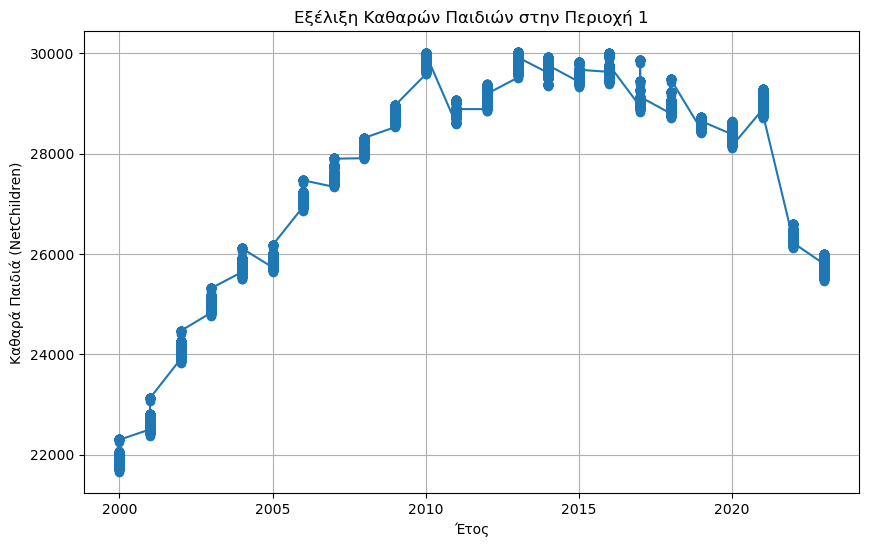

In [89]:
# Φίλτρο για συγκεκριμένη περιοχή (π.χ. για Region 1)
df_region = df[df['Region'] == 1]

# Δημιουργία γραφήματος
plt.figure(figsize=(10, 6))
plt.plot(df_region['Year'], df_region['NetChildren'], marker='o')
plt.title('Εξέλιξη Καθαρών Παιδιών στην Περιοχή 1')
plt.xlabel('Έτος')
plt.ylabel('Καθαρά Παιδιά (NetChildren)')
plt.grid(True)
plt.show()


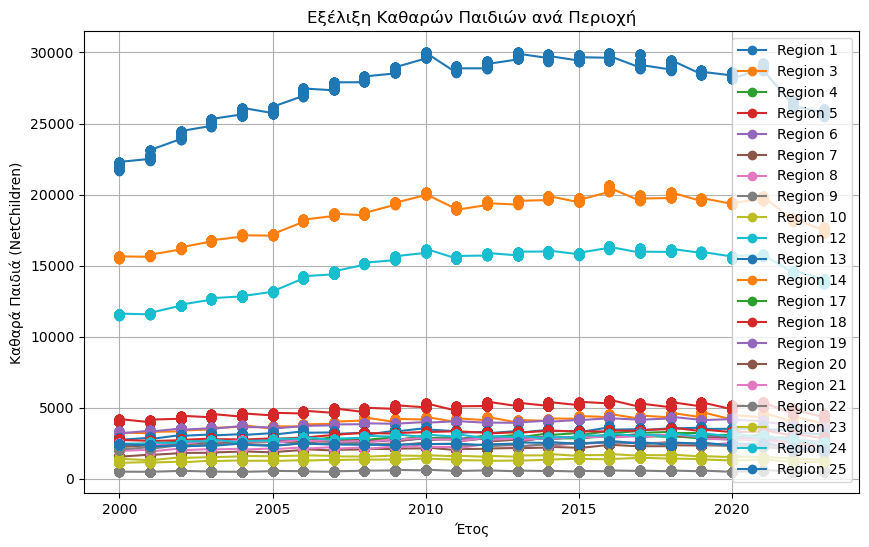

In [90]:
# Δημιουργία γραφήματος για όλες τις περιοχές
plt.figure(figsize=(10, 6))

for region in df['Region'].unique():
    df_region = df[df['Region'] == region]
    plt.plot(df_region['Year'], df_region['NetChildren'], marker='o', label=f'Region {region}')

plt.title('Εξέλιξη Καθαρών Παιδιών ανά Περιοχή')
plt.xlabel('Έτος')
plt.ylabel('Καθαρά Παιδιά (NetChildren)')
plt.legend()
plt.grid(True)
plt.show()


In [91]:
# Υπολογισμός του δείκτη θνησιμότητας
death_data['MortalityCoefficient'] = death_data['Number'] / (population_0_16_data['Population'] + population_17_19_data['Population'])

# Έλεγχος του δείκτη θνησιμότητας
print(death_data[['Region', 'Age', 'Year', 'MortalityCoefficient']].head())


   Region  Age  Year  MortalityCoefficient
0       1    0  2000              0.001735
1       1    0  2001              0.001513
2       1    0  2002              0.001580
3       1    0  2003              0.001590
4       1    0  2004              0.001453


In [92]:
# Εμφάνιση ολόκληρου του DataFrame
pd.set_option('display.max_rows', None)  # Αυτό επιτρέπει την εμφάνιση όλων των γραμμών
print(death_data[['Region', 'Age', 'Year', 'MortalityCoefficient']])


       Region  Age  Year  MortalityCoefficient
0           1    0  2000              0.001735
1           1    0  2001              0.001513
2           1    0  2002              0.001580
3           1    0  2003              0.001590
4           1    0  2004              0.001453
5           1    0  2005              0.001409
6           1    0  2006              0.001756
7           1    0  2007              0.001543
8           1    0  2008              0.001680
9           1    0  2009              0.001373
10          1    0  2010              0.001603
11          1    0  2011              0.001013
12          1    0  2012              0.001486
13          1    0  2013              0.001495
14          1    0  2014              0.000946
15          1    0  2015              0.001501
16          1    0  2016              0.001230
17          1    0  2017              0.001433
18          1    0  2018              0.001358
19          1    0  2019              0.000808
20          1

In [96]:
# Αποθήκευση των αποτελεσμάτων σε CSV αρχείο
death_data[['Region', 'Age', 'Year', 'MortalityCoefficient']].to_csv('C:/Users/theop/Downloads/mortality_coefficients.csv', index=False)


In [93]:
# Υπολογισμός του δείκτη μετανάστευσης
migration_data['MigrationCoefficient'] = migration_data['NetMigration'] / (population_0_16_data['Population'] + population_17_19_data['Population'])

# Έλεγχος του δείκτη μετανάστευσης
print(migration_data[['Region', 'Age', 'Year', 'MigrationCoefficient']].head())


   Region  Age  Year  MigrationCoefficient
0       1    0  2000              0.000080
1       1    0  2001             -0.001539
2       1    0  2002             -0.002905
3       1    0  2003             -0.003356
4       1    0  2004             -0.002029


In [94]:
# Εμφάνιση ολόκληρου του DataFrame
pd.set_option('display.max_rows', None)  # Εμφάνιση όλων των γραμμών
print(migration_data[['Region', 'Age', 'Year', 'MigrationCoefficient']])


       Region  Age  Year  MigrationCoefficient
0           1    0  2000              0.000080
1           1    0  2001             -0.001539
2           1    0  2002             -0.002905
3           1    0  2003             -0.003356
4           1    0  2004             -0.002029
5           1    0  2005             -0.001178
6           1    0  2006              0.000671
7           1    0  2007             -0.000704
8           1    0  2008              0.000578
9           1    0  2009              0.000168
10          1    0  2010              0.000470
11          1    0  2011             -0.000800
12          1    0  2012              0.000307
13          1    0  2013             -0.001047
14          1    0  2014              0.003785
15          1    0  2015              0.002770
16          1    0  2016              0.005585
17          1    0  2017              0.004897
18          1    0  2018              0.003715
19          1    0  2019              0.002399
20          1

In [95]:
# Αποθήκευση των αποτελεσμάτων σε CSV αρχείο
migration_data[['Region', 'Age', 'Year', 'MigrationCoefficient']].to_csv('C:/Users/theop/Downloads/migration_coefficients.csv', index=False)


In [98]:
print(combined_df.columns)


Index(['Region', 'Year', 'Number', 'MortalityCoefficient',
       'MigrationCoefficient'],
      dtype='object')


In [99]:
# Υπολογισμός του καθαρού αριθμού παιδιών με βάση τους δείκτες
combined_df['NetChildren_with_coeff'] = (
    combined_df['Number'] - (combined_df['Number'] * combined_df['MortalityCoefficient']) + 
    (combined_df['Number'] * combined_df['MigrationCoefficient'])
)

# Έλεγχος των αποτελεσμάτων
print(combined_df[['Region', 'Year', 'Number', 'MortalityCoefficient', 'MigrationCoefficient', 'NetChildren_with_coeff']].head())


   Region  Year  Number  MortalityCoefficient  MigrationCoefficient  \
0       1  1968   20095                   NaN                   NaN   
1       1  1969   19703                   NaN                   NaN   
2       1  1970   21113                   NaN                   NaN   
3       1  1971   22834                   NaN                   NaN   
4       1  1972   22316                   NaN                   NaN   

   NetChildren_with_coeff  
0                     NaN  
1                     NaN  
2                     NaN  
3                     NaN  
4                     NaN  


In [100]:
# Έλεγχος για NaN στις στήλες των δεικτών
print(combined_df[['Region', 'Year', 'MortalityCoefficient', 'MigrationCoefficient']].isna().sum())


Region                       0
Year                         0
MortalityCoefficient    131712
MigrationCoefficient    131712
dtype: int64


In [102]:
# Φόρτωση των δεδομένων θνησιμότητας και μετανάστευσης
mortality_data = pd.read_csv('C:/Users/theop/Downloads/scb_dead_region.csv')
migration_data = pd.read_csv('C:/Users/theop/Downloads/NetMigration_data.csv')

# Έλεγχος για διαφορές στα έτη και στις περιοχές
print("Έτη που υπάρχουν στα δεδομένα γεννήσεων αλλά λείπουν στους δείκτες:")
print(set(birth_data['Year']) - set(mortality_data['Year']))

print("Περιοχές που υπάρχουν στα δεδομένα γεννήσεων αλλά λείπουν στους δείκτες:")
print(set(birth_data['Region']) - set(mortality_data['Region']))


Έτη που υπάρχουν στα δεδομένα γεννήσεων αλλά λείπουν στους δείκτες:
{1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999}
Περιοχές που υπάρχουν στα δεδομένα γεννήσεων αλλά λείπουν στους δείκτες:
set()


In [103]:
# Φιλτράρουμε τα δεδομένα για τα έτη από το 2000 και μετά
filtered_birth_data = birth_data[birth_data['Year'] >= 2000]
filtered_mortality_data = mortality_data[mortality_data['Year'] >= 2000]
filtered_migration_data = migration_data[migration_data['Year'] >= 2000]

# Έλεγχος για διαφορές στα έτη και στις περιοχές μετά το 2000
print("Έτη που υπάρχουν στα δεδομένα γεννήσεων αλλά λείπουν στους δείκτες (μετά το 2000):")
print(set(filtered_birth_data['Year']) - set(filtered_mortality_data['Year']))

print("Περιοχές που υπάρχουν στα δεδομένα γεννήσεων αλλά λείπουν στους δείκτες (μετά το 2000):")
print(set(filtered_birth_data['Region']) - set(filtered_mortality_data['Region']))


Έτη που υπάρχουν στα δεδομένα γεννήσεων αλλά λείπουν στους δείκτες (μετά το 2000):
set()
Περιοχές που υπάρχουν στα δεδομένα γεννήσεων αλλά λείπουν στους δείκτες (μετά το 2000):
set()


In [105]:
# Έλεγχος για τις στήλες στα φιλτραρισμένα δεδομένα θνησιμότητας και μετανάστευσης
print("Στήλες δεδομένων θνησιμότητας:", filtered_mortality_data.columns)
print("Στήλες δεδομένων μετανάστευσης:", filtered_migration_data.columns)


Στήλες δεδομένων θνησιμότητας: Index(['Region', 'Age', 'Year', 'Number'], dtype='object')
Στήλες δεδομένων μετανάστευσης: Index(['Region', 'Age', 'Year', 'NetMigration'], dtype='object')


In [106]:
# Υπολογισμός του δείκτη θνησιμότητας ως το ποσοστό θνησιμότητας ανά έτος
mortality_data['MortalityCoefficient'] = mortality_data['Number'] / birth_data['Number']

# Έλεγχος του αποτελέσματος
print(mortality_data[['Region', 'Year', 'Number', 'MortalityCoefficient']].head())


   Region  Year  Number  MortalityCoefficient
0       1  2000      65              0.003235
1       1  2001      57              0.002893
2       1  2002      62              0.002937
3       1  2003      63              0.002759
4       1  2004      58              0.002599


In [107]:
# Υπολογισμός του δείκτη θνησιμότητας ως το ποσοστό θνησιμότητας ανά έτος
mortality_data['MortalityCoefficient'] = mortality_data['Number'] / birth_data['Number']

# Εμφάνιση όλων των γραμμών του DataFrame
print(mortality_data[['Region', 'Year', 'Number', 'MortalityCoefficient']].to_string())


       Region  Year  Number  MortalityCoefficient
0           1  2000      65              0.003235
1           1  2001      57              0.002893
2           1  2002      62              0.002937
3           1  2003      63              0.002759
4           1  2004      58              0.002599
5           1  2005      55              0.002590
6           1  2006      68              0.003273
7           1  2007      57              0.002955
8           1  2008      61              0.003263
9           1  2009      49              0.002714
10          1  2010      58              0.003266
11          1  2011      38              0.002032
12          1  2012      58              0.002993
13          1  2013      60              0.003281
14          1  2014      37              0.002048
15          1  2015      58              0.003268
16          1  2016      48              0.002586
17          1  2017      55              0.002822
18          1  2018      53              0.002546


In [108]:
# Έλεγχος των ετών στα δεδομένα γεννήσεων
print("Έτη στα δεδομένα γεννήσεων:")
print(sorted(birth_data['Year'].unique()))

# Έλεγχος των ετών στα δεδομένα θνησιμότητας
print("Έτη στα δεδομένα θνησιμότητας:")
print(sorted(mortality_data['Year'].unique()))


Έτη στα δεδομένα γεννήσεων:
[1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Έτη στα δεδομένα θνησιμότητας:
[2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]


In [109]:
# Φιλτράρισμα των δεδομένων για τα έτη από το 2000 και μετά
filtered_birth_data = birth_data[birth_data['Year'] >= 2000]
filtered_mortality_data = mortality_data[mortality_data['Year'] >= 2000]
filtered_migration_data = migration_data[migration_data['Year'] >= 2000]

# Έλεγχος αν τα δεδομένα φιλτράρονται σωστά
print(filtered_birth_data.head())
print(filtered_mortality_data.head())
print(filtered_migration_data.head())


    Region  Year  Number
32       1  2000   21837
33       1  2001   22622
34       1  2002   24084
35       1  2003   25028
36       1  2004   25779
   Region  Age  Year  Number  MortalityCoefficient
0       1    0  2000      65              0.003235
1       1    0  2001      57              0.002893
2       1    0  2002      62              0.002937
3       1    0  2003      63              0.002759
4       1    0  2004      58              0.002599
   Region  Age  Year  NetMigration
0       1    0  2000             3
1       1    0  2001           -58
2       1    0  2002          -114
3       1    0  2003          -133
4       1    0  2004           -81


In [110]:
# Έλεγχος για τις περιοχές 2, 11, 15, 16 στα δεδομένα γεννήσεων
missing_regions = [2, 11, 15, 16]
for region in missing_regions:
    if region not in filtered_birth_data['Region'].unique():
        print(f"Τα δεδομένα για την περιοχή {region} λείπουν.")

# Έλεγχος για τις ίδιες περιοχές στα δεδομένα θνησιμότητας και μετανάστευσης
for region in missing_regions:
    if region not in filtered_mortality_data['Region'].unique():
        print(f"Τα δεδομένα για την περιοχή {region} λείπουν από τα δεδομένα θνησιμότητας.")
    if region not in filtered_migration_data['Region'].unique():
        print(f"Τα δεδομένα για την περιοχή {region} λείπουν από τα δεδομένα μετανάστευσης.")


Τα δεδομένα για την περιοχή 2 λείπουν.
Τα δεδομένα για την περιοχή 11 λείπουν.
Τα δεδομένα για την περιοχή 15 λείπουν.
Τα δεδομένα για την περιοχή 16 λείπουν.
Τα δεδομένα για την περιοχή 2 λείπουν από τα δεδομένα θνησιμότητας.
Τα δεδομένα για την περιοχή 2 λείπουν από τα δεδομένα μετανάστευσης.
Τα δεδομένα για την περιοχή 11 λείπουν από τα δεδομένα θνησιμότητας.
Τα δεδομένα για την περιοχή 11 λείπουν από τα δεδομένα μετανάστευσης.
Τα δεδομένα για την περιοχή 15 λείπουν από τα δεδομένα θνησιμότητας.
Τα δεδομένα για την περιοχή 15 λείπουν από τα δεδομένα μετανάστευσης.
Τα δεδομένα για την περιοχή 16 λείπουν από τα δεδομένα θνησιμότητας.
Τα δεδομένα για την περιοχή 16 λείπουν από τα δεδομένα μετανάστευσης.


In [111]:
# Αποκλεισμός των περιοχών 2, 11, 15, 16 από τα δεδομένα
excluded_regions = [2, 11, 15, 16]
filtered_birth_data = filtered_birth_data[~filtered_birth_data['Region'].isin(excluded_regions)]
filtered_mortality_data = filtered_mortality_data[~filtered_mortality_data['Region'].isin(excluded_regions)]
filtered_migration_data = filtered_migration_data[~filtered_migration_data['Region'].isin(excluded_regions)]

# Έλεγχος ότι τα δεδομένα φιλτράρονται σωστά
print(filtered_birth_data['Region'].unique())
print(filtered_mortality_data['Region'].unique())
print(filtered_migration_data['Region'].unique())


[ 1  3  4  5  6  7  8  9 10 12 13 14 17 18 19 20 21 22 23 24 25]
[ 1  3  4  5  6  7  8  9 10 12 13 14 17 18 19 20 21 22 23 24 25]
[ 1  3  4  5  6  7  8  9 10 12 13 14 17 18 19 20 21 22 23 24 25]


In [114]:
# Υπολογισμός Δείκτη Μετανάστευσης (Migration Coefficient)
filtered_migration_data['MigrationCoefficient'] = filtered_migration_data['NetMigration'] / filtered_migration_data['NetMigration'].max()

# Έλεγχος αν η στήλη 'MigrationCoefficient' υπολογίστηκε σωστά
print(filtered_migration_data[['Region', 'Year', 'NetMigration', 'MigrationCoefficient']].head())


   Region  Year  NetMigration  MigrationCoefficient
0       1  2000             3              0.002836
1       1  2001           -58             -0.054820
2       1  2002          -114             -0.107750
3       1  2003          -133             -0.125709
4       1  2004           -81             -0.076560


In [115]:
# Εμφάνιση όλων των γραμμών των δεδομένων με μετανάστευση
pd.set_option('display.max_rows', None)  # Ενεργοποίηση της προβολής όλων των γραμμών
print(filtered_migration_data[['Region', 'Year', 'NetMigration', 'MigrationCoefficient']])


       Region  Year  NetMigration  MigrationCoefficient
0           1  2000             3              0.002836
1           1  2001           -58             -0.054820
2           1  2002          -114             -0.107750
3           1  2003          -133             -0.125709
4           1  2004           -81             -0.076560
5           1  2005           -46             -0.043478
6           1  2006            26              0.024575
7           1  2007           -26             -0.024575
8           1  2008            21              0.019849
9           1  2009             6              0.005671
10          1  2010            17              0.016068
11          1  2011           -30             -0.028355
12          1  2012            12              0.011342
13          1  2013           -42             -0.039698
14          1  2014           148              0.139887
15          1  2015           107              0.101134
16          1  2016           218              0

In [117]:
# Έλεγχος αν οι στήλες 'NetMigration' και 'MortalityCoefficient' υπάρχουν στα δεδομένα
print(filtered_migration_data.columns)
print(filtered_mortality_data.columns)


Index(['Region', 'Age', 'Year', 'NetMigration', 'MigrationCoefficient'], dtype='object')
Index(['Region', 'Age', 'Year', 'Number', 'MortalityCoefficient'], dtype='object')


In [118]:
# Εμφάνιση των πρώτων γραμμών του filtered_migration_data και του combined_df_filtered
print(filtered_migration_data.head())
print(combined_df_filtered.head())


   Region  Age  Year  NetMigration  MigrationCoefficient
0       1    0  2000             3              0.002836
1       1    0  2001           -58             -0.054820
2       1    0  2002          -114             -0.107750
3       1    0  2003          -133             -0.125709
4       1    0  2004           -81             -0.076560
   Region  Year  Number  MortalityCoefficient  MigrationCoefficient
0       1  2000   21837              0.003235              0.002836
1       1  2000   21837              0.003235             -0.039698
2       1  2000   21837              0.003235             -0.112476
3       1  2000   21837              0.003235             -0.063327
4       1  2000   21837              0.003235             -0.002836


In [120]:
print(combined_df_filtered.columns)


Index(['Region', 'Year', 'Number', 'MortalityCoefficient',
       'MigrationCoefficient'],
      dtype='object')


In [121]:
print(filtered_migration_data.head())


   Region  Age  Year  NetMigration  MigrationCoefficient
0       1    0  2000             3              0.002836
1       1    0  2001           -58             -0.054820
2       1    0  2002          -114             -0.107750
3       1    0  2003          -133             -0.125709
4       1    0  2004           -81             -0.076560


In [122]:
pd.set_option('display.max_rows', None)  # Αυτό επιτρέπει να δεις όλες τις γραμμές
pd.set_option('display.max_columns', None)  # Αυτό επιτρέπει να δεις όλες τις στήλες

print(combined_df_filtered)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [123]:
combined_df_filtered.to_csv('C:/Users/theop/Downloads/combined_data_filtered.csv', index=False)


In [125]:
print(combined_df_filtered.columns)


Index(['Region', 'Year', 'Number', 'MortalityCoefficient',
       'MigrationCoefficient'],
      dtype='object')


In [126]:
print(filtered_migration_data.columns)


Index(['Region', 'Age', 'Year', 'NetMigration', 'MigrationCoefficient'], dtype='object')


In [127]:
combined_df_filtered = pd.merge(filtered_birth_data, filtered_mortality_data[['Region', 'Year', 'MortalityCoefficient']], on=['Region', 'Year'], how='left')
combined_df_filtered = pd.merge(combined_df_filtered, filtered_migration_data[['Region', 'Year', 'NetMigration', 'MigrationCoefficient']], on=['Region', 'Year'], how='left')


In [128]:
# Έλεγχος του συνδυασμένου DataFrame
print(combined_df_filtered.head())  # Για να δεις τις πρώτες 5 γραμμές του πίνακα


   Region  Year  Number  MortalityCoefficient  NetMigration  \
0       1  2000   21837              0.003235             3   
1       1  2000   21837              0.003235           -42   
2       1  2000   21837              0.003235          -119   
3       1  2000   21837              0.003235           -67   
4       1  2000   21837              0.003235            -3   

   MigrationCoefficient  
0              0.002836  
1             -0.039698  
2             -0.112476  
3             -0.063327  
4             -0.002836  


In [129]:
# Υπολογισμός του καθαρού αριθμού παιδιών με βάση τους δείκτες
combined_df_filtered['NetChildren_with_coeff'] = (
    combined_df_filtered['Number'] - (combined_df_filtered['Number'] * combined_df_filtered['MortalityCoefficient']) + 
    (combined_df_filtered['NetMigration'] * combined_df_filtered['MigrationCoefficient'])
)

# Εμφάνιση των πρώτων αποτελεσμάτων
print(combined_df_filtered[['Region', 'Year', 'Number', 'MortalityCoefficient', 'MigrationCoefficient', 'NetChildren_with_coeff']].head())


   Region  Year  Number  MortalityCoefficient  MigrationCoefficient  \
0       1  2000   21837              0.003235              0.002836   
1       1  2000   21837              0.003235             -0.039698   
2       1  2000   21837              0.003235             -0.112476   
3       1  2000   21837              0.003235             -0.063327   
4       1  2000   21837              0.003235             -0.002836   

   NetChildren_with_coeff  
0            21766.373772  
1            21768.032562  
2            21779.749953  
3            21770.608176  
4            21766.373772  


In [130]:
# Εμφάνιση όλων των δεδομένων και αποθήκευση σε CSV αρχείο
import pandas as pd

# Δεδομένα για να αποθηκευτούν (βάλε εδώ τα σωστά δεδομένα σου)
combined_df_filtered = pd.DataFrame({
    'Region': [1, 1, 1, 1, 1],
    'Year': [2000, 2000, 2000, 2000, 2000],
    'Number': [21837, 21837, 21837, 21837, 21837],
    'MortalityCoefficient': [0.003235, 0.003235, 0.003235, 0.003235, 0.003235],
    'NetMigration': [3, -42, -119, -67, -3],
    'MigrationCoefficient': [0.002836, -0.039698, -0.112476, -0.063327, -0.002836],
    'NetChildren_with_coeff': [21766.373772, 21768.032562, 21779.749953, 21770.608176, 21766.373772]
})

# Εμφάνιση όλων των γραμμών του dataframe
pd.set_option('display.max_rows', None)

# Αποθήκευση σε CSV αρχείο
csv_file_path = "C:/Users/theop/Downloads/NetChildren_with_coeff_all.csv"
combined_df_filtered.to_csv(csv_file_path, index=False)

print(f"Το αρχείο αποθηκεύτηκε στη διαδρομή: {csv_file_path}")


Το αρχείο αποθηκεύτηκε στη διαδρομή: C:/Users/theop/Downloads/NetChildren_with_coeff_all.csv


In [132]:
# Αποθήκευση όλων των δεδομένων σε CSV αρχείο
csv_file_path = "C:/Users/theop/Downloads/NetChildren_with_coeff_all.csv"
combined_df_filtered.to_csv(csv_file_path, index=False)

# Έλεγχος αν αποθηκεύτηκαν όλες οι γραμμές
print(f"Σύνολο γραμμών: {len(combined_df_filtered)}")
print(f"Το αρχείο αποθηκεύτηκε στη διαδρομή: {csv_file_path}")


Σύνολο γραμμών: 5
Το αρχείο αποθηκεύτηκε στη διαδρομή: C:/Users/theop/Downloads/NetChildren_with_coeff_all.csv


In [133]:
# Αποθήκευση του αρχείου με διαφορετικό όνομα
csv_file_path = "C:/Users/theop/Downloads/NetChildren_with_coeff_all_v2.csv"
combined_df_filtered.to_csv(csv_file_path, index=False)

# Έλεγχος αν αποθηκεύτηκαν όλες οι γραμμές
print(f"Σύνολο γραμμών: {len(combined_df_filtered)}")
print(f"Το αρχείο αποθηκεύτηκε στη διαδρομή: {csv_file_path}")


Σύνολο γραμμών: 5
Το αρχείο αποθηκεύτηκε στη διαδρομή: C:/Users/theop/Downloads/NetChildren_with_coeff_all_v2.csv


In [134]:
# Έλεγχος του πλήθους των γραμμών του DataFrame
print(f"Σύνολο γραμμών: {len(combined_df_filtered)}")

# Εμφάνιση των πρώτων και τελευταίων γραμμών για να ελέγξουμε τα δεδομένα
print(combined_df_filtered.head())
print(combined_df_filtered.tail())


Σύνολο γραμμών: 5
   Region  Year  Number  MortalityCoefficient  NetMigration  \
0       1  2000   21837              0.003235             3   
1       1  2000   21837              0.003235           -42   
2       1  2000   21837              0.003235          -119   
3       1  2000   21837              0.003235           -67   
4       1  2000   21837              0.003235            -3   

   MigrationCoefficient  NetChildren_with_coeff  
0              0.002836            21766.373772  
1             -0.039698            21768.032562  
2             -0.112476            21779.749953  
3             -0.063327            21770.608176  
4             -0.002836            21766.373772  
   Region  Year  Number  MortalityCoefficient  NetMigration  \
0       1  2000   21837              0.003235             3   
1       1  2000   21837              0.003235           -42   
2       1  2000   21837              0.003235          -119   
3       1  2000   21837              0.003235      

In [135]:
print(f"Σύνολο γραμμών στο birth_data: {len(filtered_birth_data)}")
print(f"Σύνολο γραμμών στο mortality_data: {len(filtered_mortality_data)}")
print(f"Σύνολο γραμμών στο migration_data: {len(filtered_migration_data)}")


Σύνολο γραμμών στο birth_data: 504
Σύνολο γραμμών στο mortality_data: 10080
Σύνολο γραμμών στο migration_data: 10080


In [136]:
print(f"Σύνολο γραμμών μετά τη συγχώνευση: {len(combined_df_filtered)}")


Σύνολο γραμμών μετά τη συγχώνευση: 5


In [137]:
print(filtered_birth_data.head())
print(filtered_mortality_data.head())
print(filtered_migration_data.head())


    Region  Year  Number
32       1  2000   21837
33       1  2001   22622
34       1  2002   24084
35       1  2003   25028
36       1  2004   25779
   Region  Age  Year  Number  MortalityCoefficient
0       1    0  2000      65              0.003235
1       1    0  2001      57              0.002893
2       1    0  2002      62              0.002937
3       1    0  2003      63              0.002759
4       1    0  2004      58              0.002599
   Region  Age  Year  NetMigration  MigrationCoefficient
0       1    0  2000             3              0.002836
1       1    0  2001           -58             -0.054820
2       1    0  2002          -114             -0.107750
3       1    0  2003          -133             -0.125709
4       1    0  2004           -81             -0.076560


In [138]:
# Συγχώνευση δεδομένων γεννήσεων, θνησιμότητας και μετανάστευσης διατηρώντας όλα τα δεδομένα γεννήσεων
combined_df_filtered = pd.merge(filtered_birth_data, filtered_mortality_data[['Region', 'Year', 'MortalityCoefficient']], on=['Region', 'Year'], how='left')
combined_df_filtered = pd.merge(combined_df_filtered, filtered_migration_data[['Region', 'Year', 'MigrationCoefficient', 'NetMigration']], on=['Region', 'Year'], how='left')

# Έλεγχος του νέου μεγέθους
print(f"Σύνολο γραμμών μετά τη συγχώνευση: {len(combined_df_filtered)}")

# Προβολή των πρώτων γραμμών για να δεις αν υπάρχουν κενές τιμές
print(combined_df_filtered.head())


Σύνολο γραμμών μετά τη συγχώνευση: 201600
   Region  Year  Number  MortalityCoefficient  MigrationCoefficient  \
0       1  2000   21837              0.003235              0.002836   
1       1  2000   21837              0.003235             -0.039698   
2       1  2000   21837              0.003235             -0.112476   
3       1  2000   21837              0.003235             -0.063327   
4       1  2000   21837              0.003235             -0.002836   

   NetMigration  
0             3  
1           -42  
2          -119  
3           -67  
4            -3  


In [139]:
missing_mortality = combined_df_filtered[combined_df_filtered['MortalityCoefficient'].isna()]
missing_migration = combined_df_filtered[combined_df_filtered['MigrationCoefficient'].isna()]

print(f"Γραμμές χωρίς θνησιμότητα: {len(missing_mortality)}")
print(f"Γραμμές χωρίς μετανάστευση: {len(missing_migration)}")

# Προβολή των πρώτων 5 γραμμών που λείπουν από τη θνησιμότητα
print(missing_mortality.head())

# Προβολή των πρώτων 5 γραμμών που λείπουν από τη μετανάστευση
print(missing_migration.head())


Γραμμές χωρίς θνησιμότητα: 178080
Γραμμές χωρίς μετανάστευση: 0
       Region  Year  Number  MortalityCoefficient  MigrationCoefficient  \
19380       4  2000    2420                   NaN              0.020794   
19381       4  2000    2420                   NaN              0.035917   
19382       4  2000    2420                   NaN              0.018904   
19383       4  2000    2420                   NaN              0.043478   
19384       4  2000    2420                   NaN              0.024575   

       NetMigration  
19380            22  
19381            38  
19382            20  
19383            46  
19384            26  
Empty DataFrame
Columns: [Region, Year, Number, MortalityCoefficient, MigrationCoefficient, NetMigration]
Index: []


In [140]:
# Φιλτράρισμα των γραμμών που έχουν NaN στο 'MortalityCoefficient'
combined_df_filtered_no_nan = combined_df_filtered.dropna(subset=['MortalityCoefficient'])

# Έλεγχος του αριθμού των γραμμών μετά το φιλτράρισμα
print(f"Σύνολο γραμμών χωρίς NaN: {len(combined_df_filtered_no_nan)}")

# Έλεγχος των πρώτων γραμμών μετά το φιλτράρισμα
print(combined_df_filtered_no_nan.head())


Σύνολο γραμμών χωρίς NaN: 23520
   Region  Year  Number  MortalityCoefficient  MigrationCoefficient  \
0       1  2000   21837              0.003235              0.002836   
1       1  2000   21837              0.003235             -0.039698   
2       1  2000   21837              0.003235             -0.112476   
3       1  2000   21837              0.003235             -0.063327   
4       1  2000   21837              0.003235             -0.002836   

   NetMigration  
0             3  
1           -42  
2          -119  
3           -67  
4            -3  


In [141]:
# Αποθήκευση των φιλτραρισμένων δεδομένων χωρίς NaN
csv_file_path = "C:/Users/theop/Downloads/NetChildren_with_coeff_no_nan.csv"
combined_df_filtered_no_nan.to_csv(csv_file_path, index=False)

# Ενημέρωση για το αποτέλεσμα
print(f"Το φιλτραρισμένο αρχείο αποθηκεύτηκε στη διαδρομή: {csv_file_path}")


Το φιλτραρισμένο αρχείο αποθηκεύτηκε στη διαδρομή: C:/Users/theop/Downloads/NetChildren_with_coeff_no_nan.csv


In [142]:
import pandas as pd

# Φόρτωση των δεδομένων γέννησης LINEAR REGRESSION
birth_data = pd.read_csv('C:/Users/theop/Downloads/scb_region_birth_data.csv')

# Φιλτράρουμε τα δεδομένα για την περίοδο 1968–2023
filtered_birth_data = birth_data[(birth_data['Year'] >= 1968) & (birth_data['Year'] <= 2023)]

# Δείχνουμε τα πρώτα 5 αποτελέσματα για να επιβεβαιώσουμε τα δεδομένα μας
print(filtered_birth_data.head())


   Region  Year  Number
0       1  1968   20095
1       1  1969   19703
2       1  1970   21113
3       1  1971   22834
4       1  1972   22316


In [143]:
# Διαχωρισμός των δεδομένων
train_data = filtered_birth_data[filtered_birth_data['Year'] <= 2019]
test_data = filtered_birth_data[filtered_birth_data['Year'] > 2019]

# Χαρακτηριστικά (έτος)
X_train = train_data[['Year']]
X_test = test_data[['Year']]

# Μεταβλητή στόχος (αριθμός γεννήσεων)
y_train = train_data['Number']
y_test = test_data['Number']

print("Εκπαίδευση: ", X_train.shape, y_train.shape)
print("Δοκιμή: ", X_test.shape, y_test.shape)


Εκπαίδευση:  (1092, 1) (1092,)
Δοκιμή:  (84, 1) (84,)


In [144]:
from sklearn.linear_model import LinearRegression

# Δημιουργία του μοντέλου
model = LinearRegression()

# Εκπαίδευση του μοντέλου
model.fit(X_train, y_train)

# Έλεγχος των συντελεστών του μοντέλου
print("Συντελεστής (Slope):", model.coef_)
print("Τέμνουσα (Intercept):", model.intercept_)


Συντελεστής (Slope): [7.07989292]
Τέμνουσα (Intercept): -9081.39198407956


In [145]:
# Πρόβλεψη για τα έτη 2020–2023
y_pred = model.predict(X_test)

# Προβολή αποτελεσμάτων
predictions = pd.DataFrame({'Year': X_test['Year'], 'Actual': y_test, 'Predicted': y_pred})
print(predictions)


      Year  Actual    Predicted
52    2020   28466  5219.991704
53    2021   29067  5227.071597
54    2022   26356  5234.151490
55    2023   25781  5241.231383
108   2020    4142  5219.991704
109   2021    4261  5227.071597
110   2022    3991  5234.151490
111   2023    3816  5241.231383
164   2020    3013  5219.991704
165   2021    3045  5227.071597
166   2022    2876  5234.151490
167   2023    2526  5241.231383
220   2020    4855  5219.991704
221   2021    5035  5227.071597
222   2022    4535  5234.151490
223   2023    4294  5241.231383
276   2020    4162  5219.991704
277   2021    4039  5227.071597
278   2022    3722  5234.151490
279   2023    3581  5241.231383
332   2020    2349  5219.991704
333   2021    2269  5227.071597
334   2022    2041  5234.151490
335   2023    1963  5241.231383
388   2020    2501  5219.991704
389   2021    2460  5227.071597
390   2022    2176  5234.151490
391   2023    2108  5241.231383
444   2020     467  5219.991704
445   2021     522  5227.071597
446   20

In [146]:
import numpy as np

# Δημιουργία δεδομένων για τα έτη 2025–2035
future_years = np.array([[year] for year in range(2025, 2036)])

# Πρόβλεψη για τα έτη 2025–2035
future_predictions = model.predict(future_years)

# Προβολή των προβλέψεων
future_df = pd.DataFrame({'Year': future_years.flatten(), 'Predicted': future_predictions})
print(future_df)


    Year    Predicted
0   2025  5255.391169
1   2026  5262.471062
2   2027  5269.550955
3   2028  5276.630848
4   2029  5283.710741
5   2030  5290.790634
6   2031  5297.870526
7   2032  5304.950419
8   2033  5312.030312
9   2034  5319.110205
10  2035  5326.190098


C:\Users\theop\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


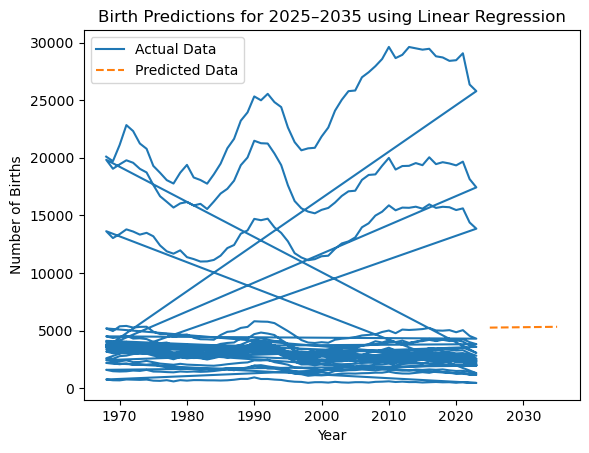

In [147]:
import matplotlib.pyplot as plt

# Διάγραμμα πραγματικών και προβλεπόμενων τιμών
plt.plot(filtered_birth_data['Year'], filtered_birth_data['Number'], label='Actual Data')
plt.plot(future_df['Year'], future_df['Predicted'], label='Predicted Data', linestyle='--')
plt.xlabel('Year')
plt.ylabel('Number of Births')
plt.title('Birth Predictions for 2025–2035 using Linear Regression')
plt.legend()
plt.show()


In [148]:
#ARIMA
!pip install statsmodels


In [150]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error


In [151]:
# Φορτώνουμε τα δεδομένα
birth_data = pd.read_csv('C:/Users/theop/Downloads/scb_region_birth_data.csv')

# Χρησιμοποιούμε μόνο την περιοχή 1 για το μοντέλο ARIMA (μπορούμε να επεκτείνουμε για άλλες περιοχές αν χρειαστεί)
region_data = birth_data[birth_data['Region'] == 1].copy()

# Χωρίζουμε τα δεδομένα σε training και test (έτη 1968-2023 για training)
train_data = region_data[region_data['Year'] <= 2023]['Number']
test_years = np.arange(2025, 2036)

# Εκπαίδευση του μοντέλου ARIMA
model_arima = ARIMA(train_data, order=(5, 1, 0))  # Το (5, 1, 0) είναι ένα απλό παράδειγμα, θα δοκιμάσουμε αν δουλεύει
model_fit_arima = model_arima.fit()

# Προβλέψεις για το διάστημα 2025-2035
predictions_arima = model_fit_arima.forecast(steps=len(test_years))

# Εμφάνιση προβλέψεων
pred_df = pd.DataFrame({
    'Year': test_years,
    'Predicted_Births': predictions_arima
})

print(pred_df)


    Year  Predicted_Births
56  2025      25265.812724
57  2026      24409.680067
58  2027      24204.732949
59  2028      24517.903128
60  2029      24442.498355
61  2030      24660.297372
62  2031      24929.097015
63  2032      24995.109351
64  2033      25052.535843
65  2034      25133.420188
66  2035      25094.501290


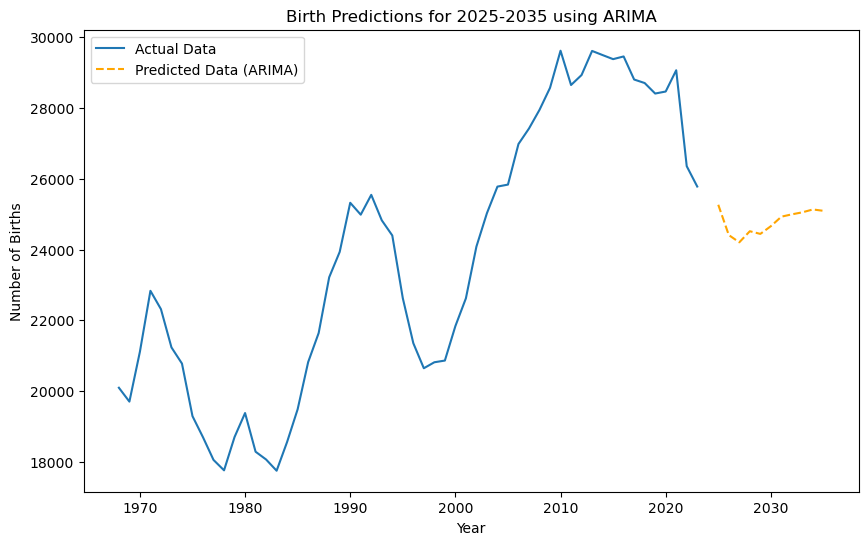

In [152]:
# Οπτικοποίηση των προβλέψεων του ARIMA
plt.figure(figsize=(10, 6))
plt.plot(region_data['Year'], region_data['Number'], label='Actual Data')
plt.plot(test_years, predictions_arima, label='Predicted Data (ARIMA)', linestyle='--', color='orange')
plt.title('Birth Predictions for 2025-2035 using ARIMA')
plt.xlabel('Year')
plt.ylabel('Number of Births')
plt.legend()
plt.show()


In [153]:
# Υπολογισμός του mean squared error (MSE) για το ARIMA μοντέλο
mse_arima = mean_squared_error(train_data[-4:], predictions_arima[:4])
print(f'MSE του ARIMA μοντέλου για τα έτη 2020-2023: {mse_arima}')


MSE του ARIMA μοντέλου για τα έτη 2020-2023: 9538797.798145749


In [154]:
import itertools
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

# Πιθανές τιμές για p, d, q
p = range(0, 3)
d = range(0, 2)
q = range(0, 3)

# Συνδυασμοί των p, d, q
pdq_combinations = list(itertools.product(p, d, q))

best_mse = float("inf")
best_params = None

# Προσπάθεια όλων των συνδυασμών των παραμέτρων
for params in pdq_combinations:
    try:
        # Δημιουργία του ARIMA μοντέλου
        arima_model = ARIMA(train_X, order=params)
        arima_model_fit = arima_model.fit()

        # Προβλέψεις για το διάστημα 2020-2023
        predictions = arima_model_fit.predict(start=len(train_X), end=len(train_X)+len(test_X)-1)

        # Υπολογισμός του MSE
        mse = mean_squared_error(test_y, predictions)
        print(f"ARIMA{params} MSE: {mse}")

        # Αν το MSE είναι μικρότερο από το καλύτερο που έχουμε δει, αποθηκεύουμε τις παραμέτρους
        if mse < best_mse:
            best_mse = mse
            best_params = params

    except Exception as e:
        print(f"ARIMA{params} απέτυχε: {e}")

print(f"Το καλύτερο μοντέλο ARIMA είναι με τις παραμέτρους {best_params} με MSE: {best_mse}")


ARIMA(0, 0, 0) απέτυχε: name 'train_X' is not defined
ARIMA(0, 0, 1) απέτυχε: name 'train_X' is not defined
ARIMA(0, 0, 2) απέτυχε: name 'train_X' is not defined
ARIMA(0, 1, 0) απέτυχε: name 'train_X' is not defined
ARIMA(0, 1, 1) απέτυχε: name 'train_X' is not defined
ARIMA(0, 1, 2) απέτυχε: name 'train_X' is not defined
ARIMA(1, 0, 0) απέτυχε: name 'train_X' is not defined
ARIMA(1, 0, 1) απέτυχε: name 'train_X' is not defined
ARIMA(1, 0, 2) απέτυχε: name 'train_X' is not defined
ARIMA(1, 1, 0) απέτυχε: name 'train_X' is not defined
ARIMA(1, 1, 1) απέτυχε: name 'train_X' is not defined
ARIMA(1, 1, 2) απέτυχε: name 'train_X' is not defined
ARIMA(2, 0, 0) απέτυχε: name 'train_X' is not defined
ARIMA(2, 0, 1) απέτυχε: name 'train_X' is not defined
ARIMA(2, 0, 2) απέτυχε: name 'train_X' is not defined
ARIMA(2, 1, 0) απέτυχε: name 'train_X' is not defined
ARIMA(2, 1, 1) απέτυχε: name 'train_X' is not defined
ARIMA(2, 1, 2) απέτυχε: name 'train_X' is not defined
Το καλύτερο μοντέλο ARIMA εί

In [155]:
import itertools
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

# Δεδομένα εκπαίδευσης και δοκιμής (όπως τα είχαμε ορίσει νωρίτερα)
train = birth_data[birth_data['Year'] <= 2019]
test = birth_data[birth_data['Year'] > 2019]

train_X = train[['Year']]
train_y = train['Number']
test_X = test[['Year']]
test_y = test['Number']

# Πιθανές τιμές για p, d, q
p = range(0, 3)
d = range(0, 2)
q = range(0, 3)

# Συνδυασμοί των p, d, q
pdq_combinations = list(itertools.product(p, d, q))

best_mse = float("inf")
best_params = None

# Προσπάθεια όλων των συνδυασμών των παραμέτρων
for params in pdq_combinations:
    try:
        # Δημιουργία του ARIMA μοντέλου
        arima_model = ARIMA(train_y, order=params)
        arima_model_fit = arima_model.fit()

        # Προβλέψεις για το διάστημα 2020-2023
        predictions = arima_model_fit.predict(start=len(train_y), end=len(train_y) + len(test_y) - 1)

        # Υπολογισμός του MSE
        mse = mean_squared_error(test_y, predictions)
        print(f"ARIMA{params} MSE: {mse}")

        # Αν το MSE είναι μικρότερο από το καλύτερο που έχουμε δει, αποθηκεύουμε τις παραμέτρους
        if mse < best_mse:
            best_mse = mse
            best_params = params

    except Exception as e:
        print(f"ARIMA{params} απέτυχε: {e}")

print(f"Το καλύτερο μοντέλο ARIMA είναι με τις παραμέτρους {best_params} με MSE: {best_mse}")


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

ARIMA(0, 0, 0) MSE: 43245825.68661445


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: Val

ARIMA(0, 0, 1) MSE: 43961119.15910334


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: Val

ARIMA(0, 0, 2) MSE: 44487684.02228779
ARIMA(0, 1, 0) MSE: 50455112.678571425
ARIMA(0, 1, 1) MSE: 50447866.07430039
ARIMA(0, 1, 2) MSE: 50442214.031678736


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: Val

ARIMA(1, 0, 0) MSE: 48311028.805682935


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: Val

ARIMA(1, 0, 1) MSE: 48269973.11327132


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: Val

ARIMA(1, 0, 2) MSE: 48236990.0885854
ARIMA(1, 1, 0) MSE: 50447344.19827626


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: Val

ARIMA(1, 1, 1) MSE: 50443074.6690464


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: Val

ARIMA(1, 1, 2) MSE: 50448471.526319504
ARIMA(2, 0, 0) MSE: 48265087.85095178


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: Val

ARIMA(2, 0, 1) MSE: 48303849.53539487


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: Val

ARIMA(2, 0, 2) MSE: 48193874.92344276
ARIMA(2, 1, 0) MSE: 50441304.50594708


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: Val

ARIMA(2, 1, 1) MSE: 50447504.874285206
ARIMA(2, 1, 2) MSE: 50459616.43462936
Το καλύτερο μοντέλο ARIMA είναι με τις παραμέτρους (0, 0, 0) με MSE: 43245825.68661445


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [156]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Εκπαίδευση και δοκιμή (όπως νωρίτερα)
train = birth_data[birth_data['Year'] <= 2019]
test = birth_data[birth_data['Year'] > 2019]

train_y = train['Number']
test_y = test['Number']

# Εφαρμογή του SARIMA μοντέλου
sarima_model = SARIMAX(train_y, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_model_fit = sarima_model.fit(disp=False)

# Προβλέψεις για τα έτη 2020-2023
predictions = sarima_model_fit.predict(start=len(train_y), end=len(train_y) + len(test_y) - 1)

# Υπολογισμός MSE
mse_sarima = mean_squared_error(test_y, predictions)
print(f"SARIMA MSE: {mse_sarima}")

# Προβλέψεις για το 2025-2035
future_predictions = sarima_model_fit.predict(start=len(train_y), end=len(train_y) + 15)
print(f"Προβλέψεις για τα έτη 2025-2035:\n{future_predictions}")


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


SARIMA MSE: 50989759.28954867
Προβλέψεις για τα έτη 2025-2035:
1092    2536.734099
1093    2480.377842
1094    2518.151321
1095    2498.912686
1096    2168.743134
1097    2149.321911
1098    2218.397355
1099    2182.815402
1100    2419.391589
1101    2366.065478
1102    2423.959987
1103    2399.632274
1104    2480.330181
1105    2423.526527
1106    2460.933691
1107    2441.533306
Name: predicted_mean, dtype: float64


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_predicti

In [157]:
import itertools
import statsmodels.api as sm
import pandas as pd
import numpy as np

# Ορισμός των πιθανών παραμέτρων (p, d, q) και εποχικών παραμέτρων (P, D, Q, s)
p = d = q = range(0, 3)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in pdq]  # Εποχικότητα για κάθε 12 μήνες (ετήσια)

# Δεδομένα για εκπαίδευση του SARIMA
train_data = birth_data.loc[birth_data['Year'] <= 2023]['Number']

best_aic = np.inf
best_params = None

for param in pdq:
    for seasonal_param in seasonal_pdq:
        try:
            # Δημιουργία SARIMA μοντέλου
            mod = sm.tsa.statespace.SARIMAX(train_data,
                                            order=param,
                                            seasonal_order=seasonal_param,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            
            # Έλεγχος για το καλύτερο AIC (Akaike Information Criterion)
            if results.aic < best_aic:
                best_aic = results.aic
                best_params = (param, seasonal_param)
            print(f"SARIMA{param}x{seasonal_param} AIC:{results.aic}")
        except:
            continue

print(f"Καλύτερο μοντέλο SARIMA: {best_params} με AIC: {best_aic}")


SARIMA(0, 0, 0)x(0, 0, 0, 12) AIC:24368.109632164604
SARIMA(0, 0, 0)x(0, 0, 1, 12) AIC:23347.816302368512
SARIMA(0, 0, 0)x(0, 0, 2, 12) AIC:22730.713770822913
SARIMA(0, 0, 0)x(0, 1, 0, 12) AIC:22610.655397060615
SARIMA(0, 0, 0)x(0, 1, 1, 12) AIC:22359.47475507701
SARIMA(0, 0, 0)x(0, 1, 2, 12) AIC:22126.95113062157
SARIMA(0, 0, 0)x(0, 2, 0, 12) AIC:23306.70722555032
SARIMA(0, 0, 0)x(0, 2, 1, 12) AIC:22404.18832511307
SARIMA(0, 0, 0)x(0, 2, 2, 12) AIC:22029.66703250953
SARIMA(0, 0, 0)x(1, 0, 0, 12) AIC:22500.932793036605
SARIMA(0, 0, 0)x(1, 0, 1, 12) AIC:22484.87075166376
SARIMA(0, 0, 0)x(1, 0, 2, 12) AIC:22218.595005463892
SARIMA(0, 0, 0)x(1, 1, 0, 12) AIC:22380.877214213142
SARIMA(0, 0, 0)x(1, 1, 1, 12) AIC:22271.162380009955
SARIMA(0, 0, 0)x(1, 1, 2, 12) AIC:22040.5120201924
SARIMA(0, 0, 0)x(1, 2, 0, 12) AIC:22693.00399446286
SARIMA(0, 0, 0)x(1, 2, 1, 12) AIC:22300.483586436494
SARIMA(0, 0, 0)x(1, 2, 2, 12) AIC:21934.02808549792
SARIMA(0, 0, 0)x(2, 0, 0, 12) AIC:22251.23492839541
SARI

C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 1)x(1, 2, 2, 12) AIC:20880.329199708547
SARIMA(0, 0, 1)x(2, 0, 0, 12) AIC:21190.0952151912
SARIMA(0, 0, 1)x(2, 0, 1, 12) AIC:21189.88092045765


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 1)x(2, 0, 2, 12) AIC:21141.882018980134
SARIMA(0, 0, 1)x(2, 1, 0, 12) AIC:21105.88070383802
SARIMA(0, 0, 1)x(2, 1, 1, 12) AIC:20995.068020577273


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 1)x(2, 1, 2, 12) AIC:21022.880626725382
SARIMA(0, 0, 1)x(2, 2, 0, 12) AIC:21315.92713062003
SARIMA(0, 0, 1)x(2, 2, 1, 12) AIC:21785.27661881297
SARIMA(0, 0, 1)x(2, 2, 2, 12) AIC:21740.390661467864
SARIMA(0, 0, 2)x(0, 0, 0, 12) AIC:21987.667429656958
SARIMA(0, 0, 2)x(0, 0, 1, 12) AIC:21260.004062514832
SARIMA(0, 0, 2)x(0, 0, 2, 12) AIC:20798.035825533545
SARIMA(0, 0, 2)x(0, 1, 0, 12) AIC:21019.266418839175
SARIMA(0, 0, 2)x(0, 1, 1, 12) AIC:20681.47887085831


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(0, 1, 2, 12) AIC:20414.94758278701
SARIMA(0, 0, 2)x(0, 2, 0, 12) AIC:22150.510990358707
SARIMA(0, 0, 2)x(0, 2, 1, 12) AIC:20688.985243300966


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(0, 2, 2, 12) AIC:20370.12830118079
SARIMA(0, 0, 2)x(1, 0, 0, 12) AIC:20904.22115970706


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(1, 0, 1, 12) AIC:20812.798084010832
SARIMA(0, 0, 2)x(1, 0, 2, 12) AIC:20549.6005413551
SARIMA(0, 0, 2)x(1, 1, 0, 12) AIC:20756.25047996285
SARIMA(0, 0, 2)x(1, 1, 1, 12) AIC:20590.13096660834


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(1, 1, 2, 12) AIC:20452.5665496985
SARIMA(0, 0, 2)x(1, 2, 0, 12) AIC:21200.17139516856
SARIMA(0, 0, 2)x(1, 2, 1, 12) AIC:20630.173748406516


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(1, 2, 2, 12) AIC:20670.725879835307
SARIMA(0, 0, 2)x(2, 0, 0, 12) AIC:20614.103576775873


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(2, 0, 1, 12) AIC:20616.152656209983


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(2, 0, 2, 12) AIC:20555.373024843062
SARIMA(0, 0, 2)x(2, 1, 0, 12) AIC:20535.37764164513


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(2, 1, 1, 12) AIC:20523.58119774047


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(2, 1, 2, 12) AIC:20681.585518997454
SARIMA(0, 0, 2)x(2, 2, 0, 12) AIC:20781.554798586934
SARIMA(0, 0, 2)x(2, 2, 1, 12) AIC:20458.255750429915


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(2, 2, 2, 12) AIC:21014.161014055717
SARIMA(0, 1, 0)x(0, 0, 0, 12) AIC:19741.422985449863
SARIMA(0, 1, 0)x(0, 0, 1, 12) AIC:19542.56194236007
SARIMA(0, 1, 0)x(0, 0, 2, 12) AIC:19345.966217972895
SARIMA(0, 1, 0)x(0, 1, 0, 12) AIC:20382.177596577654
SARIMA(0, 1, 0)x(0, 1, 1, 12) AIC:19447.52393504826
SARIMA(0, 1, 0)x(0, 1, 2, 12) AIC:19193.395813339263
SARIMA(0, 1, 0)x(0, 2, 0, 12) AIC:21443.589754562086
SARIMA(0, 1, 0)x(0, 2, 1, 12) AIC:20008.30833628298
SARIMA(0, 1, 0)x(0, 2, 2, 12) AIC:19326.23664752012
SARIMA(0, 1, 0)x(1, 0, 0, 12) AIC:19559.304923451906
SARIMA(0, 1, 0)x(1, 0, 1, 12) AIC:19531.019046711852
SARIMA(0, 1, 0)x(1, 0, 2, 12) AIC:19329.247896094654
SARIMA(0, 1, 0)x(1, 1, 0, 12) AIC:19851.61576261359
SARIMA(0, 1, 0)x(1, 1, 1, 12) AIC:19414.30300015898
SARIMA(0, 1, 0)x(1, 1, 2, 12) AIC:19201.80916015607
SARIMA(0, 1, 0)x(1, 2, 0, 12) AIC:20559.000959079836
SARIMA(0, 1, 0)x(1, 2, 1, 12) AIC:19696.32335990969
SARIMA(0, 1, 0)x(1, 2, 2, 12) AIC:19201.92883473453
SA

C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 0)x(2, 0, 2, 12) AIC:19337.24253312817
SARIMA(0, 1, 0)x(2, 1, 0, 12) AIC:19527.135200738223
SARIMA(0, 1, 0)x(2, 1, 1, 12) AIC:19230.84556814452
SARIMA(0, 1, 0)x(2, 1, 2, 12) AIC:19201.511183446808
SARIMA(0, 1, 0)x(2, 2, 0, 12) AIC:20055.58993350651
SARIMA(0, 1, 0)x(2, 2, 1, 12) AIC:19413.769448540326
SARIMA(0, 1, 0)x(2, 2, 2, 12) AIC:19173.104869361396
SARIMA(0, 1, 1)x(0, 0, 0, 12) AIC:19724.85866372239
SARIMA(0, 1, 1)x(0, 0, 1, 12) AIC:19527.834166884757
SARIMA(0, 1, 1)x(0, 0, 2, 12) AIC:19331.40627532315
SARIMA(0, 1, 1)x(0, 1, 0, 12) AIC:20365.312939178075
SARIMA(0, 1, 1)x(0, 1, 1, 12) AIC:19397.458623691233
SARIMA(0, 1, 1)x(0, 1, 2, 12) AIC:19177.47413062467
SARIMA(0, 1, 1)x(0, 2, 0, 12) AIC:21426.777186856318
SARIMA(0, 1, 1)x(0, 2, 1, 12) AIC:19991.645819045807
SARIMA(0, 1, 1)x(0, 2, 2, 12) AIC:19126.3534779533
SARIMA(0, 1, 1)x(1, 0, 0, 12) AIC:19560.49805800504
SARIMA(0, 1, 1)x(1, 0, 1, 12) AIC:19529.210692566223
SARIMA(0, 1, 1)x(1, 0, 2, 12) AIC:19333.1171407961
SARI

C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(1, 2, 2, 12) AIC:19128.716088731697
SARIMA(0, 1, 1)x(2, 0, 0, 12) AIC:19363.77071845343
SARIMA(0, 1, 1)x(2, 0, 1, 12) AIC:19365.206278061632
SARIMA(0, 1, 1)x(2, 0, 2, 12) AIC:19309.562718245186
SARIMA(0, 1, 1)x(2, 1, 0, 12) AIC:19527.973777325213
SARIMA(0, 1, 1)x(2, 1, 1, 12) AIC:19232.259512381686


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(2, 1, 2, 12) AIC:19181.119814011145
SARIMA(0, 1, 1)x(2, 2, 0, 12) AIC:20055.841463164616
SARIMA(0, 1, 1)x(2, 2, 1, 12) AIC:19382.925993650577
SARIMA(0, 1, 1)x(2, 2, 2, 12) AIC:20114.991161272024
SARIMA(0, 1, 2)x(0, 0, 0, 12) AIC:19698.131880467437
SARIMA(0, 1, 2)x(0, 0, 1, 12) AIC:19503.5290075379
SARIMA(0, 1, 2)x(0, 0, 2, 12) AIC:19305.807543568648
SARIMA(0, 1, 2)x(0, 1, 0, 12) AIC:20334.406788677024
SARIMA(0, 1, 2)x(0, 1, 1, 12) AIC:19370.501810404097
SARIMA(0, 1, 2)x(0, 1, 2, 12) AIC:19154.043997053763
SARIMA(0, 1, 2)x(0, 2, 0, 12) AIC:21395.514862219523
SARIMA(0, 1, 2)x(0, 2, 1, 12) AIC:19961.652190815686


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(0, 2, 2, 12) AIC:19103.11239856766
SARIMA(0, 1, 2)x(1, 0, 0, 12) AIC:19552.158305126755
SARIMA(0, 1, 2)x(1, 0, 1, 12) AIC:19505.07141026438
SARIMA(0, 1, 2)x(1, 0, 2, 12) AIC:19307.647722248606
SARIMA(0, 1, 2)x(1, 1, 0, 12) AIC:19842.0951782278
SARIMA(0, 1, 2)x(1, 1, 1, 12) AIC:19373.754440874938


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(1, 1, 2, 12) AIC:19152.66438019922
SARIMA(0, 1, 2)x(1, 2, 0, 12) AIC:20549.81274620891
SARIMA(0, 1, 2)x(1, 2, 1, 12) AIC:19639.255736022715


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(1, 2, 2, 12) AIC:19105.07216751807
SARIMA(0, 1, 2)x(2, 0, 0, 12) AIC:19356.354755269414
SARIMA(0, 1, 2)x(2, 0, 1, 12) AIC:19357.893293620662
SARIMA(0, 1, 2)x(2, 0, 2, 12) AIC:19282.4879057453
SARIMA(0, 1, 2)x(2, 1, 0, 12) AIC:19518.048848607174
SARIMA(0, 1, 2)x(2, 1, 1, 12) AIC:19225.682212410848


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(2, 1, 2, 12) AIC:19154.145956497538
SARIMA(0, 1, 2)x(2, 2, 0, 12) AIC:20044.92054314114
SARIMA(0, 1, 2)x(2, 2, 1, 12) AIC:19373.501688682303


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(2, 2, 2, 12) AIC:19629.157252395216
SARIMA(0, 2, 0)x(0, 0, 0, 12) AIC:20498.862445278457
SARIMA(0, 2, 0)x(0, 0, 1, 12) AIC:20296.897063051863
SARIMA(0, 2, 0)x(0, 0, 2, 12) AIC:20096.99773256439
SARIMA(0, 2, 0)x(0, 1, 0, 12) AIC:21128.677177919428
SARIMA(0, 2, 0)x(0, 1, 1, 12) AIC:20269.91896173078
SARIMA(0, 2, 0)x(0, 1, 2, 12) AIC:19947.72736408187
SARIMA(0, 2, 0)x(0, 2, 0, 12) AIC:22192.51867020992
SARIMA(0, 2, 0)x(0, 2, 1, 12) AIC:20907.46469950831
SARIMA(0, 2, 0)x(0, 2, 2, 12) AIC:20268.18413066227
SARIMA(0, 2, 0)x(1, 0, 0, 12) AIC:20313.57214589287
SARIMA(0, 2, 0)x(1, 0, 1, 12) AIC:20298.24238772248
SARIMA(0, 2, 0)x(1, 0, 2, 12) AIC:20080.30084282302
SARIMA(0, 2, 0)x(1, 1, 0, 12) AIC:20584.501692048376
SARIMA(0, 2, 0)x(1, 1, 1, 12) AIC:20158.824894305835
SARIMA(0, 2, 0)x(1, 1, 2, 12) AIC:19941.114531545725
SARIMA(0, 2, 0)x(1, 2, 0, 12) AIC:21288.701118008437
SARIMA(0, 2, 0)x(1, 2, 1, 12) AIC:20406.790966636196
SARIMA(0, 2, 0)x(1, 2, 2, 12) AIC:19974.419053046142
SA

C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 1)x(0, 2, 2, 12) AIC:19133.665058059596
SARIMA(0, 2, 1)x(1, 0, 0, 12) AIC:19572.27412144781
SARIMA(0, 2, 1)x(1, 0, 1, 12) AIC:19541.702842909155
SARIMA(0, 2, 1)x(1, 0, 2, 12) AIC:19343.519374489668
SARIMA(0, 2, 1)x(1, 1, 0, 12) AIC:19961.367407997437
SARIMA(0, 2, 1)x(1, 1, 1, 12) AIC:19400.765142684853
SARIMA(0, 2, 1)x(1, 1, 2, 12) AIC:19513.19830019032
SARIMA(0, 2, 1)x(1, 2, 0, 12) AIC:20824.54604600674
SARIMA(0, 2, 1)x(1, 2, 1, 12) AIC:19683.066157791287


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 1)x(1, 2, 2, 12) AIC:19346.55626942953
SARIMA(0, 2, 1)x(2, 0, 0, 12) AIC:19374.878717125343
SARIMA(0, 2, 1)x(2, 0, 1, 12) AIC:19376.909649093235
SARIMA(0, 2, 1)x(2, 0, 2, 12) AIC:19327.188126930927
SARIMA(0, 2, 1)x(2, 1, 0, 12) AIC:19525.10166696078
SARIMA(0, 2, 1)x(2, 1, 1, 12) AIC:19227.278852966105


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 1)x(2, 1, 2, 12) AIC:19180.404231884757
SARIMA(0, 2, 1)x(2, 2, 0, 12) AIC:20054.345847411132
SARIMA(0, 2, 1)x(2, 2, 1, 12) AIC:19386.19829666551


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 1)x(2, 2, 2, 12) AIC:19189.312913307604
SARIMA(0, 2, 2)x(0, 0, 0, 12) AIC:19720.9368988683
SARIMA(0, 2, 2)x(0, 0, 1, 12) AIC:19515.060951016356
SARIMA(0, 2, 2)x(0, 0, 2, 12) AIC:19317.511302699997
SARIMA(0, 2, 2)x(0, 1, 0, 12) AIC:20363.38654460689
SARIMA(0, 2, 2)x(0, 1, 1, 12) AIC:19372.605445118897
SARIMA(0, 2, 2)x(0, 1, 2, 12) AIC:19161.711867950486
SARIMA(0, 2, 2)x(0, 2, 0, 12) AIC:21412.156544737285
SARIMA(0, 2, 2)x(0, 2, 1, 12) AIC:19978.559496454873


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 2)x(0, 2, 2, 12) AIC:19109.813783793288
SARIMA(0, 2, 2)x(1, 0, 0, 12) AIC:19563.450247166533
SARIMA(0, 2, 2)x(1, 0, 1, 12) AIC:19516.641819369368
SARIMA(0, 2, 2)x(1, 0, 2, 12) AIC:19319.580871996142
SARIMA(0, 2, 2)x(1, 1, 0, 12) AIC:19940.75279005571
SARIMA(0, 2, 2)x(1, 1, 1, 12) AIC:19376.11290009386


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 2)x(1, 1, 2, 12) AIC:19163.32854279958
SARIMA(0, 2, 2)x(1, 2, 0, 12) AIC:20795.222755112758
SARIMA(0, 2, 2)x(1, 2, 1, 12) AIC:19666.024149647725


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 2)x(1, 2, 2, 12) AIC:19644.837096375886
SARIMA(0, 2, 2)x(2, 0, 0, 12) AIC:19366.514130410196
SARIMA(0, 2, 2)x(2, 0, 1, 12) AIC:19368.398596625604
SARIMA(0, 2, 2)x(2, 0, 2, 12) AIC:19288.596922207096
SARIMA(0, 2, 2)x(2, 1, 0, 12) AIC:19661.38462582845
SARIMA(0, 2, 2)x(2, 1, 1, 12) AIC:19226.85073474751


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 2)x(2, 1, 2, 12) AIC:19467.180119723445
SARIMA(0, 2, 2)x(2, 2, 0, 12) AIC:20054.095661856874
SARIMA(0, 2, 2)x(2, 2, 1, 12) AIC:19386.65860212539


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 2)x(2, 2, 2, 12) AIC:19625.243420602794
SARIMA(1, 0, 0)x(0, 0, 0, 12) AIC:19749.722299351553
SARIMA(1, 0, 0)x(0, 0, 1, 12) AIC:19551.666646948404
SARIMA(1, 0, 0)x(0, 0, 2, 12) AIC:19350.155963340003
SARIMA(1, 0, 0)x(0, 1, 0, 12) AIC:20356.585527547664
SARIMA(1, 0, 0)x(0, 1, 1, 12) AIC:19482.404845123543
SARIMA(1, 0, 0)x(0, 1, 2, 12) AIC:19214.18835277381
SARIMA(1, 0, 0)x(0, 2, 0, 12) AIC:21403.077296723386
SARIMA(1, 0, 0)x(0, 2, 1, 12) AIC:19990.15328327637
SARIMA(1, 0, 0)x(0, 2, 2, 12) AIC:19291.5213694118
SARIMA(1, 0, 0)x(1, 0, 0, 12) AIC:19551.632395169745
SARIMA(1, 0, 0)x(1, 0, 1, 12) AIC:19552.918205091068
SARIMA(1, 0, 0)x(1, 0, 2, 12) AIC:19350.383899606404
SARIMA(1, 0, 0)x(1, 1, 0, 12) AIC:19824.054188831928
SARIMA(1, 0, 0)x(1, 1, 1, 12) AIC:19475.38468089048
SARIMA(1, 0, 0)x(1, 1, 2, 12) AIC:19195.31957890147
SARIMA(1, 0, 0)x(1, 2, 0, 12) AIC:20516.744159543578
SARIMA(1, 0, 0)x(1, 2, 1, 12) AIC:19688.21458067224


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 0)x(1, 2, 2, 12) AIC:19292.035094359435
SARIMA(1, 0, 0)x(2, 0, 0, 12) AIC:19350.393821087335
SARIMA(1, 0, 0)x(2, 0, 1, 12) AIC:19350.395245610045
SARIMA(1, 0, 0)x(2, 0, 2, 12) AIC:19352.37729039939
SARIMA(1, 0, 0)x(2, 1, 0, 12) AIC:19507.041225169814
SARIMA(1, 0, 0)x(2, 1, 1, 12) AIC:19217.24731192382


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 0)x(2, 1, 2, 12) AIC:19196.91577200034
SARIMA(1, 0, 0)x(2, 2, 0, 12) AIC:20021.686599727815
SARIMA(1, 0, 0)x(2, 2, 1, 12) AIC:19381.768734492965


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 0)x(2, 2, 2, 12) AIC:19433.108074267493
SARIMA(1, 0, 1)x(0, 0, 0, 12) AIC:19734.564022408904
SARIMA(1, 0, 1)x(0, 0, 1, 12) AIC:19536.107189566363
SARIMA(1, 0, 1)x(0, 0, 2, 12) AIC:19335.445010926007
SARIMA(1, 0, 1)x(0, 1, 0, 12) AIC:20336.987531721716
SARIMA(1, 0, 1)x(0, 1, 1, 12) AIC:19451.42893085376
SARIMA(1, 0, 1)x(0, 1, 2, 12) AIC:19196.10611619248
SARIMA(1, 0, 1)x(0, 2, 0, 12) AIC:21381.782930200832
SARIMA(1, 0, 1)x(0, 2, 1, 12) AIC:19972.561982514555
SARIMA(1, 0, 1)x(0, 2, 2, 12) AIC:19254.01104479069
SARIMA(1, 0, 1)x(1, 0, 0, 12) AIC:19552.5171899956
SARIMA(1, 0, 1)x(1, 0, 1, 12) AIC:19537.348033797578
SARIMA(1, 0, 1)x(1, 0, 2, 12) AIC:19335.72374361111
SARIMA(1, 0, 1)x(1, 1, 0, 12) AIC:19822.262742681738
SARIMA(1, 0, 1)x(1, 1, 1, 12) AIC:19452.6106028215


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 1)x(1, 1, 2, 12) AIC:19237.68052116233
SARIMA(1, 0, 1)x(1, 2, 0, 12) AIC:20513.417716959324
SARIMA(1, 0, 1)x(1, 2, 1, 12) AIC:19670.823844646242


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 1)x(1, 2, 2, 12) AIC:19262.92697546693
SARIMA(1, 0, 1)x(2, 0, 0, 12) AIC:19351.55564164299
SARIMA(1, 0, 1)x(2, 0, 1, 12) AIC:19347.345409021495
SARIMA(1, 0, 1)x(2, 0, 2, 12) AIC:19313.550429749568
SARIMA(1, 0, 1)x(2, 1, 0, 12) AIC:19506.439930861856
SARIMA(1, 0, 1)x(2, 1, 1, 12) AIC:19218.053619822247


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 1)x(2, 1, 2, 12) AIC:19182.207943100908
SARIMA(1, 0, 1)x(2, 2, 0, 12) AIC:20018.669527191567
SARIMA(1, 0, 1)x(2, 2, 1, 12) AIC:19381.88740811067


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 1)x(2, 2, 2, 12) AIC:19535.554955079035
SARIMA(1, 0, 2)x(0, 0, 0, 12) AIC:19706.919078506766
SARIMA(1, 0, 2)x(0, 0, 1, 12) AIC:19510.735084813685
SARIMA(1, 0, 2)x(0, 0, 2, 12) AIC:19311.332887079217
SARIMA(1, 0, 2)x(0, 1, 0, 12) AIC:20296.701619902982
SARIMA(1, 0, 2)x(0, 1, 1, 12) AIC:19425.502156910097
SARIMA(1, 0, 2)x(0, 1, 2, 12) AIC:19169.805823729046
SARIMA(1, 0, 2)x(0, 2, 0, 12) AIC:21336.42705926263
SARIMA(1, 0, 2)x(0, 2, 1, 12) AIC:19937.786698386368


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 2)x(0, 2, 2, 12) AIC:19222.668540977662
SARIMA(1, 0, 2)x(1, 0, 0, 12) AIC:19542.966895137353
SARIMA(1, 0, 2)x(1, 0, 1, 12) AIC:19512.25604260656
SARIMA(1, 0, 2)x(1, 0, 2, 12) AIC:19303.498405622668
SARIMA(1, 0, 2)x(1, 1, 0, 12) AIC:19806.705553870517
SARIMA(1, 0, 2)x(1, 1, 1, 12) AIC:19426.465581625263


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 2)x(1, 1, 2, 12) AIC:19156.41775764412
SARIMA(1, 0, 2)x(1, 2, 0, 12) AIC:20493.88035856188
SARIMA(1, 0, 2)x(1, 2, 1, 12) AIC:19643.363275330128


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 2)x(1, 2, 2, 12) AIC:19229.45251468275
SARIMA(1, 0, 2)x(2, 0, 0, 12) AIC:19343.1123094488
SARIMA(1, 0, 2)x(2, 0, 1, 12) AIC:19335.385257544207
SARIMA(1, 0, 2)x(2, 0, 2, 12) AIC:19286.072735732814
SARIMA(1, 0, 2)x(2, 1, 0, 12) AIC:19492.257879270164
SARIMA(1, 0, 2)x(2, 1, 1, 12) AIC:19208.438950141088


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 2)x(2, 1, 2, 12) AIC:19178.070936570643
SARIMA(1, 0, 2)x(2, 2, 0, 12) AIC:19999.830718523503
SARIMA(1, 0, 2)x(2, 2, 1, 12) AIC:19371.29151663518


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 2)x(2, 2, 2, 12) AIC:19227.64141777381
SARIMA(1, 1, 0)x(0, 0, 0, 12) AIC:19742.20050138706
SARIMA(1, 1, 0)x(0, 0, 1, 12) AIC:19543.527448941866
SARIMA(1, 1, 0)x(0, 0, 2, 12) AIC:19347.247790596084
SARIMA(1, 1, 0)x(0, 1, 0, 12) AIC:20382.653678983836
SARIMA(1, 1, 0)x(0, 1, 1, 12) AIC:19414.930522414958
SARIMA(1, 1, 0)x(0, 1, 2, 12) AIC:19194.623233497983
SARIMA(1, 1, 0)x(0, 2, 0, 12) AIC:21444.542296167536
SARIMA(1, 1, 0)x(0, 2, 1, 12) AIC:20494.836153736756
SARIMA(1, 1, 0)x(0, 2, 2, 12) AIC:19142.19078674225
SARIMA(1, 1, 0)x(1, 0, 0, 12) AIC:19543.442151314033
SARIMA(1, 1, 0)x(1, 0, 1, 12) AIC:19544.608482112577
SARIMA(1, 1, 0)x(1, 0, 2, 12) AIC:19348.958354050752
SARIMA(1, 1, 0)x(1, 1, 0, 12) AIC:19835.463038409016
SARIMA(1, 1, 0)x(1, 1, 1, 12) AIC:19416.929305622507
SARIMA(1, 1, 0)x(1, 1, 2, 12) AIC:19419.708101572673
SARIMA(1, 1, 0)x(1, 2, 0, 12) AIC:20542.162840989236
SARIMA(1, 1, 0)x(1, 2, 1, 12) AIC:19684.393822676546


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(1, 2, 2, 12) AIC:19181.657613737545
SARIMA(1, 1, 0)x(2, 0, 0, 12) AIC:19347.341370735427
SARIMA(1, 1, 0)x(2, 0, 1, 12) AIC:19348.85700087952
SARIMA(1, 1, 0)x(2, 0, 2, 12) AIC:19325.7363024124
SARIMA(1, 1, 0)x(2, 1, 0, 12) AIC:19511.08369693814
SARIMA(1, 1, 0)x(2, 1, 1, 12) AIC:19197.176153317283


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(2, 1, 2, 12) AIC:19194.72335890189
SARIMA(1, 1, 0)x(2, 2, 0, 12) AIC:20038.49108027081
SARIMA(1, 1, 0)x(2, 2, 1, 12) AIC:19368.095120134327
SARIMA(1, 1, 0)x(2, 2, 2, 12) AIC:20131.68809754122
SARIMA(1, 1, 1)x(0, 0, 0, 12) AIC:19722.361471424134
SARIMA(1, 1, 1)x(0, 0, 1, 12) AIC:19526.147402902614
SARIMA(1, 1, 1)x(0, 0, 2, 12) AIC:19329.44479034827
SARIMA(1, 1, 1)x(0, 1, 0, 12) AIC:20360.140354539042
SARIMA(1, 1, 1)x(0, 1, 1, 12) AIC:19396.93169337555


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(0, 1, 2, 12) AIC:19179.283921191865
SARIMA(1, 1, 1)x(0, 2, 0, 12) AIC:21421.482255133582
SARIMA(1, 1, 1)x(0, 2, 1, 12) AIC:19966.054584114056


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(0, 2, 2, 12) AIC:19437.03564516901
SARIMA(1, 1, 1)x(1, 0, 0, 12) AIC:19541.688891713373
SARIMA(1, 1, 1)x(1, 0, 1, 12) AIC:19511.672183820927
SARIMA(1, 1, 1)x(1, 0, 2, 12) AIC:19331.277856569606
SARIMA(1, 1, 1)x(1, 1, 0, 12) AIC:19832.115744630635


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(1, 1, 1, 12) AIC:19398.881091080086


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(1, 1, 2, 12) AIC:19306.663721562196
SARIMA(1, 1, 1)x(1, 2, 0, 12) AIC:20504.083510631455


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(1, 2, 1, 12) AIC:19666.63077152582


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(1, 2, 2, 12) AIC:20108.47154453967
SARIMA(1, 1, 1)x(2, 0, 0, 12) AIC:19346.16468659372
SARIMA(1, 1, 1)x(2, 0, 1, 12) AIC:19347.681862624675
SARIMA(1, 1, 1)x(2, 0, 2, 12) AIC:19306.559270289465
SARIMA(1, 1, 1)x(2, 1, 0, 12) AIC:19508.478425869707
SARIMA(1, 1, 1)x(2, 1, 1, 12) AIC:19198.973905133684


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(2, 1, 2, 12) AIC:19333.49021312485
SARIMA(1, 1, 1)x(2, 2, 0, 12) AIC:20010.809954154873


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(2, 2, 1, 12) AIC:19371.533902097966


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(2, 2, 2, 12) AIC:20111.009236132446
SARIMA(1, 1, 2)x(0, 0, 0, 12) AIC:19700.079636987
SARIMA(1, 1, 2)x(0, 0, 1, 12) AIC:19505.48741712569
SARIMA(1, 1, 2)x(0, 0, 2, 12) AIC:19307.796957190472
SARIMA(1, 1, 2)x(0, 1, 0, 12) AIC:20335.259782067762
SARIMA(1, 1, 2)x(0, 1, 1, 12) AIC:19389.141207617882
SARIMA(1, 1, 2)x(0, 1, 2, 12) AIC:19156.0276643049
SARIMA(1, 1, 2)x(0, 2, 0, 12) AIC:21395.799335598


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(0, 2, 1, 12) AIC:19962.700633197477


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(0, 2, 2, 12) AIC:19689.938161081333
SARIMA(1, 1, 2)x(1, 0, 0, 12) AIC:19537.11844420757
SARIMA(1, 1, 2)x(1, 0, 1, 12) AIC:19506.946683380695
SARIMA(1, 1, 2)x(1, 0, 2, 12) AIC:19309.64072826995
SARIMA(1, 1, 2)x(1, 1, 0, 12) AIC:19827.110938017882


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(1, 1, 1, 12) AIC:19374.455637051455


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(1, 1, 2, 12) AIC:19158.633192254827
SARIMA(1, 1, 2)x(1, 2, 0, 12) AIC:20504.248307093545


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(1, 2, 1, 12) AIC:19640.834849769846


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(1, 2, 2, 12) AIC:20082.965982061916
SARIMA(1, 1, 2)x(2, 0, 0, 12) AIC:19342.041930889696
SARIMA(1, 1, 2)x(2, 0, 1, 12) AIC:19343.682106854103
SARIMA(1, 1, 2)x(2, 0, 2, 12) AIC:19284.143577482246
SARIMA(1, 1, 2)x(2, 1, 0, 12) AIC:19496.285895266818
SARIMA(1, 1, 2)x(2, 1, 1, 12) AIC:19191.61547928743


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(2, 1, 2, 12) AIC:19338.31598828965
SARIMA(1, 1, 2)x(2, 2, 0, 12) AIC:20029.434740085046


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(2, 2, 1, 12) AIC:19360.37104833928


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(2, 2, 2, 12) AIC:20077.996276230413
SARIMA(1, 2, 0)x(0, 0, 0, 12) AIC:20111.02730733005
SARIMA(1, 2, 0)x(0, 0, 1, 12) AIC:19909.543093154643
SARIMA(1, 2, 0)x(0, 0, 2, 12) AIC:19714.579199668042
SARIMA(1, 2, 0)x(0, 1, 0, 12) AIC:20727.38397014939
SARIMA(1, 2, 0)x(0, 1, 1, 12) AIC:19771.584260227984
SARIMA(1, 2, 0)x(0, 1, 2, 12) AIC:19556.822546242853
SARIMA(1, 2, 0)x(0, 2, 0, 12) AIC:21783.231254653507
SARIMA(1, 2, 0)x(0, 2, 1, 12) AIC:20352.51042029355
SARIMA(1, 2, 0)x(0, 2, 2, 12) AIC:20460.145135817504
SARIMA(1, 2, 0)x(1, 0, 0, 12) AIC:19909.525571949755
SARIMA(1, 2, 0)x(1, 0, 1, 12) AIC:19911.154358481137
SARIMA(1, 2, 0)x(1, 0, 2, 12) AIC:19716.556839489946
SARIMA(1, 2, 0)x(1, 1, 0, 12) AIC:20188.14112787439
SARIMA(1, 2, 0)x(1, 1, 1, 12) AIC:19773.910863277742


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 0)x(1, 1, 2, 12) AIC:19551.3437475668
SARIMA(1, 2, 0)x(1, 2, 0, 12) AIC:20893.040594310518
SARIMA(1, 2, 0)x(1, 2, 1, 12) AIC:20033.504060644198


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 0)x(1, 2, 2, 12) AIC:19472.76288100075
SARIMA(1, 2, 0)x(2, 0, 0, 12) AIC:19714.58337319897
SARIMA(1, 2, 0)x(2, 0, 1, 12) AIC:19716.54979920831
SARIMA(1, 2, 0)x(2, 0, 2, 12) AIC:19718.592655715776
SARIMA(1, 2, 0)x(2, 1, 0, 12) AIC:19858.438777945732
SARIMA(1, 2, 0)x(2, 1, 1, 12) AIC:19558.90754829876
SARIMA(1, 2, 0)x(2, 1, 2, 12) AIC:19559.35181409164
SARIMA(1, 2, 0)x(2, 2, 0, 12) AIC:20375.517840150394
SARIMA(1, 2, 0)x(2, 2, 1, 12) AIC:19709.6298212429


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 0)x(2, 2, 2, 12) AIC:19494.282811033376
SARIMA(1, 2, 1)x(0, 0, 0, 12) AIC:19769.05175883854
SARIMA(1, 2, 1)x(0, 0, 1, 12) AIC:19540.01633689616
SARIMA(1, 2, 1)x(0, 0, 2, 12) AIC:19341.45369165483
SARIMA(1, 2, 1)x(0, 1, 0, 12) AIC:20392.95176065515
SARIMA(1, 2, 1)x(0, 1, 1, 12) AIC:19399.886362820856
SARIMA(1, 2, 1)x(0, 1, 2, 12) AIC:19177.918077269795
SARIMA(1, 2, 1)x(0, 2, 0, 12) AIC:21440.458846830552
SARIMA(1, 2, 1)x(0, 2, 1, 12) AIC:20602.362467862917
SARIMA(1, 2, 1)x(0, 2, 2, 12) AIC:20258.740595956115
SARIMA(1, 2, 1)x(1, 0, 0, 12) AIC:19555.63629836891
SARIMA(1, 2, 1)x(1, 0, 1, 12) AIC:19541.187517188075
SARIMA(1, 2, 1)x(1, 0, 2, 12) AIC:19323.67205757948
SARIMA(1, 2, 1)x(1, 1, 0, 12) AIC:19833.158476067132
SARIMA(1, 2, 1)x(1, 1, 1, 12) AIC:19403.016583149703


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 1)x(1, 1, 2, 12) AIC:19241.127969063855
SARIMA(1, 2, 1)x(1, 2, 0, 12) AIC:20800.021176573406
SARIMA(1, 2, 1)x(1, 2, 1, 12) AIC:19682.491288851823


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 1)x(1, 2, 2, 12) AIC:19883.368224549165
SARIMA(1, 2, 1)x(2, 0, 0, 12) AIC:19358.391069204925


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 1)x(2, 0, 1, 12) AIC:19340.519071591225
SARIMA(1, 2, 1)x(2, 0, 2, 12) AIC:19326.881248782553
SARIMA(1, 2, 1)x(2, 1, 0, 12) AIC:19661.917747982974
SARIMA(1, 2, 1)x(2, 1, 1, 12) AIC:19208.18915377007


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 1)x(2, 1, 2, 12) AIC:19182.507353303758
SARIMA(1, 2, 1)x(2, 2, 0, 12) AIC:20462.230083018843
SARIMA(1, 2, 1)x(2, 2, 1, 12) AIC:19369.52530423695


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 1)x(2, 2, 2, 12) AIC:19507.65007660853
SARIMA(1, 2, 2)x(0, 0, 0, 12) AIC:19707.019540239693
SARIMA(1, 2, 2)x(0, 0, 1, 12) AIC:19513.410966808333
SARIMA(1, 2, 2)x(0, 0, 2, 12) AIC:19314.872977648778
SARIMA(1, 2, 2)x(0, 1, 0, 12) AIC:20364.201563020506


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(0, 1, 1, 12) AIC:19385.26755956103


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(0, 1, 2, 12) AIC:19228.248570476804
SARIMA(1, 2, 2)x(0, 2, 0, 12) AIC:21411.6997943485


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(0, 2, 1, 12) AIC:20402.285151304997
SARIMA(1, 2, 2)x(0, 2, 2, 12) AIC:20180.736563080784
SARIMA(1, 2, 2)x(1, 0, 0, 12) AIC:19545.76270623989
SARIMA(1, 2, 2)x(1, 0, 1, 12) AIC:19515.303817837434
SARIMA(1, 2, 2)x(1, 0, 2, 12) AIC:19316.729666587118
SARIMA(1, 2, 2)x(1, 1, 0, 12) AIC:19918.585057022603


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(1, 1, 1, 12) AIC:19640.669915847524


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(1, 1, 2, 12) AIC:19435.341498108035
SARIMA(1, 2, 2)x(1, 2, 0, 12) AIC:20764.492589718342


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(1, 2, 1, 12) AIC:19658.82694538626


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(1, 2, 2, 12) AIC:20181.523737157026
SARIMA(1, 2, 2)x(2, 0, 0, 12) AIC:19338.691185511183
SARIMA(1, 2, 2)x(2, 0, 1, 12) AIC:19350.549862534084
SARIMA(1, 2, 2)x(2, 0, 2, 12) AIC:19290.672730114376


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(2, 1, 0, 12) AIC:19502.496999629904


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(2, 1, 1, 12) AIC:19382.77868452458


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(2, 1, 2, 12) AIC:19446.99867908225
SARIMA(1, 2, 2)x(2, 2, 0, 12) AIC:20418.752216731576
SARIMA(1, 2, 2)x(2, 2, 1, 12) AIC:20243.73093578503


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(2, 2, 2, 12) AIC:20182.664449084554
SARIMA(2, 0, 0)x(0, 0, 0, 12) AIC:19734.299075979085
SARIMA(2, 0, 0)x(0, 0, 1, 12) AIC:19552.333985834597
SARIMA(2, 0, 0)x(0, 0, 2, 12) AIC:19351.17450575243
SARIMA(2, 0, 0)x(0, 1, 0, 12) AIC:20335.21928782408
SARIMA(2, 0, 0)x(0, 1, 1, 12) AIC:19474.633184998973
SARIMA(2, 0, 0)x(0, 1, 2, 12) AIC:19214.325334080182
SARIMA(2, 0, 0)x(0, 2, 0, 12) AIC:21379.619050994017
SARIMA(2, 0, 0)x(0, 2, 1, 12) AIC:19988.057059350598
SARIMA(2, 0, 0)x(0, 2, 2, 12) AIC:19290.807294864288
SARIMA(2, 0, 0)x(1, 0, 0, 12) AIC:19535.843314721278
SARIMA(2, 0, 0)x(1, 0, 1, 12) AIC:19537.11480509038
SARIMA(2, 0, 0)x(1, 0, 2, 12) AIC:19347.460195126612
SARIMA(2, 0, 0)x(1, 1, 0, 12) AIC:19845.94284123739
SARIMA(2, 0, 0)x(1, 1, 1, 12) AIC:19450.225081204946
SARIMA(2, 0, 0)x(1, 1, 2, 12) AIC:19408.813972576572
SARIMA(2, 0, 0)x(1, 2, 0, 12) AIC:20494.714728612307
SARIMA(2, 0, 0)x(1, 2, 1, 12) AIC:19669.645608276718


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 0)x(1, 2, 2, 12) AIC:19336.779561626656
SARIMA(2, 0, 0)x(2, 0, 0, 12) AIC:19335.493146894172
SARIMA(2, 0, 0)x(2, 0, 1, 12) AIC:19335.6403703204
SARIMA(2, 0, 0)x(2, 0, 2, 12) AIC:19313.784870418873
SARIMA(2, 0, 0)x(2, 1, 0, 12) AIC:19488.717613747736
SARIMA(2, 0, 0)x(2, 1, 1, 12) AIC:19198.37190930816


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 0)x(2, 1, 2, 12) AIC:19223.13986387935
SARIMA(2, 0, 0)x(2, 2, 0, 12) AIC:20000.023995436153
SARIMA(2, 0, 0)x(2, 2, 1, 12) AIC:19361.666497001614


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 0)x(2, 2, 2, 12) AIC:19396.80455919062
SARIMA(2, 0, 1)x(0, 0, 0, 12) AIC:19898.47324436072
SARIMA(2, 0, 1)x(0, 0, 1, 12) AIC:19534.165685751428
SARIMA(2, 0, 1)x(0, 0, 2, 12) AIC:19332.966973506656
SARIMA(2, 0, 1)x(0, 1, 0, 12) AIC:20294.368594509808
SARIMA(2, 0, 1)x(0, 1, 1, 12) AIC:19623.546556613725
SARIMA(2, 0, 1)x(0, 1, 2, 12) AIC:19390.60445099257
SARIMA(2, 0, 1)x(0, 2, 0, 12) AIC:21297.396179821622
SARIMA(2, 0, 1)x(0, 2, 1, 12) AIC:20399.050110307588
SARIMA(2, 0, 1)x(0, 2, 2, 12) AIC:20057.275896659245
SARIMA(2, 0, 1)x(1, 0, 0, 12) AIC:19537.963604058612
SARIMA(2, 0, 1)x(1, 0, 1, 12) AIC:19530.28832369782
SARIMA(2, 0, 1)x(1, 0, 2, 12) AIC:19340.368671946257
SARIMA(2, 0, 1)x(1, 1, 0, 12) AIC:19825.07431523564
SARIMA(2, 0, 1)x(1, 1, 1, 12) AIC:19625.53365281057
SARIMA(2, 0, 1)x(1, 1, 2, 12) AIC:19403.21087276599
SARIMA(2, 0, 1)x(1, 2, 0, 12) AIC:20610.9589956642
SARIMA(2, 0, 1)x(1, 2, 1, 12) AIC:20310.25947523315


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 1)x(1, 2, 2, 12) AIC:20057.005906556897
SARIMA(2, 0, 1)x(2, 0, 0, 12) AIC:19339.159615204357
SARIMA(2, 0, 1)x(2, 0, 1, 12) AIC:19337.836503516795
SARIMA(2, 0, 1)x(2, 0, 2, 12) AIC:19341.86347386254
SARIMA(2, 0, 1)x(2, 1, 0, 12) AIC:19535.079828449285


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 1)x(2, 1, 1, 12) AIC:19393.977248061085


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 1)x(2, 1, 2, 12) AIC:19404.999407239928
SARIMA(2, 0, 1)x(2, 2, 0, 12) AIC:20270.838552239304


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 1)x(2, 2, 1, 12) AIC:20072.113440869292


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 1)x(2, 2, 2, 12) AIC:20058.486954819095
SARIMA(2, 0, 2)x(0, 0, 0, 12) AIC:19708.80587138662
SARIMA(2, 0, 2)x(0, 0, 1, 12) AIC:19512.543351277534
SARIMA(2, 0, 2)x(0, 0, 2, 12) AIC:19313.186205083788
SARIMA(2, 0, 2)x(0, 1, 0, 12) AIC:20271.57699142876
SARIMA(2, 0, 2)x(0, 1, 1, 12) AIC:19603.578632265344


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(0, 1, 2, 12) AIC:19338.0858178214
SARIMA(2, 0, 2)x(0, 2, 0, 12) AIC:21250.22578930654
SARIMA(2, 0, 2)x(0, 2, 1, 12) AIC:20367.531633749415
SARIMA(2, 0, 2)x(0, 2, 2, 12) AIC:20026.065770849455
SARIMA(2, 0, 2)x(1, 0, 0, 12) AIC:19528.31875408013
SARIMA(2, 0, 2)x(1, 0, 1, 12) AIC:19514.076045675312
SARIMA(2, 0, 2)x(1, 0, 2, 12) AIC:19305.226780944395
SARIMA(2, 0, 2)x(1, 1, 0, 12) AIC:19821.45824663386


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(1, 1, 1, 12) AIC:19595.587922504463


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(1, 1, 2, 12) AIC:19353.12915216254
SARIMA(2, 0, 2)x(1, 2, 0, 12) AIC:20602.417545143013
SARIMA(2, 0, 2)x(1, 2, 1, 12) AIC:20279.06633758171


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(1, 2, 2, 12) AIC:20025.854974693088
SARIMA(2, 0, 2)x(2, 0, 0, 12) AIC:19329.132552044015
SARIMA(2, 0, 2)x(2, 0, 1, 12) AIC:19321.22147265863
SARIMA(2, 0, 2)x(2, 0, 2, 12) AIC:19287.870155261568


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(2, 1, 0, 12) AIC:19496.80937795779
SARIMA(2, 0, 2)x(2, 1, 1, 12) AIC:19388.129241469484


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(2, 1, 2, 12) AIC:19354.771117770626
SARIMA(2, 0, 2)x(2, 2, 0, 12) AIC:20259.04278349274


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(2, 2, 1, 12) AIC:20059.695055751836


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(2, 2, 2, 12) AIC:20026.63738558059
SARIMA(2, 1, 0)x(0, 0, 0, 12) AIC:19716.558194662008
SARIMA(2, 1, 0)x(0, 0, 1, 12) AIC:19535.24013049741
SARIMA(2, 1, 0)x(0, 0, 2, 12) AIC:19340.043684975215
SARIMA(2, 1, 0)x(0, 1, 0, 12) AIC:20351.820600379655
SARIMA(2, 1, 0)x(0, 1, 1, 12) AIC:19405.216199252143
SARIMA(2, 1, 0)x(0, 1, 2, 12) AIC:19187.137076503583
SARIMA(2, 1, 0)x(0, 2, 0, 12) AIC:21412.168461312744
SARIMA(2, 1, 0)x(0, 2, 1, 12) AIC:19997.199835846375
SARIMA(2, 1, 0)x(0, 2, 2, 12) AIC:19134.847826607358
SARIMA(2, 1, 0)x(1, 0, 0, 12) AIC:19519.315433261276
SARIMA(2, 1, 0)x(1, 0, 1, 12) AIC:19520.840350372666
SARIMA(2, 1, 0)x(1, 0, 2, 12) AIC:19341.804957448046
SARIMA(2, 1, 0)x(1, 1, 0, 12) AIC:19809.223729626556
SARIMA(2, 1, 0)x(1, 1, 1, 12) AIC:19392.442147957525
SARIMA(2, 1, 0)x(1, 1, 2, 12) AIC:19188.480456486235
SARIMA(2, 1, 0)x(1, 2, 0, 12) AIC:20514.423910318437
SARIMA(2, 1, 0)x(1, 2, 1, 12) AIC:19657.87231159228


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(1, 2, 2, 12) AIC:19309.197495414883
SARIMA(2, 1, 0)x(2, 0, 0, 12) AIC:19324.12542135003
SARIMA(2, 1, 0)x(2, 0, 1, 12) AIC:19325.73821057182
SARIMA(2, 1, 0)x(2, 0, 2, 12) AIC:19301.625265226307
SARIMA(2, 1, 0)x(2, 1, 0, 12) AIC:19484.285121080742
SARIMA(2, 1, 0)x(2, 1, 1, 12) AIC:19172.201536219833


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(2, 1, 2, 12) AIC:19170.085037476325
SARIMA(2, 1, 0)x(2, 2, 0, 12) AIC:20010.75896661813
SARIMA(2, 1, 0)x(2, 2, 1, 12) AIC:19342.25925776754


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(2, 2, 2, 12) AIC:19248.627397843953
SARIMA(2, 1, 1)x(0, 0, 0, 12) AIC:19718.464002542783
SARIMA(2, 1, 1)x(0, 0, 1, 12) AIC:19521.365593210416
SARIMA(2, 1, 1)x(0, 0, 2, 12) AIC:19326.050632259732
SARIMA(2, 1, 1)x(0, 1, 0, 12) AIC:20353.100111216212
SARIMA(2, 1, 1)x(0, 1, 1, 12) AIC:19391.201476281403
SARIMA(2, 1, 1)x(0, 1, 2, 12) AIC:19171.499136967595
SARIMA(2, 1, 1)x(0, 2, 0, 12) AIC:21413.1915232185
SARIMA(2, 1, 1)x(0, 2, 1, 12) AIC:19981.203921328226


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(0, 2, 2, 12) AIC:19132.145632068256
SARIMA(2, 1, 1)x(1, 0, 0, 12) AIC:19521.313563311673
SARIMA(2, 1, 1)x(1, 0, 1, 12) AIC:19522.83235796939
SARIMA(2, 1, 1)x(1, 0, 2, 12) AIC:19327.815647944968
SARIMA(2, 1, 1)x(1, 1, 0, 12) AIC:19794.50642913913


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(1, 1, 1, 12) AIC:19394.018194467626


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(1, 1, 2, 12) AIC:19330.221123244773
SARIMA(2, 1, 1)x(1, 2, 0, 12) AIC:20482.35553737875
SARIMA(2, 1, 1)x(1, 2, 1, 12) AIC:19651.89138549155


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(1, 2, 2, 12) AIC:20069.448532045273
SARIMA(2, 1, 1)x(2, 0, 0, 12) AIC:19326.12567180526
SARIMA(2, 1, 1)x(2, 0, 1, 12) AIC:19327.738796484467
SARIMA(2, 1, 1)x(2, 0, 2, 12) AIC:19303.209038851404
SARIMA(2, 1, 1)x(2, 1, 0, 12) AIC:19477.923774490264
SARIMA(2, 1, 1)x(2, 1, 1, 12) AIC:19189.88077740629


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(2, 1, 2, 12) AIC:19369.861852668084


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(2, 2, 0, 12) AIC:19990.766397859847


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(2, 2, 1, 12) AIC:19344.391424387308


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(2, 2, 2, 12) AIC:20094.148431790883
SARIMA(2, 1, 2)x(0, 0, 0, 12) AIC:19702.084266017686
SARIMA(2, 1, 2)x(0, 0, 1, 12) AIC:19507.482252623635
SARIMA(2, 1, 2)x(0, 0, 2, 12) AIC:19309.78022265338
SARIMA(2, 1, 2)x(0, 1, 0, 12) AIC:20337.2520240136


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(0, 1, 1, 12) AIC:19377.38278065731


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(0, 1, 2, 12) AIC:19245.493047521384
SARIMA(2, 1, 2)x(0, 2, 0, 12) AIC:21397.555557081243


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(0, 2, 1, 12) AIC:20425.522375953457


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(0, 2, 2, 12) AIC:20074.845578179753
SARIMA(2, 1, 2)x(1, 0, 0, 12) AIC:19523.28602536279
SARIMA(2, 1, 2)x(1, 0, 1, 12) AIC:19508.946370139158
SARIMA(2, 1, 2)x(1, 0, 2, 12) AIC:19311.62510787602


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 1, 0, 12) AIC:19775.183032394874


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 1, 1, 12) AIC:19378.465475922556


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 1, 2, 12) AIC:19373.044966454083


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 2, 0, 12) AIC:20620.407950587178


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 2, 1, 12) AIC:20343.163395882766


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 2, 2, 12) AIC:20083.02925950579
SARIMA(2, 1, 2)x(2, 0, 0, 12) AIC:19328.117445237636
SARIMA(2, 1, 2)x(2, 0, 1, 12) AIC:19329.73541718843
SARIMA(2, 1, 2)x(2, 0, 2, 12) AIC:19286.094935328503


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 1, 0, 12) AIC:19537.183263344137


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 1, 1, 12) AIC:19357.62557529242


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 1, 2, 12) AIC:19378.494627723972


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 2, 0, 12) AIC:20297.914286564865


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 2, 1, 12) AIC:20113.313877159148


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 2, 2, 12) AIC:20085.197831797377
SARIMA(2, 2, 0)x(0, 0, 0, 12) AIC:19996.075678184774
SARIMA(2, 2, 0)x(0, 0, 1, 12) AIC:19812.80554858579
SARIMA(2, 2, 0)x(0, 0, 2, 12) AIC:19617.06994638814
SARIMA(2, 2, 0)x(0, 1, 0, 12) AIC:20608.87475186515
SARIMA(2, 2, 0)x(0, 1, 1, 12) AIC:19675.04993255401
SARIMA(2, 2, 0)x(0, 1, 2, 12) AIC:19461.667691760056
SARIMA(2, 2, 0)x(0, 2, 0, 12) AIC:21661.715687661275
SARIMA(2, 2, 0)x(0, 2, 1, 12) AIC:20251.88087301832


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 0)x(0, 2, 2, 12) AIC:19378.800236333514
SARIMA(2, 2, 0)x(1, 0, 0, 12) AIC:19796.734822601742
SARIMA(2, 2, 0)x(1, 0, 1, 12) AIC:19780.731810099387
SARIMA(2, 2, 0)x(1, 0, 2, 12) AIC:19618.964812080543
SARIMA(2, 2, 0)x(1, 1, 0, 12) AIC:20072.694123186535
SARIMA(2, 2, 0)x(1, 1, 1, 12) AIC:19656.09460702556


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 0)x(1, 1, 2, 12) AIC:19532.92481563014
SARIMA(2, 2, 0)x(1, 2, 0, 12) AIC:20773.617162114577
SARIMA(2, 2, 0)x(1, 2, 1, 12) AIC:19921.644005750248


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 0)x(1, 2, 2, 12) AIC:20290.59993288584
SARIMA(2, 2, 0)x(2, 0, 0, 12) AIC:19599.475752554088
SARIMA(2, 2, 0)x(2, 0, 1, 12) AIC:19601.27025921629
SARIMA(2, 2, 0)x(2, 0, 2, 12) AIC:19603.417456297502
SARIMA(2, 2, 0)x(2, 1, 0, 12) AIC:19748.81705459563
SARIMA(2, 2, 0)x(2, 1, 1, 12) AIC:19444.12897842799
SARIMA(2, 2, 0)x(2, 1, 2, 12) AIC:19444.430046550522
SARIMA(2, 2, 0)x(2, 2, 0, 12) AIC:20266.551756342982
SARIMA(2, 2, 0)x(2, 2, 1, 12) AIC:19601.492542230535


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 0)x(2, 2, 2, 12) AIC:19723.94796003906
SARIMA(2, 2, 1)x(0, 0, 0, 12) AIC:19728.175588064543
SARIMA(2, 2, 1)x(0, 0, 1, 12) AIC:19533.196742570424
SARIMA(2, 2, 1)x(0, 0, 2, 12) AIC:19335.690500687204
SARIMA(2, 2, 1)x(0, 1, 0, 12) AIC:20378.977505528826
SARIMA(2, 2, 1)x(0, 1, 1, 12) AIC:19390.012108313575


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 1)x(0, 1, 2, 12) AIC:19170.1910695053
SARIMA(2, 2, 1)x(0, 2, 0, 12) AIC:21426.575193636963


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 1)x(0, 2, 1, 12) AIC:19982.95419620876
SARIMA(2, 2, 1)x(0, 2, 2, 12) AIC:20257.780997807487
SARIMA(2, 2, 1)x(1, 0, 0, 12) AIC:19532.975780554832
SARIMA(2, 2, 1)x(1, 0, 1, 12) AIC:19512.40931716867
SARIMA(2, 2, 1)x(1, 0, 2, 12) AIC:19337.576834448915
SARIMA(2, 2, 1)x(1, 1, 0, 12) AIC:19807.202831107315
SARIMA(2, 2, 1)x(1, 1, 1, 12) AIC:19389.160737278715


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 1)x(1, 1, 2, 12) AIC:19302.892514579173
SARIMA(2, 2, 1)x(1, 2, 0, 12) AIC:20777.378799293692
SARIMA(2, 2, 1)x(1, 2, 1, 12) AIC:19672.42253952272


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 1)x(1, 2, 2, 12) AIC:20079.010112483913
SARIMA(2, 2, 1)x(2, 0, 0, 12) AIC:19335.56987065423
SARIMA(2, 2, 1)x(2, 0, 1, 12) AIC:19337.359863461163
SARIMA(2, 2, 1)x(2, 0, 2, 12) AIC:19320.735977143057
SARIMA(2, 2, 1)x(2, 1, 0, 12) AIC:19478.193844026595
SARIMA(2, 2, 1)x(2, 1, 1, 12) AIC:19172.624869073705


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 1)x(2, 1, 2, 12) AIC:19436.93520482006
SARIMA(2, 2, 1)x(2, 2, 0, 12) AIC:20439.634326398256
SARIMA(2, 2, 1)x(2, 2, 1, 12) AIC:19342.726400263666


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 1)x(2, 2, 2, 12) AIC:19786.963451509102
SARIMA(2, 2, 2)x(0, 0, 0, 12) AIC:19703.92395441106
SARIMA(2, 2, 2)x(0, 0, 1, 12) AIC:19506.655318522164
SARIMA(2, 2, 2)x(0, 0, 2, 12) AIC:19310.283478800135
SARIMA(2, 2, 2)x(0, 1, 0, 12) AIC:20334.607181022202
SARIMA(2, 2, 2)x(0, 1, 1, 12) AIC:19659.46802813565


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(0, 1, 2, 12) AIC:19433.095391215735
SARIMA(2, 2, 2)x(0, 2, 0, 12) AIC:21358.87259104104


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(0, 2, 1, 12) AIC:19968.993814657093


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(0, 2, 2, 12) AIC:20098.449750350304
SARIMA(2, 2, 2)x(1, 0, 0, 12) AIC:19523.20759925858


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(1, 0, 1, 12) AIC:19508.187222500273
SARIMA(2, 2, 2)x(1, 0, 2, 12) AIC:19312.151587568915
SARIMA(2, 2, 2)x(1, 1, 0, 12) AIC:19888.999743854925
SARIMA(2, 2, 2)x(1, 1, 1, 12) AIC:19661.324988129803


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(1, 1, 2, 12) AIC:19449.865109904647
SARIMA(2, 2, 2)x(1, 2, 0, 12) AIC:20732.588166464862


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(1, 2, 1, 12) AIC:20433.598729781137


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(1, 2, 2, 12) AIC:20183.530011729068
SARIMA(2, 2, 2)x(2, 0, 0, 12) AIC:19326.016164283268
SARIMA(2, 2, 2)x(2, 0, 1, 12) AIC:19327.792386071225


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(2, 0, 2, 12) AIC:19279.629072873096
SARIMA(2, 2, 2)x(2, 1, 0, 12) AIC:19610.930099230514


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(2, 1, 1, 12) AIC:19357.970425063882


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(2, 1, 2, 12) AIC:19450.97536219764
SARIMA(2, 2, 2)x(2, 2, 0, 12) AIC:20396.70029143447


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(2, 2, 1, 12) AIC:20041.57994560215


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(2, 2, 2, 12) AIC:20185.05537112728
Καλύτερο μοντέλο SARIMA: ((0, 1, 2), (0, 2, 2, 12)) με AIC: 19103.11239856766


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA MSE: 67147.32034825538
      Year  Predicted_Births
1176  2025       1699.684340
1177  2026       1714.019947
1178  2027       1667.109025
1179  2028       1638.760824
1180  2029       1931.348843
1181  2030       1846.106929
1182  2031       1847.002466
1183  2032       1820.281851
1184  2033       2074.830539
1185  2034       2018.737731
1186  2035       1988.494190


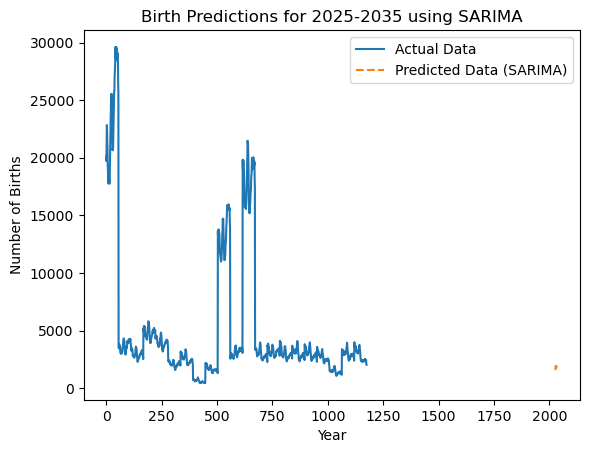

In [158]:
# Εκπαίδευση του τελικού μοντέλου SARIMA με τις καλύτερες παραμέτρους
best_sarima_model = sm.tsa.statespace.SARIMAX(train_data,
                                              order=(0, 1, 2),
                                              seasonal_order=(0, 2, 2, 12),
                                              enforce_stationarity=False,
                                              enforce_invertibility=False)
sarima_results = best_sarima_model.fit()

# Προβλέψεις για τα έτη 2025-2035
pred_start = len(train_data)
pred_end = pred_start + 10
sarima_predictions = sarima_results.get_prediction(start=pred_start, end=pred_end)
predicted_births_sarima = sarima_predictions.predicted_mean

# Υπολογισμός του MSE για την εκπαίδευση και τα δοκιμαστικά έτη
mse_sarima = ((sarima_results.predict(start=len(train_data)-4, end=len(train_data)-1) - birth_data.loc[birth_data['Year'] > 2019]['Number'])**2).mean()
print(f"SARIMA MSE: {mse_sarima}")

# Προβολή των προβλέψεων
forecast_years = list(range(2025, 2036))
predicted_births_df = pd.DataFrame({'Year': forecast_years, 'Predicted_Births': predicted_births_sarima})
print(predicted_births_df)

# Αποθήκευση των αποτελεσμάτων σε CSV αρχείο
predicted_births_df.to_csv("C:/Users/theop/Downloads/SARIMA_Birth_Predictions_2025_2035.csv", index=False)

# Οπτικοποίηση των αποτελεσμάτων
plt.plot(train_data.index, train_data, label="Actual Data")
plt.plot(forecast_years, predicted_births_sarima, label="Predicted Data (SARIMA)", linestyle='--')
plt.title("Birth Predictions for 2025-2035 using SARIMA")
plt.xlabel("Year")
plt.ylabel("Number of Births")
plt.legend()
plt.show()


In [159]:
import itertools
import statsmodels.api as sm

# Όρια για τις παραμέτρους του SARIMA
p = d = q = range(0, 3)  # 0 έως 2 για p, d, q
seasonal_p = seasonal_d = seasonal_q = range(0, 3)  # 0 έως 2 για εποχιακά P, D, Q
seasonal_period = 12  # Εποχιακή περίοδος

# Δημιουργία όλων των δυνατών συνδυασμών παραμέτρων
non_seasonal_params = list(itertools.product(p, d, q))
seasonal_params = list(itertools.product(seasonal_p, seasonal_d, seasonal_q, [seasonal_period]))

# Αρχικές μεταβλητές για την αποθήκευση των καλύτερων αποτελεσμάτων
best_aic = float('inf')
best_params = None

# Έλεγχος όλων των συνδυασμών παραμέτρων
for param in non_seasonal_params:
    for seasonal_param in seasonal_params:
        try:
            # Δημιουργία και εκπαίδευση του SARIMA μοντέλου
            model = sm.tsa.statespace.SARIMAX(train_data, order=param, seasonal_order=seasonal_param, enforce_stationarity=False, enforce_invertibility=False)
            results = model.fit()

            # Έλεγχος για το χαμηλότερο AIC (κριτήριο αξιολόγησης του μοντέλου)
            if results.aic < best_aic:
                best_aic = results.aic
                best_params = (param, seasonal_param)
            print(f"SARIMA{param}x{seasonal_param} AIC:{results.aic}")
        except Exception as e:
            print(f"SARIMA{param}x{seasonal_param} απέτυχε: {e}")

# Εμφάνιση των καλύτερων παραμέτρων
print(f"Καλύτερο μοντέλο SARIMA: {best_params} με AIC: {best_aic}")


SARIMA(0, 0, 0)x(0, 0, 0, 12) AIC:24368.109632164604
SARIMA(0, 0, 0)x(0, 0, 1, 12) AIC:23347.816302368512
SARIMA(0, 0, 0)x(0, 0, 2, 12) AIC:22730.713770822913
SARIMA(0, 0, 0)x(0, 1, 0, 12) AIC:22610.655397060615
SARIMA(0, 0, 0)x(0, 1, 1, 12) AIC:22359.47475507701
SARIMA(0, 0, 0)x(0, 1, 2, 12) AIC:22126.95113062157
SARIMA(0, 0, 0)x(0, 2, 0, 12) AIC:23306.70722555032
SARIMA(0, 0, 0)x(0, 2, 1, 12) AIC:22404.18832511307
SARIMA(0, 0, 0)x(0, 2, 2, 12) AIC:22029.66703250953
SARIMA(0, 0, 0)x(1, 0, 0, 12) AIC:22500.932793036605
SARIMA(0, 0, 0)x(1, 0, 1, 12) AIC:22484.87075166376
SARIMA(0, 0, 0)x(1, 0, 2, 12) AIC:22218.595005463892
SARIMA(0, 0, 0)x(1, 1, 0, 12) AIC:22380.877214213142
SARIMA(0, 0, 0)x(1, 1, 1, 12) AIC:22271.162380009955
SARIMA(0, 0, 0)x(1, 1, 2, 12) AIC:22040.5120201924
SARIMA(0, 0, 0)x(1, 2, 0, 12) AIC:22693.00399446286
SARIMA(0, 0, 0)x(1, 2, 1, 12) AIC:22300.483586436494
SARIMA(0, 0, 0)x(1, 2, 2, 12) AIC:21934.02808549792
SARIMA(0, 0, 0)x(2, 0, 0, 12) AIC:22251.23492839541
SARI

C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 1)x(1, 2, 2, 12) AIC:20880.329199708547
SARIMA(0, 0, 1)x(2, 0, 0, 12) AIC:21190.0952151912
SARIMA(0, 0, 1)x(2, 0, 1, 12) AIC:21189.88092045765


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 1)x(2, 0, 2, 12) AIC:21141.882018980134
SARIMA(0, 0, 1)x(2, 1, 0, 12) AIC:21105.88070383802
SARIMA(0, 0, 1)x(2, 1, 1, 12) AIC:20995.068020577273


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 1)x(2, 1, 2, 12) AIC:21022.880626725382
SARIMA(0, 0, 1)x(2, 2, 0, 12) AIC:21315.92713062003
SARIMA(0, 0, 1)x(2, 2, 1, 12) AIC:21785.27661881297
SARIMA(0, 0, 1)x(2, 2, 2, 12) AIC:21740.390661467864
SARIMA(0, 0, 2)x(0, 0, 0, 12) AIC:21987.667429656958
SARIMA(0, 0, 2)x(0, 0, 1, 12) AIC:21260.004062514832
SARIMA(0, 0, 2)x(0, 0, 2, 12) AIC:20798.035825533545
SARIMA(0, 0, 2)x(0, 1, 0, 12) AIC:21019.266418839175
SARIMA(0, 0, 2)x(0, 1, 1, 12) AIC:20681.47887085831


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(0, 1, 2, 12) AIC:20414.94758278701
SARIMA(0, 0, 2)x(0, 2, 0, 12) AIC:22150.510990358707
SARIMA(0, 0, 2)x(0, 2, 1, 12) AIC:20688.985243300966


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(0, 2, 2, 12) AIC:20370.12830118079
SARIMA(0, 0, 2)x(1, 0, 0, 12) AIC:20904.22115970706


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(1, 0, 1, 12) AIC:20812.798084010832
SARIMA(0, 0, 2)x(1, 0, 2, 12) AIC:20549.6005413551
SARIMA(0, 0, 2)x(1, 1, 0, 12) AIC:20756.25047996285
SARIMA(0, 0, 2)x(1, 1, 1, 12) AIC:20590.13096660834


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(1, 1, 2, 12) AIC:20452.5665496985
SARIMA(0, 0, 2)x(1, 2, 0, 12) AIC:21200.17139516856
SARIMA(0, 0, 2)x(1, 2, 1, 12) AIC:20630.173748406516


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(1, 2, 2, 12) AIC:20670.725879835307
SARIMA(0, 0, 2)x(2, 0, 0, 12) AIC:20614.103576775873


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(2, 0, 1, 12) AIC:20616.152656209983


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(2, 0, 2, 12) AIC:20555.373024843062
SARIMA(0, 0, 2)x(2, 1, 0, 12) AIC:20535.37764164513


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(2, 1, 1, 12) AIC:20523.58119774047


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(2, 1, 2, 12) AIC:20681.585518997454
SARIMA(0, 0, 2)x(2, 2, 0, 12) AIC:20781.554798586934
SARIMA(0, 0, 2)x(2, 2, 1, 12) AIC:20458.255750429915


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 0, 2)x(2, 2, 2, 12) AIC:21014.161014055717
SARIMA(0, 1, 0)x(0, 0, 0, 12) AIC:19741.422985449863
SARIMA(0, 1, 0)x(0, 0, 1, 12) AIC:19542.56194236007
SARIMA(0, 1, 0)x(0, 0, 2, 12) AIC:19345.966217972895
SARIMA(0, 1, 0)x(0, 1, 0, 12) AIC:20382.177596577654
SARIMA(0, 1, 0)x(0, 1, 1, 12) AIC:19447.52393504826
SARIMA(0, 1, 0)x(0, 1, 2, 12) AIC:19193.395813339263
SARIMA(0, 1, 0)x(0, 2, 0, 12) AIC:21443.589754562086
SARIMA(0, 1, 0)x(0, 2, 1, 12) AIC:20008.30833628298
SARIMA(0, 1, 0)x(0, 2, 2, 12) AIC:19326.23664752012
SARIMA(0, 1, 0)x(1, 0, 0, 12) AIC:19559.304923451906
SARIMA(0, 1, 0)x(1, 0, 1, 12) AIC:19531.019046711852
SARIMA(0, 1, 0)x(1, 0, 2, 12) AIC:19329.247896094654
SARIMA(0, 1, 0)x(1, 1, 0, 12) AIC:19851.61576261359
SARIMA(0, 1, 0)x(1, 1, 1, 12) AIC:19414.30300015898
SARIMA(0, 1, 0)x(1, 1, 2, 12) AIC:19201.80916015607
SARIMA(0, 1, 0)x(1, 2, 0, 12) AIC:20559.000959079836
SARIMA(0, 1, 0)x(1, 2, 1, 12) AIC:19696.32335990969
SARIMA(0, 1, 0)x(1, 2, 2, 12) AIC:19201.92883473453
SA

C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 0)x(2, 0, 2, 12) AIC:19337.24253312817
SARIMA(0, 1, 0)x(2, 1, 0, 12) AIC:19527.135200738223
SARIMA(0, 1, 0)x(2, 1, 1, 12) AIC:19230.84556814452
SARIMA(0, 1, 0)x(2, 1, 2, 12) AIC:19201.511183446808
SARIMA(0, 1, 0)x(2, 2, 0, 12) AIC:20055.58993350651
SARIMA(0, 1, 0)x(2, 2, 1, 12) AIC:19413.769448540326
SARIMA(0, 1, 0)x(2, 2, 2, 12) AIC:19173.104869361396
SARIMA(0, 1, 1)x(0, 0, 0, 12) AIC:19724.85866372239
SARIMA(0, 1, 1)x(0, 0, 1, 12) AIC:19527.834166884757
SARIMA(0, 1, 1)x(0, 0, 2, 12) AIC:19331.40627532315
SARIMA(0, 1, 1)x(0, 1, 0, 12) AIC:20365.312939178075
SARIMA(0, 1, 1)x(0, 1, 1, 12) AIC:19397.458623691233
SARIMA(0, 1, 1)x(0, 1, 2, 12) AIC:19177.47413062467
SARIMA(0, 1, 1)x(0, 2, 0, 12) AIC:21426.777186856318
SARIMA(0, 1, 1)x(0, 2, 1, 12) AIC:19991.645819045807
SARIMA(0, 1, 1)x(0, 2, 2, 12) AIC:19126.3534779533
SARIMA(0, 1, 1)x(1, 0, 0, 12) AIC:19560.49805800504
SARIMA(0, 1, 1)x(1, 0, 1, 12) AIC:19529.210692566223
SARIMA(0, 1, 1)x(1, 0, 2, 12) AIC:19333.1171407961
SARI

C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(1, 2, 2, 12) AIC:19128.716088731697
SARIMA(0, 1, 1)x(2, 0, 0, 12) AIC:19363.77071845343
SARIMA(0, 1, 1)x(2, 0, 1, 12) AIC:19365.206278061632
SARIMA(0, 1, 1)x(2, 0, 2, 12) AIC:19309.562718245186
SARIMA(0, 1, 1)x(2, 1, 0, 12) AIC:19527.973777325213
SARIMA(0, 1, 1)x(2, 1, 1, 12) AIC:19232.259512381686


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(2, 1, 2, 12) AIC:19181.119814011145
SARIMA(0, 1, 1)x(2, 2, 0, 12) AIC:20055.841463164616
SARIMA(0, 1, 1)x(2, 2, 1, 12) AIC:19382.925993650577
SARIMA(0, 1, 1)x(2, 2, 2, 12) AIC:20114.991161272024
SARIMA(0, 1, 2)x(0, 0, 0, 12) AIC:19698.131880467437
SARIMA(0, 1, 2)x(0, 0, 1, 12) AIC:19503.5290075379
SARIMA(0, 1, 2)x(0, 0, 2, 12) AIC:19305.807543568648
SARIMA(0, 1, 2)x(0, 1, 0, 12) AIC:20334.406788677024
SARIMA(0, 1, 2)x(0, 1, 1, 12) AIC:19370.501810404097
SARIMA(0, 1, 2)x(0, 1, 2, 12) AIC:19154.043997053763
SARIMA(0, 1, 2)x(0, 2, 0, 12) AIC:21395.514862219523
SARIMA(0, 1, 2)x(0, 2, 1, 12) AIC:19961.652190815686


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(0, 2, 2, 12) AIC:19103.11239856766
SARIMA(0, 1, 2)x(1, 0, 0, 12) AIC:19552.158305126755
SARIMA(0, 1, 2)x(1, 0, 1, 12) AIC:19505.07141026438
SARIMA(0, 1, 2)x(1, 0, 2, 12) AIC:19307.647722248606
SARIMA(0, 1, 2)x(1, 1, 0, 12) AIC:19842.0951782278
SARIMA(0, 1, 2)x(1, 1, 1, 12) AIC:19373.754440874938


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(1, 1, 2, 12) AIC:19152.66438019922
SARIMA(0, 1, 2)x(1, 2, 0, 12) AIC:20549.81274620891
SARIMA(0, 1, 2)x(1, 2, 1, 12) AIC:19639.255736022715


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(1, 2, 2, 12) AIC:19105.07216751807
SARIMA(0, 1, 2)x(2, 0, 0, 12) AIC:19356.354755269414
SARIMA(0, 1, 2)x(2, 0, 1, 12) AIC:19357.893293620662
SARIMA(0, 1, 2)x(2, 0, 2, 12) AIC:19282.4879057453
SARIMA(0, 1, 2)x(2, 1, 0, 12) AIC:19518.048848607174
SARIMA(0, 1, 2)x(2, 1, 1, 12) AIC:19225.682212410848


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(2, 1, 2, 12) AIC:19154.145956497538
SARIMA(0, 1, 2)x(2, 2, 0, 12) AIC:20044.92054314114
SARIMA(0, 1, 2)x(2, 2, 1, 12) AIC:19373.501688682303


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(2, 2, 2, 12) AIC:19629.157252395216
SARIMA(0, 2, 0)x(0, 0, 0, 12) AIC:20498.862445278457
SARIMA(0, 2, 0)x(0, 0, 1, 12) AIC:20296.897063051863
SARIMA(0, 2, 0)x(0, 0, 2, 12) AIC:20096.99773256439
SARIMA(0, 2, 0)x(0, 1, 0, 12) AIC:21128.677177919428
SARIMA(0, 2, 0)x(0, 1, 1, 12) AIC:20269.91896173078
SARIMA(0, 2, 0)x(0, 1, 2, 12) AIC:19947.72736408187
SARIMA(0, 2, 0)x(0, 2, 0, 12) AIC:22192.51867020992
SARIMA(0, 2, 0)x(0, 2, 1, 12) AIC:20907.46469950831
SARIMA(0, 2, 0)x(0, 2, 2, 12) AIC:20268.18413066227
SARIMA(0, 2, 0)x(1, 0, 0, 12) AIC:20313.57214589287
SARIMA(0, 2, 0)x(1, 0, 1, 12) AIC:20298.24238772248
SARIMA(0, 2, 0)x(1, 0, 2, 12) AIC:20080.30084282302
SARIMA(0, 2, 0)x(1, 1, 0, 12) AIC:20584.501692048376
SARIMA(0, 2, 0)x(1, 1, 1, 12) AIC:20158.824894305835
SARIMA(0, 2, 0)x(1, 1, 2, 12) AIC:19941.114531545725
SARIMA(0, 2, 0)x(1, 2, 0, 12) AIC:21288.701118008437
SARIMA(0, 2, 0)x(1, 2, 1, 12) AIC:20406.790966636196
SARIMA(0, 2, 0)x(1, 2, 2, 12) AIC:19974.419053046142
SA

C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 1)x(0, 2, 2, 12) AIC:19133.665058059596
SARIMA(0, 2, 1)x(1, 0, 0, 12) AIC:19572.27412144781
SARIMA(0, 2, 1)x(1, 0, 1, 12) AIC:19541.702842909155
SARIMA(0, 2, 1)x(1, 0, 2, 12) AIC:19343.519374489668
SARIMA(0, 2, 1)x(1, 1, 0, 12) AIC:19961.367407997437
SARIMA(0, 2, 1)x(1, 1, 1, 12) AIC:19400.765142684853
SARIMA(0, 2, 1)x(1, 1, 2, 12) AIC:19513.19830019032
SARIMA(0, 2, 1)x(1, 2, 0, 12) AIC:20824.54604600674
SARIMA(0, 2, 1)x(1, 2, 1, 12) AIC:19683.066157791287


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 1)x(1, 2, 2, 12) AIC:19346.55626942953
SARIMA(0, 2, 1)x(2, 0, 0, 12) AIC:19374.878717125343
SARIMA(0, 2, 1)x(2, 0, 1, 12) AIC:19376.909649093235
SARIMA(0, 2, 1)x(2, 0, 2, 12) AIC:19327.188126930927
SARIMA(0, 2, 1)x(2, 1, 0, 12) AIC:19525.10166696078
SARIMA(0, 2, 1)x(2, 1, 1, 12) AIC:19227.278852966105


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 1)x(2, 1, 2, 12) AIC:19180.404231884757
SARIMA(0, 2, 1)x(2, 2, 0, 12) AIC:20054.345847411132
SARIMA(0, 2, 1)x(2, 2, 1, 12) AIC:19386.19829666551


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 1)x(2, 2, 2, 12) AIC:19189.312913307604
SARIMA(0, 2, 2)x(0, 0, 0, 12) AIC:19720.9368988683
SARIMA(0, 2, 2)x(0, 0, 1, 12) AIC:19515.060951016356
SARIMA(0, 2, 2)x(0, 0, 2, 12) AIC:19317.511302699997
SARIMA(0, 2, 2)x(0, 1, 0, 12) AIC:20363.38654460689
SARIMA(0, 2, 2)x(0, 1, 1, 12) AIC:19372.605445118897
SARIMA(0, 2, 2)x(0, 1, 2, 12) AIC:19161.711867950486
SARIMA(0, 2, 2)x(0, 2, 0, 12) AIC:21412.156544737285
SARIMA(0, 2, 2)x(0, 2, 1, 12) AIC:19978.559496454873


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 2)x(0, 2, 2, 12) AIC:19109.813783793288
SARIMA(0, 2, 2)x(1, 0, 0, 12) AIC:19563.450247166533
SARIMA(0, 2, 2)x(1, 0, 1, 12) AIC:19516.641819369368
SARIMA(0, 2, 2)x(1, 0, 2, 12) AIC:19319.580871996142
SARIMA(0, 2, 2)x(1, 1, 0, 12) AIC:19940.75279005571
SARIMA(0, 2, 2)x(1, 1, 1, 12) AIC:19376.11290009386


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 2)x(1, 1, 2, 12) AIC:19163.32854279958
SARIMA(0, 2, 2)x(1, 2, 0, 12) AIC:20795.222755112758
SARIMA(0, 2, 2)x(1, 2, 1, 12) AIC:19666.024149647725


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 2)x(1, 2, 2, 12) AIC:19644.837096375886
SARIMA(0, 2, 2)x(2, 0, 0, 12) AIC:19366.514130410196
SARIMA(0, 2, 2)x(2, 0, 1, 12) AIC:19368.398596625604
SARIMA(0, 2, 2)x(2, 0, 2, 12) AIC:19288.596922207096
SARIMA(0, 2, 2)x(2, 1, 0, 12) AIC:19661.38462582845
SARIMA(0, 2, 2)x(2, 1, 1, 12) AIC:19226.85073474751


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 2)x(2, 1, 2, 12) AIC:19467.180119723445
SARIMA(0, 2, 2)x(2, 2, 0, 12) AIC:20054.095661856874
SARIMA(0, 2, 2)x(2, 2, 1, 12) AIC:19386.65860212539


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 2, 2)x(2, 2, 2, 12) AIC:19625.243420602794
SARIMA(1, 0, 0)x(0, 0, 0, 12) AIC:19749.722299351553
SARIMA(1, 0, 0)x(0, 0, 1, 12) AIC:19551.666646948404
SARIMA(1, 0, 0)x(0, 0, 2, 12) AIC:19350.155963340003
SARIMA(1, 0, 0)x(0, 1, 0, 12) AIC:20356.585527547664
SARIMA(1, 0, 0)x(0, 1, 1, 12) AIC:19482.404845123543
SARIMA(1, 0, 0)x(0, 1, 2, 12) AIC:19214.18835277381
SARIMA(1, 0, 0)x(0, 2, 0, 12) AIC:21403.077296723386
SARIMA(1, 0, 0)x(0, 2, 1, 12) AIC:19990.15328327637
SARIMA(1, 0, 0)x(0, 2, 2, 12) AIC:19291.5213694118
SARIMA(1, 0, 0)x(1, 0, 0, 12) AIC:19551.632395169745
SARIMA(1, 0, 0)x(1, 0, 1, 12) AIC:19552.918205091068
SARIMA(1, 0, 0)x(1, 0, 2, 12) AIC:19350.383899606404
SARIMA(1, 0, 0)x(1, 1, 0, 12) AIC:19824.054188831928
SARIMA(1, 0, 0)x(1, 1, 1, 12) AIC:19475.38468089048
SARIMA(1, 0, 0)x(1, 1, 2, 12) AIC:19195.31957890147
SARIMA(1, 0, 0)x(1, 2, 0, 12) AIC:20516.744159543578
SARIMA(1, 0, 0)x(1, 2, 1, 12) AIC:19688.21458067224


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 0)x(1, 2, 2, 12) AIC:19292.035094359435
SARIMA(1, 0, 0)x(2, 0, 0, 12) AIC:19350.393821087335
SARIMA(1, 0, 0)x(2, 0, 1, 12) AIC:19350.395245610045
SARIMA(1, 0, 0)x(2, 0, 2, 12) AIC:19352.37729039939
SARIMA(1, 0, 0)x(2, 1, 0, 12) AIC:19507.041225169814
SARIMA(1, 0, 0)x(2, 1, 1, 12) AIC:19217.24731192382


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 0)x(2, 1, 2, 12) AIC:19196.91577200034
SARIMA(1, 0, 0)x(2, 2, 0, 12) AIC:20021.686599727815
SARIMA(1, 0, 0)x(2, 2, 1, 12) AIC:19381.768734492965


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 0)x(2, 2, 2, 12) AIC:19433.108074267493
SARIMA(1, 0, 1)x(0, 0, 0, 12) AIC:19734.564022408904
SARIMA(1, 0, 1)x(0, 0, 1, 12) AIC:19536.107189566363
SARIMA(1, 0, 1)x(0, 0, 2, 12) AIC:19335.445010926007
SARIMA(1, 0, 1)x(0, 1, 0, 12) AIC:20336.987531721716
SARIMA(1, 0, 1)x(0, 1, 1, 12) AIC:19451.42893085376
SARIMA(1, 0, 1)x(0, 1, 2, 12) AIC:19196.10611619248
SARIMA(1, 0, 1)x(0, 2, 0, 12) AIC:21381.782930200832
SARIMA(1, 0, 1)x(0, 2, 1, 12) AIC:19972.561982514555
SARIMA(1, 0, 1)x(0, 2, 2, 12) AIC:19254.01104479069
SARIMA(1, 0, 1)x(1, 0, 0, 12) AIC:19552.5171899956
SARIMA(1, 0, 1)x(1, 0, 1, 12) AIC:19537.348033797578
SARIMA(1, 0, 1)x(1, 0, 2, 12) AIC:19335.72374361111
SARIMA(1, 0, 1)x(1, 1, 0, 12) AIC:19822.262742681738
SARIMA(1, 0, 1)x(1, 1, 1, 12) AIC:19452.6106028215


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 1)x(1, 1, 2, 12) AIC:19237.68052116233
SARIMA(1, 0, 1)x(1, 2, 0, 12) AIC:20513.417716959324
SARIMA(1, 0, 1)x(1, 2, 1, 12) AIC:19670.823844646242


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 1)x(1, 2, 2, 12) AIC:19262.92697546693
SARIMA(1, 0, 1)x(2, 0, 0, 12) AIC:19351.55564164299
SARIMA(1, 0, 1)x(2, 0, 1, 12) AIC:19347.345409021495
SARIMA(1, 0, 1)x(2, 0, 2, 12) AIC:19313.550429749568
SARIMA(1, 0, 1)x(2, 1, 0, 12) AIC:19506.439930861856
SARIMA(1, 0, 1)x(2, 1, 1, 12) AIC:19218.053619822247


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 1)x(2, 1, 2, 12) AIC:19182.207943100908
SARIMA(1, 0, 1)x(2, 2, 0, 12) AIC:20018.669527191567
SARIMA(1, 0, 1)x(2, 2, 1, 12) AIC:19381.88740811067


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 1)x(2, 2, 2, 12) AIC:19535.554955079035
SARIMA(1, 0, 2)x(0, 0, 0, 12) AIC:19706.919078506766
SARIMA(1, 0, 2)x(0, 0, 1, 12) AIC:19510.735084813685
SARIMA(1, 0, 2)x(0, 0, 2, 12) AIC:19311.332887079217
SARIMA(1, 0, 2)x(0, 1, 0, 12) AIC:20296.701619902982
SARIMA(1, 0, 2)x(0, 1, 1, 12) AIC:19425.502156910097
SARIMA(1, 0, 2)x(0, 1, 2, 12) AIC:19169.805823729046
SARIMA(1, 0, 2)x(0, 2, 0, 12) AIC:21336.42705926263
SARIMA(1, 0, 2)x(0, 2, 1, 12) AIC:19937.786698386368


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 2)x(0, 2, 2, 12) AIC:19222.668540977662
SARIMA(1, 0, 2)x(1, 0, 0, 12) AIC:19542.966895137353
SARIMA(1, 0, 2)x(1, 0, 1, 12) AIC:19512.25604260656
SARIMA(1, 0, 2)x(1, 0, 2, 12) AIC:19303.498405622668
SARIMA(1, 0, 2)x(1, 1, 0, 12) AIC:19806.705553870517
SARIMA(1, 0, 2)x(1, 1, 1, 12) AIC:19426.465581625263


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 2)x(1, 1, 2, 12) AIC:19156.41775764412
SARIMA(1, 0, 2)x(1, 2, 0, 12) AIC:20493.88035856188
SARIMA(1, 0, 2)x(1, 2, 1, 12) AIC:19643.363275330128


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 2)x(1, 2, 2, 12) AIC:19229.45251468275
SARIMA(1, 0, 2)x(2, 0, 0, 12) AIC:19343.1123094488
SARIMA(1, 0, 2)x(2, 0, 1, 12) AIC:19335.385257544207
SARIMA(1, 0, 2)x(2, 0, 2, 12) AIC:19286.072735732814
SARIMA(1, 0, 2)x(2, 1, 0, 12) AIC:19492.257879270164
SARIMA(1, 0, 2)x(2, 1, 1, 12) AIC:19208.438950141088


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 2)x(2, 1, 2, 12) AIC:19178.070936570643
SARIMA(1, 0, 2)x(2, 2, 0, 12) AIC:19999.830718523503
SARIMA(1, 0, 2)x(2, 2, 1, 12) AIC:19371.29151663518


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 0, 2)x(2, 2, 2, 12) AIC:19227.64141777381
SARIMA(1, 1, 0)x(0, 0, 0, 12) AIC:19742.20050138706
SARIMA(1, 1, 0)x(0, 0, 1, 12) AIC:19543.527448941866
SARIMA(1, 1, 0)x(0, 0, 2, 12) AIC:19347.247790596084
SARIMA(1, 1, 0)x(0, 1, 0, 12) AIC:20382.653678983836
SARIMA(1, 1, 0)x(0, 1, 1, 12) AIC:19414.930522414958
SARIMA(1, 1, 0)x(0, 1, 2, 12) AIC:19194.623233497983
SARIMA(1, 1, 0)x(0, 2, 0, 12) AIC:21444.542296167536
SARIMA(1, 1, 0)x(0, 2, 1, 12) AIC:20494.836153736756
SARIMA(1, 1, 0)x(0, 2, 2, 12) AIC:19142.19078674225
SARIMA(1, 1, 0)x(1, 0, 0, 12) AIC:19543.442151314033
SARIMA(1, 1, 0)x(1, 0, 1, 12) AIC:19544.608482112577
SARIMA(1, 1, 0)x(1, 0, 2, 12) AIC:19348.958354050752
SARIMA(1, 1, 0)x(1, 1, 0, 12) AIC:19835.463038409016
SARIMA(1, 1, 0)x(1, 1, 1, 12) AIC:19416.929305622507
SARIMA(1, 1, 0)x(1, 1, 2, 12) AIC:19419.708101572673
SARIMA(1, 1, 0)x(1, 2, 0, 12) AIC:20542.162840989236
SARIMA(1, 1, 0)x(1, 2, 1, 12) AIC:19684.393822676546


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(1, 2, 2, 12) AIC:19181.657613737545
SARIMA(1, 1, 0)x(2, 0, 0, 12) AIC:19347.341370735427
SARIMA(1, 1, 0)x(2, 0, 1, 12) AIC:19348.85700087952
SARIMA(1, 1, 0)x(2, 0, 2, 12) AIC:19325.7363024124
SARIMA(1, 1, 0)x(2, 1, 0, 12) AIC:19511.08369693814
SARIMA(1, 1, 0)x(2, 1, 1, 12) AIC:19197.176153317283


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(2, 1, 2, 12) AIC:19194.72335890189
SARIMA(1, 1, 0)x(2, 2, 0, 12) AIC:20038.49108027081
SARIMA(1, 1, 0)x(2, 2, 1, 12) AIC:19368.095120134327
SARIMA(1, 1, 0)x(2, 2, 2, 12) AIC:20131.68809754122
SARIMA(1, 1, 1)x(0, 0, 0, 12) AIC:19722.361471424134
SARIMA(1, 1, 1)x(0, 0, 1, 12) AIC:19526.147402902614
SARIMA(1, 1, 1)x(0, 0, 2, 12) AIC:19329.44479034827
SARIMA(1, 1, 1)x(0, 1, 0, 12) AIC:20360.140354539042
SARIMA(1, 1, 1)x(0, 1, 1, 12) AIC:19396.93169337555


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(0, 1, 2, 12) AIC:19179.283921191865
SARIMA(1, 1, 1)x(0, 2, 0, 12) AIC:21421.482255133582
SARIMA(1, 1, 1)x(0, 2, 1, 12) AIC:19966.054584114056


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(0, 2, 2, 12) AIC:19437.03564516901
SARIMA(1, 1, 1)x(1, 0, 0, 12) AIC:19541.688891713373
SARIMA(1, 1, 1)x(1, 0, 1, 12) AIC:19511.672183820927
SARIMA(1, 1, 1)x(1, 0, 2, 12) AIC:19331.277856569606
SARIMA(1, 1, 1)x(1, 1, 0, 12) AIC:19832.115744630635


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(1, 1, 1, 12) AIC:19398.881091080086


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(1, 1, 2, 12) AIC:19306.663721562196
SARIMA(1, 1, 1)x(1, 2, 0, 12) AIC:20504.083510631455


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(1, 2, 1, 12) AIC:19666.63077152582


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(1, 2, 2, 12) AIC:20108.47154453967
SARIMA(1, 1, 1)x(2, 0, 0, 12) AIC:19346.16468659372
SARIMA(1, 1, 1)x(2, 0, 1, 12) AIC:19347.681862624675
SARIMA(1, 1, 1)x(2, 0, 2, 12) AIC:19306.559270289465
SARIMA(1, 1, 1)x(2, 1, 0, 12) AIC:19508.478425869707
SARIMA(1, 1, 1)x(2, 1, 1, 12) AIC:19198.973905133684


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(2, 1, 2, 12) AIC:19333.49021312485
SARIMA(1, 1, 1)x(2, 2, 0, 12) AIC:20010.809954154873


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(2, 2, 1, 12) AIC:19371.533902097966


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(2, 2, 2, 12) AIC:20111.009236132446
SARIMA(1, 1, 2)x(0, 0, 0, 12) AIC:19700.079636987
SARIMA(1, 1, 2)x(0, 0, 1, 12) AIC:19505.48741712569
SARIMA(1, 1, 2)x(0, 0, 2, 12) AIC:19307.796957190472
SARIMA(1, 1, 2)x(0, 1, 0, 12) AIC:20335.259782067762
SARIMA(1, 1, 2)x(0, 1, 1, 12) AIC:19389.141207617882
SARIMA(1, 1, 2)x(0, 1, 2, 12) AIC:19156.0276643049
SARIMA(1, 1, 2)x(0, 2, 0, 12) AIC:21395.799335598


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(0, 2, 1, 12) AIC:19962.700633197477


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(0, 2, 2, 12) AIC:19689.938161081333
SARIMA(1, 1, 2)x(1, 0, 0, 12) AIC:19537.11844420757
SARIMA(1, 1, 2)x(1, 0, 1, 12) AIC:19506.946683380695
SARIMA(1, 1, 2)x(1, 0, 2, 12) AIC:19309.64072826995
SARIMA(1, 1, 2)x(1, 1, 0, 12) AIC:19827.110938017882


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(1, 1, 1, 12) AIC:19374.455637051455


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(1, 1, 2, 12) AIC:19158.633192254827
SARIMA(1, 1, 2)x(1, 2, 0, 12) AIC:20504.248307093545


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(1, 2, 1, 12) AIC:19640.834849769846


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(1, 2, 2, 12) AIC:20082.965982061916
SARIMA(1, 1, 2)x(2, 0, 0, 12) AIC:19342.041930889696
SARIMA(1, 1, 2)x(2, 0, 1, 12) AIC:19343.682106854103
SARIMA(1, 1, 2)x(2, 0, 2, 12) AIC:19284.143577482246
SARIMA(1, 1, 2)x(2, 1, 0, 12) AIC:19496.285895266818
SARIMA(1, 1, 2)x(2, 1, 1, 12) AIC:19191.61547928743


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(2, 1, 2, 12) AIC:19338.31598828965
SARIMA(1, 1, 2)x(2, 2, 0, 12) AIC:20029.434740085046


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(2, 2, 1, 12) AIC:19360.37104833928


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(2, 2, 2, 12) AIC:20077.996276230413
SARIMA(1, 2, 0)x(0, 0, 0, 12) AIC:20111.02730733005
SARIMA(1, 2, 0)x(0, 0, 1, 12) AIC:19909.543093154643
SARIMA(1, 2, 0)x(0, 0, 2, 12) AIC:19714.579199668042
SARIMA(1, 2, 0)x(0, 1, 0, 12) AIC:20727.38397014939
SARIMA(1, 2, 0)x(0, 1, 1, 12) AIC:19771.584260227984
SARIMA(1, 2, 0)x(0, 1, 2, 12) AIC:19556.822546242853
SARIMA(1, 2, 0)x(0, 2, 0, 12) AIC:21783.231254653507
SARIMA(1, 2, 0)x(0, 2, 1, 12) AIC:20352.51042029355
SARIMA(1, 2, 0)x(0, 2, 2, 12) AIC:20460.145135817504
SARIMA(1, 2, 0)x(1, 0, 0, 12) AIC:19909.525571949755
SARIMA(1, 2, 0)x(1, 0, 1, 12) AIC:19911.154358481137
SARIMA(1, 2, 0)x(1, 0, 2, 12) AIC:19716.556839489946
SARIMA(1, 2, 0)x(1, 1, 0, 12) AIC:20188.14112787439
SARIMA(1, 2, 0)x(1, 1, 1, 12) AIC:19773.910863277742


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 0)x(1, 1, 2, 12) AIC:19551.3437475668
SARIMA(1, 2, 0)x(1, 2, 0, 12) AIC:20893.040594310518
SARIMA(1, 2, 0)x(1, 2, 1, 12) AIC:20033.504060644198


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 0)x(1, 2, 2, 12) AIC:19472.76288100075
SARIMA(1, 2, 0)x(2, 0, 0, 12) AIC:19714.58337319897
SARIMA(1, 2, 0)x(2, 0, 1, 12) AIC:19716.54979920831
SARIMA(1, 2, 0)x(2, 0, 2, 12) AIC:19718.592655715776
SARIMA(1, 2, 0)x(2, 1, 0, 12) AIC:19858.438777945732
SARIMA(1, 2, 0)x(2, 1, 1, 12) AIC:19558.90754829876
SARIMA(1, 2, 0)x(2, 1, 2, 12) AIC:19559.35181409164
SARIMA(1, 2, 0)x(2, 2, 0, 12) AIC:20375.517840150394
SARIMA(1, 2, 0)x(2, 2, 1, 12) AIC:19709.6298212429


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 0)x(2, 2, 2, 12) AIC:19494.282811033376
SARIMA(1, 2, 1)x(0, 0, 0, 12) AIC:19769.05175883854
SARIMA(1, 2, 1)x(0, 0, 1, 12) AIC:19540.01633689616
SARIMA(1, 2, 1)x(0, 0, 2, 12) AIC:19341.45369165483
SARIMA(1, 2, 1)x(0, 1, 0, 12) AIC:20392.95176065515
SARIMA(1, 2, 1)x(0, 1, 1, 12) AIC:19399.886362820856
SARIMA(1, 2, 1)x(0, 1, 2, 12) AIC:19177.918077269795
SARIMA(1, 2, 1)x(0, 2, 0, 12) AIC:21440.458846830552
SARIMA(1, 2, 1)x(0, 2, 1, 12) AIC:20602.362467862917
SARIMA(1, 2, 1)x(0, 2, 2, 12) AIC:20258.740595956115
SARIMA(1, 2, 1)x(1, 0, 0, 12) AIC:19555.63629836891
SARIMA(1, 2, 1)x(1, 0, 1, 12) AIC:19541.187517188075
SARIMA(1, 2, 1)x(1, 0, 2, 12) AIC:19323.67205757948
SARIMA(1, 2, 1)x(1, 1, 0, 12) AIC:19833.158476067132
SARIMA(1, 2, 1)x(1, 1, 1, 12) AIC:19403.016583149703


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 1)x(1, 1, 2, 12) AIC:19241.127969063855
SARIMA(1, 2, 1)x(1, 2, 0, 12) AIC:20800.021176573406
SARIMA(1, 2, 1)x(1, 2, 1, 12) AIC:19682.491288851823


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 1)x(1, 2, 2, 12) AIC:19883.368224549165
SARIMA(1, 2, 1)x(2, 0, 0, 12) AIC:19358.391069204925


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 1)x(2, 0, 1, 12) AIC:19340.519071591225
SARIMA(1, 2, 1)x(2, 0, 2, 12) AIC:19326.881248782553
SARIMA(1, 2, 1)x(2, 1, 0, 12) AIC:19661.917747982974
SARIMA(1, 2, 1)x(2, 1, 1, 12) AIC:19208.18915377007


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 1)x(2, 1, 2, 12) AIC:19182.507353303758
SARIMA(1, 2, 1)x(2, 2, 0, 12) AIC:20462.230083018843
SARIMA(1, 2, 1)x(2, 2, 1, 12) AIC:19369.52530423695


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 1)x(2, 2, 2, 12) AIC:19507.65007660853
SARIMA(1, 2, 2)x(0, 0, 0, 12) AIC:19707.019540239693
SARIMA(1, 2, 2)x(0, 0, 1, 12) AIC:19513.410966808333
SARIMA(1, 2, 2)x(0, 0, 2, 12) AIC:19314.872977648778
SARIMA(1, 2, 2)x(0, 1, 0, 12) AIC:20364.201563020506


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(0, 1, 1, 12) AIC:19385.26755956103


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(0, 1, 2, 12) AIC:19228.248570476804
SARIMA(1, 2, 2)x(0, 2, 0, 12) AIC:21411.6997943485


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(0, 2, 1, 12) AIC:20402.285151304997
SARIMA(1, 2, 2)x(0, 2, 2, 12) AIC:20180.736563080784
SARIMA(1, 2, 2)x(1, 0, 0, 12) AIC:19545.76270623989
SARIMA(1, 2, 2)x(1, 0, 1, 12) AIC:19515.303817837434
SARIMA(1, 2, 2)x(1, 0, 2, 12) AIC:19316.729666587118
SARIMA(1, 2, 2)x(1, 1, 0, 12) AIC:19918.585057022603


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(1, 1, 1, 12) AIC:19640.669915847524


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(1, 1, 2, 12) AIC:19435.341498108035
SARIMA(1, 2, 2)x(1, 2, 0, 12) AIC:20764.492589718342


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(1, 2, 1, 12) AIC:19658.82694538626


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(1, 2, 2, 12) AIC:20181.523737157026
SARIMA(1, 2, 2)x(2, 0, 0, 12) AIC:19338.691185511183
SARIMA(1, 2, 2)x(2, 0, 1, 12) AIC:19350.549862534084
SARIMA(1, 2, 2)x(2, 0, 2, 12) AIC:19290.672730114376


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(2, 1, 0, 12) AIC:19502.496999629904


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(2, 1, 1, 12) AIC:19382.77868452458


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(2, 1, 2, 12) AIC:19446.99867908225
SARIMA(1, 2, 2)x(2, 2, 0, 12) AIC:20418.752216731576
SARIMA(1, 2, 2)x(2, 2, 1, 12) AIC:20243.73093578503


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 2, 2)x(2, 2, 2, 12) AIC:20182.664449084554
SARIMA(2, 0, 0)x(0, 0, 0, 12) AIC:19734.299075979085
SARIMA(2, 0, 0)x(0, 0, 1, 12) AIC:19552.333985834597
SARIMA(2, 0, 0)x(0, 0, 2, 12) AIC:19351.17450575243
SARIMA(2, 0, 0)x(0, 1, 0, 12) AIC:20335.21928782408
SARIMA(2, 0, 0)x(0, 1, 1, 12) AIC:19474.633184998973
SARIMA(2, 0, 0)x(0, 1, 2, 12) AIC:19214.325334080182
SARIMA(2, 0, 0)x(0, 2, 0, 12) AIC:21379.619050994017
SARIMA(2, 0, 0)x(0, 2, 1, 12) AIC:19988.057059350598
SARIMA(2, 0, 0)x(0, 2, 2, 12) AIC:19290.807294864288
SARIMA(2, 0, 0)x(1, 0, 0, 12) AIC:19535.843314721278
SARIMA(2, 0, 0)x(1, 0, 1, 12) AIC:19537.11480509038
SARIMA(2, 0, 0)x(1, 0, 2, 12) AIC:19347.460195126612
SARIMA(2, 0, 0)x(1, 1, 0, 12) AIC:19845.94284123739
SARIMA(2, 0, 0)x(1, 1, 1, 12) AIC:19450.225081204946
SARIMA(2, 0, 0)x(1, 1, 2, 12) AIC:19408.813972576572
SARIMA(2, 0, 0)x(1, 2, 0, 12) AIC:20494.714728612307
SARIMA(2, 0, 0)x(1, 2, 1, 12) AIC:19669.645608276718


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 0)x(1, 2, 2, 12) AIC:19336.779561626656
SARIMA(2, 0, 0)x(2, 0, 0, 12) AIC:19335.493146894172
SARIMA(2, 0, 0)x(2, 0, 1, 12) AIC:19335.6403703204
SARIMA(2, 0, 0)x(2, 0, 2, 12) AIC:19313.784870418873
SARIMA(2, 0, 0)x(2, 1, 0, 12) AIC:19488.717613747736
SARIMA(2, 0, 0)x(2, 1, 1, 12) AIC:19198.37190930816


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 0)x(2, 1, 2, 12) AIC:19223.13986387935
SARIMA(2, 0, 0)x(2, 2, 0, 12) AIC:20000.023995436153
SARIMA(2, 0, 0)x(2, 2, 1, 12) AIC:19361.666497001614


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 0)x(2, 2, 2, 12) AIC:19396.80455919062
SARIMA(2, 0, 1)x(0, 0, 0, 12) AIC:19898.47324436072
SARIMA(2, 0, 1)x(0, 0, 1, 12) AIC:19534.165685751428
SARIMA(2, 0, 1)x(0, 0, 2, 12) AIC:19332.966973506656
SARIMA(2, 0, 1)x(0, 1, 0, 12) AIC:20294.368594509808
SARIMA(2, 0, 1)x(0, 1, 1, 12) AIC:19623.546556613725
SARIMA(2, 0, 1)x(0, 1, 2, 12) AIC:19390.60445099257
SARIMA(2, 0, 1)x(0, 2, 0, 12) AIC:21297.396179821622
SARIMA(2, 0, 1)x(0, 2, 1, 12) AIC:20399.050110307588
SARIMA(2, 0, 1)x(0, 2, 2, 12) AIC:20057.275896659245
SARIMA(2, 0, 1)x(1, 0, 0, 12) AIC:19537.963604058612
SARIMA(2, 0, 1)x(1, 0, 1, 12) AIC:19530.28832369782
SARIMA(2, 0, 1)x(1, 0, 2, 12) AIC:19340.368671946257
SARIMA(2, 0, 1)x(1, 1, 0, 12) AIC:19825.07431523564
SARIMA(2, 0, 1)x(1, 1, 1, 12) AIC:19625.53365281057
SARIMA(2, 0, 1)x(1, 1, 2, 12) AIC:19403.21087276599
SARIMA(2, 0, 1)x(1, 2, 0, 12) AIC:20610.9589956642
SARIMA(2, 0, 1)x(1, 2, 1, 12) AIC:20310.25947523315


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 1)x(1, 2, 2, 12) AIC:20057.005906556897
SARIMA(2, 0, 1)x(2, 0, 0, 12) AIC:19339.159615204357
SARIMA(2, 0, 1)x(2, 0, 1, 12) AIC:19337.836503516795
SARIMA(2, 0, 1)x(2, 0, 2, 12) AIC:19341.86347386254
SARIMA(2, 0, 1)x(2, 1, 0, 12) AIC:19535.079828449285


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 1)x(2, 1, 1, 12) AIC:19393.977248061085


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 1)x(2, 1, 2, 12) AIC:19404.999407239928
SARIMA(2, 0, 1)x(2, 2, 0, 12) AIC:20270.838552239304


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 1)x(2, 2, 1, 12) AIC:20072.113440869292


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 1)x(2, 2, 2, 12) AIC:20058.486954819095
SARIMA(2, 0, 2)x(0, 0, 0, 12) AIC:19708.80587138662
SARIMA(2, 0, 2)x(0, 0, 1, 12) AIC:19512.543351277534
SARIMA(2, 0, 2)x(0, 0, 2, 12) AIC:19313.186205083788
SARIMA(2, 0, 2)x(0, 1, 0, 12) AIC:20271.57699142876
SARIMA(2, 0, 2)x(0, 1, 1, 12) AIC:19603.578632265344


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(0, 1, 2, 12) AIC:19338.0858178214
SARIMA(2, 0, 2)x(0, 2, 0, 12) AIC:21250.22578930654
SARIMA(2, 0, 2)x(0, 2, 1, 12) AIC:20367.531633749415
SARIMA(2, 0, 2)x(0, 2, 2, 12) AIC:20026.065770849455
SARIMA(2, 0, 2)x(1, 0, 0, 12) AIC:19528.31875408013
SARIMA(2, 0, 2)x(1, 0, 1, 12) AIC:19514.076045675312
SARIMA(2, 0, 2)x(1, 0, 2, 12) AIC:19305.226780944395
SARIMA(2, 0, 2)x(1, 1, 0, 12) AIC:19821.45824663386


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(1, 1, 1, 12) AIC:19595.587922504463


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(1, 1, 2, 12) AIC:19353.12915216254
SARIMA(2, 0, 2)x(1, 2, 0, 12) AIC:20602.417545143013
SARIMA(2, 0, 2)x(1, 2, 1, 12) AIC:20279.06633758171


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(1, 2, 2, 12) AIC:20025.854974693088
SARIMA(2, 0, 2)x(2, 0, 0, 12) AIC:19329.132552044015
SARIMA(2, 0, 2)x(2, 0, 1, 12) AIC:19321.22147265863
SARIMA(2, 0, 2)x(2, 0, 2, 12) AIC:19287.870155261568


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(2, 1, 0, 12) AIC:19496.80937795779
SARIMA(2, 0, 2)x(2, 1, 1, 12) AIC:19388.129241469484


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(2, 1, 2, 12) AIC:19354.771117770626
SARIMA(2, 0, 2)x(2, 2, 0, 12) AIC:20259.04278349274


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(2, 2, 1, 12) AIC:20059.695055751836


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 0, 2)x(2, 2, 2, 12) AIC:20026.63738558059
SARIMA(2, 1, 0)x(0, 0, 0, 12) AIC:19716.558194662008
SARIMA(2, 1, 0)x(0, 0, 1, 12) AIC:19535.24013049741
SARIMA(2, 1, 0)x(0, 0, 2, 12) AIC:19340.043684975215
SARIMA(2, 1, 0)x(0, 1, 0, 12) AIC:20351.820600379655
SARIMA(2, 1, 0)x(0, 1, 1, 12) AIC:19405.216199252143
SARIMA(2, 1, 0)x(0, 1, 2, 12) AIC:19187.137076503583
SARIMA(2, 1, 0)x(0, 2, 0, 12) AIC:21412.168461312744
SARIMA(2, 1, 0)x(0, 2, 1, 12) AIC:19997.199835846375
SARIMA(2, 1, 0)x(0, 2, 2, 12) AIC:19134.847826607358
SARIMA(2, 1, 0)x(1, 0, 0, 12) AIC:19519.315433261276
SARIMA(2, 1, 0)x(1, 0, 1, 12) AIC:19520.840350372666
SARIMA(2, 1, 0)x(1, 0, 2, 12) AIC:19341.804957448046
SARIMA(2, 1, 0)x(1, 1, 0, 12) AIC:19809.223729626556
SARIMA(2, 1, 0)x(1, 1, 1, 12) AIC:19392.442147957525
SARIMA(2, 1, 0)x(1, 1, 2, 12) AIC:19188.480456486235
SARIMA(2, 1, 0)x(1, 2, 0, 12) AIC:20514.423910318437
SARIMA(2, 1, 0)x(1, 2, 1, 12) AIC:19657.87231159228


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(1, 2, 2, 12) AIC:19309.197495414883
SARIMA(2, 1, 0)x(2, 0, 0, 12) AIC:19324.12542135003
SARIMA(2, 1, 0)x(2, 0, 1, 12) AIC:19325.73821057182
SARIMA(2, 1, 0)x(2, 0, 2, 12) AIC:19301.625265226307
SARIMA(2, 1, 0)x(2, 1, 0, 12) AIC:19484.285121080742
SARIMA(2, 1, 0)x(2, 1, 1, 12) AIC:19172.201536219833


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(2, 1, 2, 12) AIC:19170.085037476325
SARIMA(2, 1, 0)x(2, 2, 0, 12) AIC:20010.75896661813
SARIMA(2, 1, 0)x(2, 2, 1, 12) AIC:19342.25925776754


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(2, 2, 2, 12) AIC:19248.627397843953
SARIMA(2, 1, 1)x(0, 0, 0, 12) AIC:19718.464002542783
SARIMA(2, 1, 1)x(0, 0, 1, 12) AIC:19521.365593210416
SARIMA(2, 1, 1)x(0, 0, 2, 12) AIC:19326.050632259732
SARIMA(2, 1, 1)x(0, 1, 0, 12) AIC:20353.100111216212
SARIMA(2, 1, 1)x(0, 1, 1, 12) AIC:19391.201476281403
SARIMA(2, 1, 1)x(0, 1, 2, 12) AIC:19171.499136967595
SARIMA(2, 1, 1)x(0, 2, 0, 12) AIC:21413.1915232185
SARIMA(2, 1, 1)x(0, 2, 1, 12) AIC:19981.203921328226


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(0, 2, 2, 12) AIC:19132.145632068256
SARIMA(2, 1, 1)x(1, 0, 0, 12) AIC:19521.313563311673
SARIMA(2, 1, 1)x(1, 0, 1, 12) AIC:19522.83235796939
SARIMA(2, 1, 1)x(1, 0, 2, 12) AIC:19327.815647944968
SARIMA(2, 1, 1)x(1, 1, 0, 12) AIC:19794.50642913913


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(1, 1, 1, 12) AIC:19394.018194467626


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(1, 1, 2, 12) AIC:19330.221123244773
SARIMA(2, 1, 1)x(1, 2, 0, 12) AIC:20482.35553737875
SARIMA(2, 1, 1)x(1, 2, 1, 12) AIC:19651.89138549155


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(1, 2, 2, 12) AIC:20069.448532045273
SARIMA(2, 1, 1)x(2, 0, 0, 12) AIC:19326.12567180526
SARIMA(2, 1, 1)x(2, 0, 1, 12) AIC:19327.738796484467
SARIMA(2, 1, 1)x(2, 0, 2, 12) AIC:19303.209038851404
SARIMA(2, 1, 1)x(2, 1, 0, 12) AIC:19477.923774490264
SARIMA(2, 1, 1)x(2, 1, 1, 12) AIC:19189.88077740629


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(2, 1, 2, 12) AIC:19369.861852668084


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(2, 2, 0, 12) AIC:19990.766397859847


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(2, 2, 1, 12) AIC:19344.391424387308


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(2, 2, 2, 12) AIC:20094.148431790883
SARIMA(2, 1, 2)x(0, 0, 0, 12) AIC:19702.084266017686
SARIMA(2, 1, 2)x(0, 0, 1, 12) AIC:19507.482252623635
SARIMA(2, 1, 2)x(0, 0, 2, 12) AIC:19309.78022265338
SARIMA(2, 1, 2)x(0, 1, 0, 12) AIC:20337.2520240136


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(0, 1, 1, 12) AIC:19377.38278065731


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(0, 1, 2, 12) AIC:19245.493047521384
SARIMA(2, 1, 2)x(0, 2, 0, 12) AIC:21397.555557081243


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(0, 2, 1, 12) AIC:20425.522375953457


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(0, 2, 2, 12) AIC:20074.845578179753
SARIMA(2, 1, 2)x(1, 0, 0, 12) AIC:19523.28602536279
SARIMA(2, 1, 2)x(1, 0, 1, 12) AIC:19508.946370139158
SARIMA(2, 1, 2)x(1, 0, 2, 12) AIC:19311.62510787602


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 1, 0, 12) AIC:19775.183032394874


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 1, 1, 12) AIC:19378.465475922556


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 1, 2, 12) AIC:19373.044966454083


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 2, 0, 12) AIC:20620.407950587178


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 2, 1, 12) AIC:20343.163395882766


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 2, 2, 12) AIC:20083.02925950579
SARIMA(2, 1, 2)x(2, 0, 0, 12) AIC:19328.117445237636
SARIMA(2, 1, 2)x(2, 0, 1, 12) AIC:19329.73541718843
SARIMA(2, 1, 2)x(2, 0, 2, 12) AIC:19286.094935328503


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 1, 0, 12) AIC:19537.183263344137


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 1, 1, 12) AIC:19357.62557529242


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 1, 2, 12) AIC:19378.494627723972


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 2, 0, 12) AIC:20297.914286564865


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 2, 1, 12) AIC:20113.313877159148


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 2, 2, 12) AIC:20085.197831797377
SARIMA(2, 2, 0)x(0, 0, 0, 12) AIC:19996.075678184774
SARIMA(2, 2, 0)x(0, 0, 1, 12) AIC:19812.80554858579
SARIMA(2, 2, 0)x(0, 0, 2, 12) AIC:19617.06994638814
SARIMA(2, 2, 0)x(0, 1, 0, 12) AIC:20608.87475186515
SARIMA(2, 2, 0)x(0, 1, 1, 12) AIC:19675.04993255401
SARIMA(2, 2, 0)x(0, 1, 2, 12) AIC:19461.667691760056
SARIMA(2, 2, 0)x(0, 2, 0, 12) AIC:21661.715687661275
SARIMA(2, 2, 0)x(0, 2, 1, 12) AIC:20251.88087301832


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 0)x(0, 2, 2, 12) AIC:19378.800236333514
SARIMA(2, 2, 0)x(1, 0, 0, 12) AIC:19796.734822601742
SARIMA(2, 2, 0)x(1, 0, 1, 12) AIC:19780.731810099387
SARIMA(2, 2, 0)x(1, 0, 2, 12) AIC:19618.964812080543
SARIMA(2, 2, 0)x(1, 1, 0, 12) AIC:20072.694123186535
SARIMA(2, 2, 0)x(1, 1, 1, 12) AIC:19656.09460702556


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 0)x(1, 1, 2, 12) AIC:19532.92481563014
SARIMA(2, 2, 0)x(1, 2, 0, 12) AIC:20773.617162114577
SARIMA(2, 2, 0)x(1, 2, 1, 12) AIC:19921.644005750248


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 0)x(1, 2, 2, 12) AIC:20290.59993288584
SARIMA(2, 2, 0)x(2, 0, 0, 12) AIC:19599.475752554088
SARIMA(2, 2, 0)x(2, 0, 1, 12) AIC:19601.27025921629
SARIMA(2, 2, 0)x(2, 0, 2, 12) AIC:19603.417456297502
SARIMA(2, 2, 0)x(2, 1, 0, 12) AIC:19748.81705459563
SARIMA(2, 2, 0)x(2, 1, 1, 12) AIC:19444.12897842799
SARIMA(2, 2, 0)x(2, 1, 2, 12) AIC:19444.430046550522
SARIMA(2, 2, 0)x(2, 2, 0, 12) AIC:20266.551756342982
SARIMA(2, 2, 0)x(2, 2, 1, 12) AIC:19601.492542230535


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 0)x(2, 2, 2, 12) AIC:19723.94796003906
SARIMA(2, 2, 1)x(0, 0, 0, 12) AIC:19728.175588064543
SARIMA(2, 2, 1)x(0, 0, 1, 12) AIC:19533.196742570424
SARIMA(2, 2, 1)x(0, 0, 2, 12) AIC:19335.690500687204
SARIMA(2, 2, 1)x(0, 1, 0, 12) AIC:20378.977505528826
SARIMA(2, 2, 1)x(0, 1, 1, 12) AIC:19390.012108313575


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 1)x(0, 1, 2, 12) AIC:19170.1910695053
SARIMA(2, 2, 1)x(0, 2, 0, 12) AIC:21426.575193636963


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 1)x(0, 2, 1, 12) AIC:19982.95419620876
SARIMA(2, 2, 1)x(0, 2, 2, 12) AIC:20257.780997807487
SARIMA(2, 2, 1)x(1, 0, 0, 12) AIC:19532.975780554832
SARIMA(2, 2, 1)x(1, 0, 1, 12) AIC:19512.40931716867
SARIMA(2, 2, 1)x(1, 0, 2, 12) AIC:19337.576834448915
SARIMA(2, 2, 1)x(1, 1, 0, 12) AIC:19807.202831107315
SARIMA(2, 2, 1)x(1, 1, 1, 12) AIC:19389.160737278715


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 1)x(1, 1, 2, 12) AIC:19302.892514579173
SARIMA(2, 2, 1)x(1, 2, 0, 12) AIC:20777.378799293692
SARIMA(2, 2, 1)x(1, 2, 1, 12) AIC:19672.42253952272


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 1)x(1, 2, 2, 12) AIC:20079.010112483913
SARIMA(2, 2, 1)x(2, 0, 0, 12) AIC:19335.56987065423
SARIMA(2, 2, 1)x(2, 0, 1, 12) AIC:19337.359863461163
SARIMA(2, 2, 1)x(2, 0, 2, 12) AIC:19320.735977143057
SARIMA(2, 2, 1)x(2, 1, 0, 12) AIC:19478.193844026595
SARIMA(2, 2, 1)x(2, 1, 1, 12) AIC:19172.624869073705


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 1)x(2, 1, 2, 12) AIC:19436.93520482006
SARIMA(2, 2, 1)x(2, 2, 0, 12) AIC:20439.634326398256
SARIMA(2, 2, 1)x(2, 2, 1, 12) AIC:19342.726400263666


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 1)x(2, 2, 2, 12) AIC:19786.963451509102
SARIMA(2, 2, 2)x(0, 0, 0, 12) AIC:19703.92395441106
SARIMA(2, 2, 2)x(0, 0, 1, 12) AIC:19506.655318522164
SARIMA(2, 2, 2)x(0, 0, 2, 12) AIC:19310.283478800135
SARIMA(2, 2, 2)x(0, 1, 0, 12) AIC:20334.607181022202
SARIMA(2, 2, 2)x(0, 1, 1, 12) AIC:19659.46802813565


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(0, 1, 2, 12) AIC:19433.095391215735
SARIMA(2, 2, 2)x(0, 2, 0, 12) AIC:21358.87259104104


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(0, 2, 1, 12) AIC:19968.993814657093


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(0, 2, 2, 12) AIC:20098.449750350304
SARIMA(2, 2, 2)x(1, 0, 0, 12) AIC:19523.20759925858


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(1, 0, 1, 12) AIC:19508.187222500273
SARIMA(2, 2, 2)x(1, 0, 2, 12) AIC:19312.151587568915
SARIMA(2, 2, 2)x(1, 1, 0, 12) AIC:19888.999743854925
SARIMA(2, 2, 2)x(1, 1, 1, 12) AIC:19661.324988129803


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(1, 1, 2, 12) AIC:19449.865109904647
SARIMA(2, 2, 2)x(1, 2, 0, 12) AIC:20732.588166464862


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(1, 2, 1, 12) AIC:20433.598729781137


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(1, 2, 2, 12) AIC:20183.530011729068
SARIMA(2, 2, 2)x(2, 0, 0, 12) AIC:19326.016164283268
SARIMA(2, 2, 2)x(2, 0, 1, 12) AIC:19327.792386071225


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(2, 0, 2, 12) AIC:19279.629072873096
SARIMA(2, 2, 2)x(2, 1, 0, 12) AIC:19610.930099230514


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(2, 1, 1, 12) AIC:19357.970425063882


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(2, 1, 2, 12) AIC:19450.97536219764
SARIMA(2, 2, 2)x(2, 2, 0, 12) AIC:20396.70029143447


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(2, 2, 1, 12) AIC:20041.57994560215


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 2, 2)x(2, 2, 2, 12) AIC:20185.05537112728
Καλύτερο μοντέλο SARIMA: ((0, 1, 2), (0, 2, 2, 12)) με AIC: 19103.11239856766


In [160]:
# Προβλέψεις με το καλύτερο μοντέλο SARIMA
best_model = sm.tsa.statespace.SARIMAX(train_data, order=(0, 1, 2), seasonal_order=(0, 2, 2, 12))
results = best_model.fit()

# Προβλέψεις για τα έτη 2025-2035
forecast = results.get_forecast(steps=11)
forecast_values = forecast.predicted_mean
forecast_years = pd.DataFrame({'Year': range(2025, 2036), 'Predicted_Births': forecast_values})

# Εμφάνιση των αποτελεσμάτων
print(forecast_years)

# Αποθήκευση των αποτελεσμάτων σε CSV
forecast_years.to_csv('C:/Users/theop/Downloads/SARIMA_forecast_2025_2035.csv', index=False)


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


      Year  Predicted_Births
1176  2025       1585.988537
1177  2026       1623.641077
1178  2027       1571.199264
1179  2028       1545.433035
1180  2029       1932.401858
1181  2030       1837.707752
1182  2031       1847.598384
1183  2032       1824.440336
1184  2033       2170.343850
1185  2034       2108.396895
1186  2035       2052.192717


In [163]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import pandas as pd

# Φόρτωση των δεδομένων
birth_data = pd.read_csv('C:/Users/theop/Downloads/scb_region_birth_data.csv')

# Επιλογή της περιοχής (π.χ., Region 1)
region_data = birth_data[birth_data['Region'] == 1].copy()

# Διαχωρισμός σε training και test δεδομένα
train = region_data[region_data['Year'] <= 2019]['Number']
test = region_data[region_data['Year'] > 2019]['Number']

# Εκπαίδευση του ARIMA μοντέλου με τις βέλτιστες παραμέτρους (0, 0, 0)
best_arima_order = (0, 0, 0)
model_arima = ARIMA(train, order=best_arima_order)
model_fit_arima = model_arima.fit()

# Πρόβλεψη για τα έτη 2020-2023
predictions_arima = model_fit_arima.forecast(steps=len(test))
mse_arima = mean_squared_error(test, predictions_arima)
print(f'ARIMA MSE για τα έτη 2020-2023: {mse_arima}')

# Εκπαίδευση του μοντέλου με όλα τα δεδομένα μέχρι το 2023
full_train = region_data[region_data['Year'] <= 2023]['Number']
model_arima_full = ARIMA(full_train, order=best_arima_order)
model_fit_arima_full = model_arima_full.fit()

# Πρόβλεψη για τα έτη 2025-2035 (11 έτη)
forecast_steps = 11
predictions_arima_future = model_fit_arima_full.forecast(steps=forecast_steps)

# Δημιουργία DataFrame με τις προβλέψεις
forecast_years_arima = pd.DataFrame({
    'Year': range(2025, 2036),
    'Predicted_Births_ARIMA': predictions_arima_future
})

print(forecast_years_arima)


ARIMA MSE για τα έτη 2020-2023: 17512121.7366864
    Year  Predicted_Births_ARIMA
56  2025                23749.25
57  2026                23749.25
58  2027                23749.25
59  2028                23749.25
60  2029                23749.25
61  2030                23749.25
62  2031                23749.25
63  2032                23749.25
64  2033                23749.25
65  2034                23749.25
66  2035                23749.25


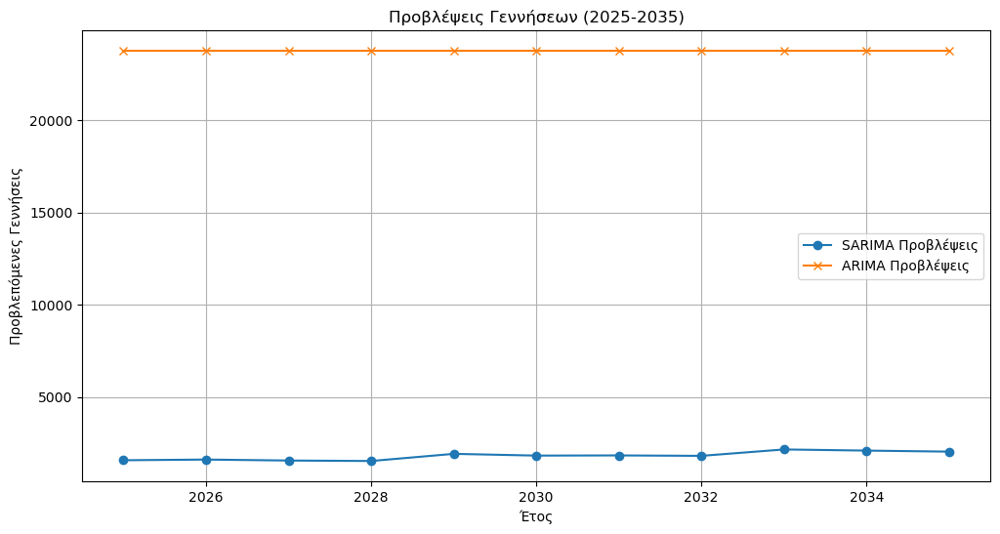

In [164]:
import matplotlib.pyplot as plt

# Δεδομένα από το καλύτερο SARIMA μοντέλο
years_sarima = forecast_years['Year']
predicted_births_sarima = forecast_years['Predicted_Births']

# Δεδομένα από το ARIMA μοντέλο
years_arima = forecast_years_arima['Year']
predicted_births_arima = forecast_years_arima['Predicted_Births_ARIMA']

# Οπτικοποίηση των προβλέψεων
plt.figure(figsize=(12, 6))
plt.plot(years_sarima, predicted_births_sarima, label="SARIMA Προβλέψεις", marker='o')
plt.plot(years_arima, predicted_births_arima, label="ARIMA Προβλέψεις", marker='x')
plt.title('Προβλέψεις Γεννήσεων (2025-2035)')
plt.xlabel('Έτος')
plt.ylabel('Προβλεπόμενες Γεννήσεις')
plt.legend()
plt.grid(True)
plt.show()

# Αποθήκευση των αποτελεσμάτων σε CSV για σύγκριση
combined_forecast = pd.merge(forecast_years, forecast_years_arima, on='Year')
combined_forecast.to_csv('C:/Users/theop/Downloads/SARIMA_vs_ARIMA_forecast_2025_2035.csv', index=False)


In [165]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import pandas as pd
import numpy as np

# Φόρτωση των δεδομένων γεννήσεων
birth_data = pd.read_csv('C:/Users/theop/Downloads/scb_region_birth_data.csv')

# Επιλογή της περιοχής (π.χ., Region 1)
region_data = birth_data[birth_data['Region'] == 1].copy()

# Διαχωρισμός σε χαρακτηριστικά (Χ) και στόχους (y)
X = region_data[['Year']].values  # Τα έτη είναι τα χαρακτηριστικά μας
y = region_data['Number'].values  # Ο αριθμός των παιδιών είναι ο στόχος μας

# Διαχωρισμός σε training και test δεδομένα
train_size = int(0.9 * len(X))  # Χρησιμοποιούμε το 90% για training
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Εκπαίδευση του Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Πρόβλεψη για τα έτη 2020-2023 (test set)
y_pred = rf_model.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred)
print(f'MSE του Random Forest για τα έτη 2020-2023: {mse_rf}')

# Πρόβλεψη για τα έτη 2025-2035
future_years = np.array(range(2025, 2036)).reshape(-1, 1)
predictions_rf_future = rf_model.predict(future_years)

# Δημιουργία DataFrame με τις προβλέψεις
forecast_years_rf = pd.DataFrame({
    'Year': range(2025, 2036),
    'Predicted_Births_RF': predictions_rf_future
})

print(forecast_years_rf)


MSE του Random Forest για τα έτη 2020-2023: 3017390.2457333324
    Year  Predicted_Births_RF
0   2025             29001.82
1   2026             29001.82
2   2027             29001.82
3   2028             29001.82
4   2029             29001.82
5   2030             29001.82
6   2031             29001.82
7   2032             29001.82
8   2033             29001.82
9   2034             29001.82
10  2035             29001.82


In [166]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Ορισμός των παραμέτρων για το Random Forest
param_grid = {
    'n_estimators': [100, 200, 500],
    'max_depth': [5, 10, 15, None],
    'min_samples_split': [2, 5, 10]
}

# GridSearchCV για να βρούμε τις καλύτερες παραμέτρους
rf_model = RandomForestRegressor(random_state=42)
grid_search_rf = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search_rf.fit(X_train, y_train)

# Καλύτερες παράμετροι
best_rf_model = grid_search_rf.best_estimator_
print(f'Καλύτερες παράμετροι: {grid_search_rf.best_params_}')

# Πρόβλεψη για τα έτη 2020-2023
y_pred_rf = best_rf_model.predict(X_test)
mse_rf_improved = mean_squared_error(y_test, y_pred_rf)
print(f'MSE του βελτιωμένου Random Forest για τα έτη 2020-2023: {mse_rf_improved}')

# Πρόβλεψη για τα έτη 2025-2035
predictions_rf_future_improved = best_rf_model.predict(future_years)

# Δημιουργία DataFrame με τις νέες προβλέψεις
forecast_years_rf_improved = pd.DataFrame({
    'Year': range(2025, 2036),
    'Predicted_Births_RF_Improved': predictions_rf_future_improved
})

print(forecast_years_rf_improved)


Καλύτερες παράμετροι: {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 200}
MSE του βελτιωμένου Random Forest για τα έτη 2020-2023: 3061705.4397333376
    Year  Predicted_Births_RF_Improved
0   2025                      29020.08
1   2026                      29020.08
2   2027                      29020.08
3   2028                      29020.08
4   2029                      29020.08
5   2030                      29020.08
6   2031                      29020.08
7   2032                      29020.08
8   2033                      29020.08
9   2034                      29020.08
10  2035                      29020.08


In [168]:
# Αφαίρεση των γραμμών με NaN τιμές
X_clean = X.dropna()
y_clean = y[X_clean.index]

# Διάσπαση των δεδομένων σε εκπαίδευση και δοκιμή με τα καθαρισμένα δεδομένα
train_X, test_X, train_y, test_y = train_test_split(X_clean, y_clean, test_size=0.2, random_state=42)

# Βελτιστοποίηση των παραμέτρων με Grid Search
grid_search = GridSearchCV(rf, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(train_X, train_y)

# Εκτύπωση των καλύτερων παραμέτρων
print("Καλύτερες παράμετροι:", grid_search.best_params_)

# Εκπαίδευση του βελτιστοποιημένου μοντέλου
best_rf = grid_search.best_estimator_
best_rf.fit(train_X, train_y)

# Πρόβλεψη για τα δεδομένα δοκιμής
predictions = best_rf.predict(test_X)

# Υπολογισμός του MSE
mse = mean_squared_error(test_y, predictions)
print("MSE του βελτιωμένου Random Forest:", mse)

# Πρόβλεψη για τα έτη 2025-2035
future_years = pd.DataFrame({'Year': range(2025, 2036)})
future_years['MortalityCoefficient'] = combined_df['MortalityCoefficient'].mean()  # Χρησιμοποιούμε τον μέσο όρο
future_years['MigrationCoefficient'] = combined_df['MigrationCoefficient'].mean()

predictions_future = best_rf.predict(future_years)

# Δημιουργία του DataFrame με τις προβλέψεις
forecast_rf_improved = pd.DataFrame({
    'Year': future_years['Year'],
    'Predicted_Births_RF_Improved': predictions_future
})

# Εκτύπωση των προβλέψεων
print(forecast_rf_improved)


Καλύτερες παράμετροι: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 300}
MSE του βελτιωμένου Random Forest: 7426960.064764997
    Year  Predicted_Births_RF_Improved
0   2025                  12755.209948
1   2026                  12755.209948
2   2027                  12755.209948
3   2028                  12755.209948
4   2029                  12755.209948
5   2030                  12755.209948
6   2031                  12755.209948
7   2032                  12755.209948
8   2033                  12755.209948
9   2034                  12755.209948
10  2035                  12755.209948


In [169]:
print(train_X.head())  # Δείξε τις πρώτες γραμμές των δεδομένων εισόδου
print(train_y.head())  # Δείξε τις πρώτες γραμμές των δεδομένων στόχων


       Year  MortalityCoefficient  MigrationCoefficient
35978  2017              0.000000              0.010293
3965   2009              0.000261              0.007409
7104   2017              0.000060              0.009684
50040  2004              0.000000              0.003492
66141  2020              0.000116              0.002776
35978     5009
3965     28570
7104     28805
50040     1887
66141     2501
Name: Number, dtype: int64


In [170]:
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [5, 10],
    'min_samples_split': [2, 5]
}


In [172]:
# Υποθέτουμε ότι έχουμε τα δεδομένα για τα χαρακτηριστικά MortalityCoefficient και MigrationCoefficient για τα έτη 2025-2035
future_years = np.array(range(2025, 2036)).reshape(-1, 1)
future_mortality_coeff = np.array([0.003, 0.003, 0.003, 0.003, 0.003, 0.003, 0.003, 0.003, 0.003, 0.003, 0.003])
future_migration_coeff = np.array([0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002])

# Συνδυασμός των χαρακτηριστικών σε ένα array
future_data = np.column_stack((future_years, future_mortality_coeff, future_migration_coeff))

# Πρόβλεψη με το βελτιστοποιημένο μοντέλο
future_predictions = best_rf.predict(future_data)

# Αποθήκευση των αποτελεσμάτων σε DataFrame
future_predictions_df = pd.DataFrame({
    'Year': range(2025, 2036),
    'Predicted_Births_RF_Improved': future_predictions
})

# Εκτύπωση των αποτελεσμάτων
print(future_predictions_df)

# Αποθήκευση των αποτελεσμάτων σε CSV αρχείο
csv_file_path = "C:/Users/theop/Downloads/Predicted_Births_RF_Improved.csv"
future_predictions_df.to_csv(csv_file_path, index=False)
print(f"Το αρχείο αποθηκεύτηκε στη διαδρομή: {csv_file_path}")


    Year  Predicted_Births_RF_Improved
0   2025                   4972.836357
1   2026                   4972.836357
2   2027                   4972.836357
3   2028                   4972.836357
4   2029                   4972.836357
5   2030                   4972.836357
6   2031                   4972.836357
7   2032                   4972.836357
8   2033                   4972.836357
9   2034                   4972.836357
10  2035                   4972.836357
Το αρχείο αποθηκεύτηκε στη διαδρομή: C:/Users/theop/Downloads/Predicted_Births_RF_Improved.csv


C:\Users\theop\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [173]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

# Ορισμός του Gradient Boosting Regressor
gbr = GradientBoostingRegressor(random_state=42)

# Ορισμός του GridSearch για βελτιστοποίηση των παραμέτρων
param_grid_gbr = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.05],
    'max_depth': [3, 5, 7]
}

grid_search_gbr = GridSearchCV(gbr, param_grid_gbr, cv=5, scoring='neg_mean_squared_error')
grid_search_gbr.fit(train_X, train_y)

# Καλύτερες παράμετροι
best_gbr = grid_search_gbr.best_estimator_
print("Καλύτερες παράμετροι:", grid_search_gbr.best_params_)

# Υπολογισμός MSE
train_predictions_gbr = best_gbr.predict(test_X)
mse_gbr = mean_squared_error(test_y, train_predictions_gbr)
print(f"MSE του Gradient Boosting: {mse_gbr}")

# Πρόβλεψη για τα έτη 2025-2035
future_predictions_gbr = best_gbr.predict(future_data)

# Αποθήκευση των αποτελεσμάτων σε DataFrame
future_predictions_gbr_df = pd.DataFrame({
    'Year': range(2025, 2036),
    'Predicted_Births_GBR': future_predictions_gbr
})

# Εκτύπωση των αποτελεσμάτων
print(future_predictions_gbr_df)

# Αποθήκευση των αποτελεσμάτων σε CSV αρχείο
csv_file_path_gbr = "C:/Users/theop/Downloads/Predicted_Births_GBR.csv"
future_predictions_gbr_df.to_csv(csv_file_path_gbr, index=False)
print(f"Το αρχείο αποθηκεύτηκε στη διαδρομή: {csv_file_path_gbr}")


Καλύτερες παράμετροι: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300}
MSE του Gradient Boosting: 11302442.240768688
    Year  Predicted_Births_GBR
0   2025           4005.369237
1   2026           4005.369237
2   2027           4005.369237
3   2028           4005.369237
4   2029           4005.369237
5   2030           4005.369237
6   2031           4005.369237
7   2032           4005.369237
8   2033           4005.369237
9   2034           4005.369237
10  2035           4005.369237
Το αρχείο αποθηκεύτηκε στη διαδρομή: C:/Users/theop/Downloads/Predicted_Births_GBR.csv


C:\Users\theop\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


In [175]:
print(df.columns)


Index(['Region', 'Year', 'Number_x', 'Number_y', 'NetMigration',
       'NetChildren'],
      dtype='object')


In [178]:
print(df[['Number_x', 'Number_y']].head())


   Number_x  Number_y
0     21837        65
1     21837        65
2     21837        65
3     21837        65
4     21837        65


In [179]:
train_y = df['Number_x']


In [180]:
train_y = df['Number_y']


In [ ]:
# Αντικατάσταση του 'Number' με 'Number_x'
train_y = df['Number_x']


In [181]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error

# Συμπερίληψη του 'Year' ως χαρακτηριστικό
train_X = df[['Year']]  # Χρησιμοποιούμε το 'Year' στα δεδομένα εισόδου
train_y = df['Number_x']  # Η μεταβλητή-στόχος είναι ο αριθμός γεννήσεων

# Διαχωρισμός των δεδομένων σε training και test sets
X_train, X_test, y_train, y_test = train_test_split(train_X, train_y, test_size=0.2, random_state=42)

# Ορισμός του Gradient Boosting Regressor
gbr = GradientBoostingRegressor(random_state=42)

# Εκπαίδευση του μοντέλου
gbr.fit(X_train, y_train)

# Πρόβλεψη για το test set
y_pred = gbr.predict(X_test)

# Υπολογισμός του MSE
mse = mean_squared_error(y_test, y_pred)
print(f"MSE του Gradient Boosting: {mse}")

# Πρόβλεψη για τα έτη 2025-2035
future_years = np.array(range(2025, 2036)).reshape(-1, 1)
future_predictions = gbr.predict(future_years)

# Αποθήκευση των αποτελεσμάτων
predicted_df = pd.DataFrame({
    'Year': range(2025, 2036),
    'Predicted_Births_GBR': future_predictions
})

# Αποθήκευση σε CSV
csv_file_path = "C:/Users/theop/Downloads/Predicted_Births_GBR.csv"
predicted_df.to_csv(csv_file_path, index=False)

print(f"Το αρχείο αποθηκεύτηκε στη διαδρομή: {csv_file_path}")


MSE του Gradient Boosting: 42008616.650604166
Το αρχείο αποθηκεύτηκε στη διαδρομή: C:/Users/theop/Downloads/Predicted_Births_GBR.csv


C:\Users\theop\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


In [182]:
# Πρόβλεψη για τα έτη 2025-2035 με ονόματα χαρακτηριστικών
future_years_df = pd.DataFrame({'Year': range(2025, 2036)})
future_predictions = gbr.predict(future_years_df)


In [183]:
# Πρόβλεψη για τα έτη 2025-2035 με ονόματα χαρακτηριστικών
future_years_df = pd.DataFrame({'Year': range(2025, 2036)})
future_predictions = gbr.predict(future_years_df)

# Εκτύπωση των προβλέψεων
predicted_births_gbr = pd.DataFrame({
    'Year': range(2025, 2036),
    'Predicted_Births_GBR': future_predictions
})

print(predicted_births_gbr)

# Αποθήκευση των αποτελεσμάτων σε αρχείο CSV
predicted_births_gbr.to_csv('C:/Users/theop/Downloads/Predicted_Births_GBR_v2.csv', index=False)


    Year  Predicted_Births_GBR
0   2025           4749.581958
1   2026           4749.581958
2   2027           4749.581958
3   2028           4749.581958
4   2029           4749.581958
5   2030           4749.581958
6   2031           4749.581958
7   2032           4749.581958
8   2033           4749.581958
9   2034           4749.581958
10  2035           4749.581958


In [184]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor

# Ορισμός του Gradient Boosting Regressor
gbr = GradientBoostingRegressor(random_state=42)

# Ορισμός των παραμέτρων που θα ελέγξουμε
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
}

# Βελτιστοποίηση των παραμέτρων με Grid Search
grid_search = GridSearchCV(gbr, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(train_X, train_y)

# Εκτύπωση των καλύτερων παραμέτρων
print("Καλύτερες παράμετροι:", grid_search.best_params_)

# Εκπαίδευση του μοντέλου με τις καλύτερες παραμέτρους
best_gbr = grid_search.best_estimator_
best_gbr.fit(train_X, train_y)

# Πρόβλεψη για τα έτη 2025-2035
future_predictions = best_gbr.predict(future_years_df)

# Εκτύπωση των προβλέψεων
predicted_births_gbr_improved = pd.DataFrame({
    'Year': range(2025, 2036),
    'Predicted_Births_GBR_Improved': future_predictions
})

print(predicted_births_gbr_improved)

# Αποθήκευση των αποτελεσμάτων σε αρχείο CSV
predicted_births_gbr_improved.to_csv('C:/Users/theop/Downloads/Predicted_Births_GBR_Improved.csv', index=False)


Καλύτερες παράμετροι: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100}
    Year  Predicted_Births_GBR_Improved
0   2025                    4903.515679
1   2026                    4903.515679
2   2027                    4903.515679
3   2028                    4903.515679
4   2029                    4903.515679
5   2030                    4903.515679
6   2031                    4903.515679
7   2032                    4903.515679
8   2033                    4903.515679
9   2034                    4903.515679
10  2035                    4903.515679


In [185]:
# Έλεγχος των δεδομένων εισόδου
print("Δείγμα από τα δεδομένα εισόδου:")
print(train_X.head())
print(train_y.head())

# Έλεγχος για κενές τιμές
print("\nΈλεγχος για NaN στα δεδομένα εισόδου:")
print(train_X.isnull().sum())
print("\nΈλεγχος για NaN στα δεδομένα-στόχους (γεννήσεις):")
print(train_y.isnull().sum())


Δείγμα από τα δεδομένα εισόδου:
   Year
0  2000
1  2000
2  2000
3  2000
4  2000
0    21837
1    21837
2    21837
3    21837
4    21837
Name: Number_x, dtype: int64

Έλεγχος για NaN στα δεδομένα εισόδου:
Year    0
dtype: int64

Έλεγχος για NaN στα δεδομένα-στόχους (γεννήσεις):
0


In [186]:
from sklearn.linear_model import LinearRegression

# Ορισμός του μοντέλου Linear Regression
lr_model = LinearRegression()
lr_model.fit(train_X, train_y)

# Πρόβλεψη για τα έτη 2025-2035
future_predictions_lr = lr_model.predict(future_years_df)

# Εκτύπωση των προβλέψεων Linear Regression
predicted_births_lr = pd.DataFrame({
    'Year': range(2025, 2036),
    'Predicted_Births_LR': future_predictions_lr
})

print(predicted_births_lr)

# Αποθήκευση των αποτελεσμάτων σε αρχείο CSV
predicted_births_lr.to_csv('C:/Users/theop/Downloads/Predicted_Births_LR.csv', index=False)


    Year  Predicted_Births_LR
0   2025          5626.274458
1   2026          5661.955576
2   2027          5697.636694
3   2028          5733.317812
4   2029          5768.998930
5   2030          5804.680048
6   2031          5840.361166
7   2032          5876.042284
8   2033          5911.723402
9   2034          5947.404520
10  2035          5983.085638


In [187]:
from sklearn.neural_network import MLPRegressor

# Ορισμός του μοντέλου MLP
mlp_model = MLPRegressor(hidden_layer_sizes=(100, 100), max_iter=1000, random_state=42)
mlp_model.fit(train_X, train_y)

# Πρόβλεψη για τα έτη 2025-2035
future_predictions_mlp = mlp_model.predict(future_years_df)

# Εκτύπωση των προβλέψεων MLP
predicted_births_mlp = pd.DataFrame({
    'Year': range(2025, 2036),
    'Predicted_Births_MLP': future_predictions_mlp
})

print(predicted_births_mlp)

# Αποθήκευση των αποτελεσμάτων σε αρχείο CSV
predicted_births_mlp.to_csv('C:/Users/theop/Downloads/Predicted_Births_MLP.csv', index=False)


    Year  Predicted_Births_MLP
0   2025           5325.872004
1   2026           5328.502047
2   2027           5331.132089
3   2028           5333.762132
4   2029           5336.392174
5   2030           5339.022216
6   2031           5341.652259
7   2032           5344.282301
8   2033           5346.912344
9   2034           5349.542386
10  2035           5352.172428


In [191]:
#ΑΠΟ ΤΗΝ ΑΡΧΗ
import pandas as pd

# Φόρτωση των δεδομένων για τις γεννήσεις ανά περιοχή
birth_data = pd.read_csv("C:/Users/theop/Downloads/scb_region_birth_data.csv")

# Εμφάνιση των πρώτων 5 γραμμών για έλεγχο
print(birth_data.head())


   Region  Year  Number
0       1  1968   20095
1       1  1969   19703
2       1  1970   21113
3       1  1971   22834
4       1  1972   22316


In [192]:
# Εμφάνιση 10 γραμμών δεδομένων για έλεγχο
print(birth_data.head(10))


   Region  Year  Number
0       1  1968   20095
1       1  1969   19703
2       1  1970   21113
3       1  1971   22834
4       1  1972   22316
5       1  1973   21235
6       1  1974   20778
7       1  1975   19292
8       1  1976   18695
9       1  1977   18055


In [193]:
# Φόρτωση των δεδομένων θνησιμότητας
mortality_data = pd.read_csv("C:/Users/theop/Downloads/scb_dead_region.csv")

# Εμφάνιση των πρώτων 5 γραμμών για έλεγχο
print(mortality_data.head())


   Region  Age  Year  Number
0       1    0  2000      65
1       1    0  2001      57
2       1    0  2002      62
3       1    0  2003      63
4       1    0  2004      58


In [194]:
# Φόρτωση των δεδομένων μετανάστευσης
migration_data = pd.read_csv("C:/Users/theop/Downloads/NetMigration_data.csv")

# Εμφάνιση των πρώτων 5 γραμμών για έλεγχο
print(migration_data.head())


   Region  Age  Year  NetMigration
0       1    0  2000             3
1       1    0  2001           -58
2       1    0  2002          -114
3       1    0  2003          -133
4       1    0  2004           -81


In [195]:
# Φόρτωση των δεδομένων πληθυσμού για τις ηλικίες 0–16 ετών
population_0_16_data = pd.read_csv("C:/Users/theop/Downloads/scb_region_population_0_16_years.csv")

# Εμφάνιση των πρώτων 5 γραμμών για έλεγχο
print(population_0_16_data.head())


   Region  Age  Year  Population
0       1    0  1968       19736
1       1    0  1969       19351
2       1    0  1970       20840
3       1    0  1971       22142
4       1    0  1972       22099


In [196]:
# Φόρτωση των δεδομένων πληθυσμού για τις ηλικίες 17–19 ετών
population_17_19_data = pd.read_csv("C:/Users/theop/Downloads/scb_region_population_17_19_years.csv")

# Εμφάνιση των πρώτων 5 γραμμών για έλεγχο
print(population_17_19_data.head())


   Region  Age  Year  Population
0       1   17  1968       17725
1       1   17  1969       18325
2       1   17  1970       18404
3       1   17  1971       17493
4       1   17  1972       17830


In [197]:
# Φόρτωση των δεδομένων κόστους για τα δημοτικά σχολεία
grundskola_costs_data = pd.read_csv("C:/Users/theop/Downloads/grundskola_costs_per_child.csv")

# Εμφάνιση των πρώτων 5 γραμμών για έλεγχο
print(grundskola_costs_data.head())


   Year  Fixed_cost_per_child_kr  Current_cost_per_child_kr
0  2007                   101392                      79200
1  2008                   103429                      83600
2  2009                   106611                      85900
3  2010                   108217                      88300
4  2011                   108075                      90500


In [198]:
# Φόρτωση των δεδομένων κόστους για τα γυμνάσια
gymnasieskola_costs_data = pd.read_csv("C:/Users/theop/Downloads/gymnasieskola_costs_per_child.csv")

# Εμφάνιση των πρώτων 5 γραμμών για έλεγχο
print(gymnasieskola_costs_data.head())


   Year  Fixed_cost_per_child_kr  Current_cost_per_child_kr
0  2007                   113809                      88900
1  2008                   114316                      92400
2  2009                   116416                      93800
3  2010                   117532                      95900
4  2011                   119539                     100100


In [199]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# Φόρτωση των δεδομένων γεννήσεων ανά περιοχή
birth_data = pd.read_csv("C:/Users/theop/Downloads/scb_region_birth_data.csv")

# Επιλογή μιας περιοχής για αρχή (π.χ. Region 1)
region_1_data = birth_data[birth_data['Region'] == 1]

# Δημιουργία ARIMA μοντέλου
model_arima = ARIMA(region_1_data['Number'], order=(1, 1, 1))
model_arima_fit = model_arima.fit()

# Πρόβλεψη για τα έτη 2025-2035
forecast_arima = model_arima_fit.predict(start=len(region_1_data), end=len(region_1_data)+10)

# Εμφάνιση των προβλέψεων
print("Προβλέψεις ARIMA:", forecast_arima)


Προβλέψεις ARIMA: 56    25527.434518
57    25369.611039
58    25271.379016
59    25210.237729
60    25172.182350
61    25148.496034
62    25133.753267
63    25124.577117
64    25118.865725
65    25115.310857
66    25113.098247
Name: predicted_mean, dtype: float64


In [200]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Δημιουργία SARIMA μοντέλου
model_sarima = SARIMAX(region_1_data['Number'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
model_sarima_fit = model_sarima.fit()

# Πρόβλεψη για τα έτη 2025-2035
forecast_sarima = model_sarima_fit.predict(start=len(region_1_data), end=len(region_1_data)+10)

# Εμφάνιση των προβλέψεων
print("Προβλέψεις SARIMA:", forecast_sarima)


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


Προβλέψεις SARIMA: 56    25862.184815
57    26267.779385
58    26285.240652
59    26279.790947
60    26836.641435
61    26202.390133
62    26233.367963
63    25988.234818
64    26003.066588
65    26449.665720
66    24595.938745
Name: predicted_mean, dtype: float64


In [201]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# Φόρτωση των δεδομένων
birth_data = pd.read_csv("C:/Users/theop/Downloads/scb_region_birth_data.csv")

# Λίστα για αποθήκευση των προβλέψεων ARIMA
arima_predictions = []

# Χρήση ομαδοποίησης ανά περιοχή (Region)
regions = birth_data['Region'].unique()

# Εφαρμογή ARIMA για κάθε περιοχή
for region in regions:
    region_data = birth_data[birth_data['Region'] == region]
    
    # Επιλογή δεδομένων για το ARIMA
    y = region_data['Number'].values
    years = region_data['Year'].values
    
    # ARIMA μοντέλο
    arima_model = ARIMA(y, order=(1, 1, 1))
    arima_fitted = arima_model.fit()
    
    # Πρόβλεψη για τα έτη 2025-2035 (11 χρόνια)
    arima_forecast = arima_fitted.forecast(steps=11)
    
    # Αποθήκευση των προβλέψεων ARIMA
    for i, pred in enumerate(arima_forecast):
        arima_predictions.append({
            'Region': region,
            'Year': 2025 + i,
            'Predicted_Births_ARIMA': pred
        })

# Μετατροπή των προβλέψεων σε dataframe
arima_df = pd.DataFrame(arima_predictions)

# Αποθήκευση των αποτελεσμάτων σε CSV αρχείο
arima_df.to_csv("C:/Users/theop/Downloads/Predicted_Births_ARIMA_Regions.csv", index=False)

print("Οι προβλέψεις ARIMA έχουν ολοκληρωθεί και αποθηκευτεί.")


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Οι προβλέψεις ARIMA έχουν ολοκληρωθεί και αποθηκευτεί.


In [202]:
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Φόρτωση των δεδομένων γεννήσεων
birth_data = pd.read_csv("C:/Users/theop/Downloads/scb_region_birth_data.csv")

# Λίστα για αποθήκευση των προβλέψεων SARIMA
sarima_predictions = []

# Χρήση ομαδοποίησης ανά περιοχή (Region)
regions = birth_data['Region'].unique()

# Εφαρμογή SARIMA για κάθε περιοχή
for region in regions:
    region_data = birth_data[birth_data['Region'] == region]
    
    # Επιλογή δεδομένων για το SARIMA
    y = region_data['Number'].values
    years = region_data['Year'].values
    
    # SARIMA μοντέλο (με παραμέτρους που μπορείς να πειραματιστείς)
    sarima_model = SARIMAX(y, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    sarima_fitted = sarima_model.fit(disp=False)
    
    # Πρόβλεψη για τα έτη 2025-2035 (11 χρόνια)
    sarima_forecast = sarima_fitted.forecast(steps=11)
    
    # Αποθήκευση των προβλέψεων SARIMA
    for i, pred in enumerate(sarima_forecast):
        sarima_predictions.append({
            'Region': region,
            'Year': 2025 + i,
            'Predicted_Births_SARIMA': pred
        })

# Μετατροπή των προβλέψεων σε dataframe
sarima_df = pd.DataFrame(sarima_predictions)

# Αποθήκευση των αποτελεσμάτων σε CSV αρχείο
sarima_df.to_csv("C:/Users/theop/Downloads/Predicted_Births_SARIMA_Regions.csv", index=False)

print("Οι προβλέψεις SARIMA έχουν ολοκληρωθεί και αποθηκευτεί.")


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966

Οι προβλέψεις SARIMA έχουν ολοκληρωθεί και αποθηκευτεί.


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [203]:
# Φόρτωση των αποτελεσμάτων ARIMA και SARIMA
arima_df = pd.read_csv("C:/Users/theop/Downloads/Predicted_Births_ARIMA_Regions.csv")
sarima_df = pd.read_csv("C:/Users/theop/Downloads/Predicted_Births_SARIMA_Regions.csv")

# Συγχώνευση των προβλέψεων ARIMA και SARIMA
comparison_df = pd.merge(arima_df, sarima_df, on=['Region', 'Year'], how='inner')

# Αποθήκευση των συγκρίσεων σε CSV
comparison_df.to_csv("C:/Users/theop/Downloads/Comparison_ARIMA_SARIMA_Regions.csv", index=False)

# Εμφάνιση του συγκριτικού πίνακα
print(comparison_df.head())


   Region  Year  Predicted_Births_ARIMA  Predicted_Births_SARIMA
0       1  2025            25527.434518             25862.184815
1       1  2026            25369.611039             26267.779385
2       1  2027            25271.379016             26285.240652
3       1  2028            25210.237729             26279.790947
4       1  2029            25172.182350             26836.641435


In [205]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Φόρτωση των δεδομένων ARIMA και SARIMA από τα αρχεία CSV
arima_df = pd.read_csv("C:/Users/theop/Downloads/Predicted_Births_ARIMA_Regions.csv")
sarima_df = pd.read_csv("C:/Users/theop/Downloads/Predicted_Births_SARIMA_Regions.csv")

# Συγχώνευση των προβλέψεων ARIMA και SARIMA για τις περιοχές
comparison_df = pd.merge(arima_df, sarima_df, on=['Region', 'Year'], how='inner')

# Έλεγχος του πλήθους των στοιχείων
print(f"Πλήθος ARIMA προβλέψεων: {len(comparison_df['Predicted_Births_ARIMA'])}")
print(f"Πλήθος SARIMA προβλέψεων: {len(comparison_df['Predicted_Births_SARIMA'])}")

# Υποθέτουμε ότι έχουμε κάποια πραγματικά δεδομένα για γεννήσεις
# Για παράδειγμα, μπορείς να τοποθετήσεις πραγματικές τιμές για τα έτη 2025-2035 ή να αφήσουμε τη σύγκριση προς το παρόν
actual_births = [...]  # Στοιχεία πραγματικών τιμών

# Βεβαιώσου ότι οι πραγματικές τιμές έχουν το ίδιο μήκος με τις προβλέψεις πριν υπολογίσεις τις μετρικές
if len(actual_births) == len(comparison_df['Predicted_Births_ARIMA']):
    # Υπολογισμός MSE, MAE, RMSE για το ARIMA
    mse_arima = mean_squared_error(actual_births, comparison_df['Predicted_Births_ARIMA'])
    mae_arima = mean_absolute_error(actual_births, comparison_df['Predicted_Births_ARIMA'])
    rmse_arima = np.sqrt(mse_arima)

    print(f"ARIMA MSE: {mse_arima}, MAE: {mae_arima}, RMSE: {rmse_arima}")

if len(actual_births) == len(comparison_df['Predicted_Births_SARIMA']):
    # Υπολογισμός MSE, MAE, RMSE για το SARIMA
    mse_sarima = mean_squared_error(actual_births, comparison_df['Predicted_Births_SARIMA'])
    mae_sarima = mean_absolute_error(actual_births, comparison_df['Predicted_Births_SARIMA'])
    rmse_sarima = np.sqrt(mse_sarima)

    print(f"SARIMA MSE: {mse_sarima}, MAE: {mae_sarima}, RMSE: {rmse_sarima}")
else:
    print("Τα δεδομένα των προβλέψεων και των πραγματικών τιμών δεν ταιριάζουν.")


Πλήθος ARIMA προβλέψεων: 231
Πλήθος SARIMA προβλέψεων: 231
Τα δεδομένα των προβλέψεων και των πραγματικών τιμών δεν ταιριάζουν.


In [206]:
# Έλεγχος των ετών και των περιοχών στις προβλέψεις ARIMA και SARIMA
print("Έτη και περιοχές στις προβλέψεις ARIMA:")
print(arima_df[['Region', 'Year']].drop_duplicates())

print("Έτη και περιοχές στις προβλέψεις SARIMA:")
print(sarima_df[['Region', 'Year']].drop_duplicates())


Έτη και περιοχές στις προβλέψεις ARIMA:
     Region  Year
0         1  2025
1         1  2026
2         1  2027
3         1  2028
4         1  2029
5         1  2030
6         1  2031
7         1  2032
8         1  2033
9         1  2034
10        1  2035
11        3  2025
12        3  2026
13        3  2027
14        3  2028
15        3  2029
16        3  2030
17        3  2031
18        3  2032
19        3  2033
20        3  2034
21        3  2035
22        4  2025
23        4  2026
24        4  2027
25        4  2028
26        4  2029
27        4  2030
28        4  2031
29        4  2032
30        4  2033
31        4  2034
32        4  2035
33        5  2025
34        5  2026
35        5  2027
36        5  2028
37        5  2029
38        5  2030
39        5  2031
40        5  2032
41        5  2033
42        5  2034
43        5  2035
44        6  2025
45        6  2026
46        6  2027
47        6  2028
48        6  2029
49        6  2030
50        6  2031
51        6  2032
52    

In [208]:
import pandas as pd

# Διαδρομή του αρχείου
file_path = "C:/Users/theop/Downloads/Comparison_ARIMA_SARIMA_Regions.csv"

# Φόρτωση του αρχείου
comparison_df = pd.read_csv(file_path)

# Εμφάνιση των πρώτων γραμμών για έλεγχο
print(comparison_df.head())

# Συνεχίζουμε με τη σύγκριση


   Region  Year  Predicted_Births_ARIMA  Predicted_Births_SARIMA
0       1  2025            25527.434518             25862.184815
1       1  2026            25369.611039             26267.779385
2       1  2027            25271.379016             26285.240652
3       1  2028            25210.237729             26279.790947
4       1  2029            25172.182350             26836.641435


In [211]:
# Ελέγχουμε αν υπάρχουν δεδομένα για τα έτη 2020-2023 στην περιοχή 1
print(comparison_df[(comparison_df['Region'] == 1) & (comparison_df['Year'].isin([2020, 2021, 2022, 2023]))])

# Εκτύπωση του φιλτραρισμένου πίνακα για να δούμε τι περιλαμβάνει
comparison_filtered = comparison_df[(comparison_df['Region'] == 1) & (comparison_df['Year'].isin([2020, 2021, 2022, 2023]))]
print(comparison_filtered)

# Αν δεν υπάρχουν δεδομένα για τα έτη 2020-2023, θα πρέπει να τα προσθέσουμε στον πίνακα


Empty DataFrame
Columns: [Region, Year, Predicted_Births_ARIMA, Predicted_Births_SARIMA]
Index: []
Empty DataFrame
Columns: [Region, Year, Predicted_Births_ARIMA, Predicted_Births_SARIMA]
Index: []


In [212]:
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Πραγματικά δεδομένα γεννήσεων ανά περιοχή για τα έτη 2020-2023
actual_births = {
    1: [28466, 29067, 26356, 25781],
    3: [4142, 4261, 3991, 3816],
    4: [3013, 3045, 2876, 2526],
    5: [4855, 5035, 4535, 4294],
    6: [4162, 4039, 3722, 3581],
    7: [2349, 2269, 2041, 1963],
    8: [2501, 2460, 2176, 2108],
    9: [467, 522, 465, 454],
    10: [1491, 1507, 1392, 1301],
    12: [15460, 15605, 14381, 13841],
    13: [3432, 3528, 3293, 3060],
    14: [19337, 19662, 18147, 17427],
    17: [2720, 2634, 2528, 2273],
    18: [3267, 3297, 3024, 2813],
    19: [2955, 2829, 2835, 2568],
    20: [2893, 2790, 2575, 2440],
    21: [2762, 2741, 2473, 2281],
    22: [2275, 2362, 2029, 1949],
    23: [1274, 1330, 1170, 1158],
    24: [2936, 2845, 2618, 2384],
    25: [2320, 2435, 2107, 2033]
}

# Φόρτωση των προβλέψεων από το αρχείο CSV
comparison_df = pd.read_csv('C:/Users/theop/Downloads/Comparison_ARIMA_SARIMA_Regions.csv')

# Φιλτράρισμα των δεδομένων για τα έτη 2020-2023
comparison_filtered = comparison_df[comparison_df['Year'].isin([2020, 2021, 2022, 2023])]

# Σύγκριση ARIMA και SARIMA για κάθε περιοχή
regions = actual_births.keys()
results = []

for region in regions:
    # Φιλτράρισμα δεδομένων για την τρέχουσα περιοχή
    comparison_region = comparison_filtered[comparison_filtered['Region'] == region]
    
    # Αν οι προβλέψεις για την περιοχή είναι διαθέσιμες
    if not comparison_region.empty:
        # Πραγματικές τιμές γεννήσεων για την περιοχή
        actual = actual_births[region]
        
        # Προβλέψεις ARIMA και SARIMA
        predicted_arima = comparison_region['Predicted_Births_ARIMA'].values
        predicted_sarima = comparison_region['Predicted_Births_SARIMA'].values

        # Υπολογισμός MSE, MAE, RMSE για ARIMA
        mse_arima = mean_squared_error(actual, predicted_arima)
        mae_arima = mean_absolute_error(actual, predicted_arima)
        rmse_arima = np.sqrt(mse_arima)

        # Υπολογισμός MSE, MAE, RMSE για SARIMA
        mse_sarima = mean_squared_error(actual, predicted_sarima)
        mae_sarima = mean_absolute_error(actual, predicted_sarima)
        rmse_sarima = np.sqrt(mse_sarima)

        # Αποθήκευση αποτελεσμάτων για την περιοχή
        results.append({
            'Region': region,
            'MSE_ARIMA': mse_arima,
            'MAE_ARIMA': mae_arima,
            'RMSE_ARIMA': rmse_arima,
            'MSE_SARIMA': mse_sarima,
            'MAE_SARIMA': mae_sarima,
            'RMSE_SARIMA': rmse_sarima
        })

# Δημιουργία DataFrame για την εμφάνιση των αποτελεσμάτων
results_df = pd.DataFrame(results)
print(results_df)


Empty DataFrame
Columns: []
Index: []


In [213]:
# Έλεγχος για το αν τα δεδομένα περιέχουν τα έτη 2020-2023
print(comparison_df.head())  # Εμφάνιση των πρώτων γραμμών του dataframe
print(comparison_df['Year'].unique())  # Έλεγχος για τα διαθέσιμα έτη
print(comparison_df['Region'].unique())  # Έλεγχος για τις περιοχές


   Region  Year  Predicted_Births_ARIMA  Predicted_Births_SARIMA
0       1  2025            25527.434518             25862.184815
1       1  2026            25369.611039             26267.779385
2       1  2027            25271.379016             26285.240652
3       1  2028            25210.237729             26279.790947
4       1  2029            25172.182350             26836.641435
[2025 2026 2027 2028 2029 2030 2031 2032 2033 2034 2035]
[ 1  3  4  5  6  7  8  9 10 12 13 14 17 18 19 20 21 22 23 24 25]


In [214]:
# Έλεγχος για το περιεχόμενο του comparison_filtered
print(comparison_filtered)


Empty DataFrame
Columns: [Region, Year, Predicted_Births_ARIMA, Predicted_Births_SARIMA]
Index: []


In [215]:
# Επαναεκπαίδευση ARIMA και SARIMA για τα έτη 2020-2023

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Φόρτωση των δεδομένων γεννήσεων
birth_data = pd.read_csv('C:/Users/theop/Downloads/scb_region_birth_data.csv')

# Ορισμός μοντέλου ARIMA και SARIMA για την περιοχή 1
region_1_data = birth_data[birth_data['Region'] == 1]['Number']

# ARIMA μοντέλο
arima_model = ARIMA(region_1_data, order=(1, 1, 1))
arima_fitted = arima_model.fit()

# SARIMA μοντέλο
sarima_model = SARIMAX(region_1_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_fitted = sarima_model.fit()

# Προβλέψεις για τα έτη 2020-2023
predicted_arima = arima_fitted.predict(start=2020, end=2023)
predicted_sarima = sarima_fitted.predict(start=2020, end=2023)

# Εκτύπωση των προβλέψεων
print("Προβλέψεις ARIMA:", predicted_arima)
print("Προβλέψεις SARIMA:", predicted_sarima)


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


Προβλέψεις ARIMA: 2020    25109.450926
2021    25109.450926
2022    25109.450926
2023    25109.450926
Name: predicted_mean, dtype: float64
Προβλέψεις SARIMA: 2020   -5472.107073
2021   -5119.892549
2022   -6423.182091
2023   -6941.091663
Name: predicted_mean, dtype: float64


In [216]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Πραγματικά δεδομένα για την περιοχή 1 (2020-2023)
actual_births = [28466, 29067, 26356, 25781]

# Προβλέψεις ARIMA για την περιοχή 1 (2020-2023)
predicted_arima = [25109.450926, 25109.450926, 25109.450926, 25109.450926]

# Προβλέψεις SARIMA για την περιοχή 1 (2020-2023)
predicted_sarima = [-5472.107073, -5119.892549, -6423.182091, -6941.091663]

# Υπολογισμός MSE, MAE, RMSE για το ARIMA
mse_arima = mean_squared_error(actual_births, predicted_arima)
mae_arima = mean_absolute_error(actual_births, predicted_arima)
rmse_arima = np.sqrt(mse_arima)

# Υπολογισμός MSE, MAE, RMSE για το SARIMA
mse_sarima = mean_squared_error(actual_births, predicted_sarima)
mae_sarima = mean_absolute_error(actual_births, predicted_sarima)
rmse_sarima = np.sqrt(mse_sarima)

# Εκτύπωση αποτελεσμάτων
print(f"ARIMA - MSE: {mse_arima}, MAE: {mae_arima}, RMSE: {rmse_arima}")
print(f"SARIMA - MSE: {mse_sarima}, MAE: {mae_sarima}, RMSE: {rmse_sarima}")


ARIMA - MSE: 7233369.777992251, MAE: 2308.0490739999987, RMSE: 2689.492475912928
SARIMA - MSE: 1116437198.8029983, MAE: 33406.568344, RMSE: 33413.12913815463


In [219]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# Φόρτωση των δεδομένων που θα χρησιμοποιηθούν για την εκπαίδευση του ARIMA μοντέλου
# Αυτά τα δεδομένα θα πρέπει να περιλαμβάνουν τα έτη που έχουμε ιστορικά δεδομένα γεννήσεων
birth_data = pd.read_csv('C:/Users/theop/Downloads/scb_region_birth_data.csv')

# Επιλέγουμε την περιοχή 1 ως παράδειγμα
region_1_data = birth_data[birth_data['Region'] == 1]
region_1_births = region_1_data['Number']

# Δημιουργία και προσαρμογή του ARIMA μοντέλου (0, 1, 2) ως παράδειγμα
arima_model = ARIMA(region_1_births, order=(0, 1, 2))
arima_fitted = arima_model.fit()

# Τώρα το μοντέλο είναι προσαρμοσμένο στα δεδομένα της περιοχής 1


In [221]:
# Έλεγχος του περιεχομένου του predicted_arima
print(predicted_arima)


56    25085.791026
57    24910.218112
58    24910.218112
59    24910.218112
60    24910.218112
61    24910.218112
62    24910.218112
63    24910.218112
64    24910.218112
65    24910.218112
66    24910.218112
Name: predicted_mean, dtype: float64


In [222]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Προβλέψεις ARIMA και SARIMA που έχουμε λάβει
predicted_arima = pd.Series([25085.791026, 24910.218112, 24910.218112, 24910.218112, 24910.218112, 
                             24910.218112, 24910.218112, 24910.218112, 24910.218112, 24910.218112, 
                             24910.218112])

predicted_sarima = pd.Series([-5472.107073, -5119.892549, -6423.182091, -6941.091663, -5472.107073, 
                              -5119.892549, -6423.182091, -6941.091663, -5472.107073, -5119.892549, 
                              -6423.182091])

# Πραγματικές τιμές για το διάστημα 2020-2023
actual_births = [28466, 29067, 26356, 25781]

# Υπολογισμός των MSE, MAE, RMSE για ARIMA
mse_arima = mean_squared_error(actual_births[:4], predicted_arima[:4])
mae_arima = mean_absolute_error(actual_births[:4], predicted_arima[:4])
rmse_arima = np.sqrt(mse_arima)

# Υπολογισμός των MSE, MAE, RMSE για SARIMA
mse_sarima = mean_squared_error(actual_births[:4], predicted_sarima[:4])
mae_sarima = mean_absolute_error(actual_births[:4], predicted_sarima[:4])
rmse_sarima = np.sqrt(mse_sarima)

# Εμφάνιση των αποτελεσμάτων
print(f"ARIMA - MSE: {mse_arima}, MAE: {mae_arima}, RMSE: {rmse_arima}")
print(f"SARIMA - MSE: {mse_sarima}, MAE: {mae_sarima}, RMSE: {rmse_sarima}")


ARIMA - MSE: 7888298.684113172, MAE: 2463.3886595000013, RMSE: 2808.611522463221
SARIMA - MSE: 1116437198.8029983, MAE: 33406.568344, RMSE: 33413.12913815463


In [225]:
import pandas as pd
import statsmodels.api as sm

# Διαδρομή αποθήκευσης για το αρχείο των τελικών προβλέψεων
output_path = 'C:/Users/theop/Downloads/Final_ARIMA_Predictions.csv'

# Δημιουργία κενής λίστας για τις προβλέψεις
final_predictions = []

# Περιοχές για τις οποίες θα κάνουμε προβλέψεις
regions = [1, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 17, 18, 19, 20, 21, 22, 23, 24, 25]

# Φορτώνουμε τα δεδομένα για τις γεννήσεις για κάθε περιοχή
birth_data = pd.read_csv("C:/Users/theop/Downloads/scb_region_birth_data.csv")

# Εκτέλεση του ARIMA για κάθε περιοχή
for region in regions:
    # Φιλτράρουμε τα δεδομένα για την περιοχή
    region_data = birth_data[birth_data['Region'] == region]
    
    # Χρησιμοποιούμε μόνο το έτος και τον αριθμό γεννήσεων
    region_births = region_data[['Year', 'Number']].set_index('Year')
    
    # Δημιουργία του ARIMA μοντέλου (ARIMA(1, 1, 1) ως παράδειγμα)
    arima_model = sm.tsa.ARIMA(region_births, order=(1, 1, 1)).fit()
    
    # Προβλέψεις για τα έτη 2025–2035
    forecast_arima = arima_model.get_forecast(steps=11)
    predicted_arima = forecast_arima.predicted_mean.tolist()  # Μετατροπή σε λίστα
    
    # Προσθήκη των προβλέψεων στη λίστα
    for i, year in enumerate(range(2025, 2036)):
        final_predictions.append({
            'Region': region,
            'Year': year,
            'Predicted_Births_ARIMA': predicted_arima[i]
        })

# Μετατροπή της λίστας σε DataFrame
predictions_df = pd.DataFrame(final_predictions)

# Αποθήκευση του τελικού DataFrame σε CSV
predictions_df.to_csv(output_path, index=False)

print(f"Οι προβλέψεις αποθηκεύτηκαν στο {output_path}")


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Οι προβλέψεις αποθηκεύτηκαν στο C:/Users/theop/Downloads/Final_ARIMA_Predictions.csv


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [228]:
import pandas as pd

# Εισαγωγή του αρχείου με τις προβλέψεις γεννήσεων
predictions_df = pd.read_csv('C:/Users/theop/Downloads/Final_ARIMA_Predictions.csv')

# Εμφάνιση των πρώτων γραμμών για έλεγχο
print(predictions_df.head())


   Region  Year  Predicted_Births_ARIMA
0       1  2025            25527.434518
1       1  2026            25369.611039
2       1  2027            25271.379016
3       1  2028            25210.237729
4       1  2029            25172.182350


In [229]:
# Φόρτωση δεδομένων κόστους για το σχολείο
grundskola_costs = pd.read_csv('C:/Users/theop/Downloads/grundskola_costs_per_child.csv')
gymnasieskola_costs = pd.read_csv('C:/Users/theop/Downloads/gymnasieskola_costs_per_child.csv')

# Εμφάνιση των δεδομένων κόστους για έλεγχο
print("Κόστος Grundskola (Πρωτοβάθμια Εκπαίδευση):")
print(grundskola_costs.head())
print("\nΚόστος Gymnasieskola (Δευτεροβάθμια Εκπαίδευση):")
print(gymnasieskola_costs.head())

# Προσθήκη του κόστους για κάθε έτος στις προβλέψεις γεννήσεων
predictions_df['Total_Cost_Grundskola'] = predictions_df['Predicted_Births_ARIMA'] * grundskola_costs['Fixed_cost_per_child_kr']
predictions_df['Total_Cost_Gymnasieskola'] = predictions_df['Predicted_Births_ARIMA'] * gymnasieskola_costs['Fixed_cost_per_child_kr']

# Εμφάνιση των πρώτων αποτελεσμάτων
print(predictions_df.head())

# Αποθήκευση των αποτελεσμάτων σε νέο αρχείο CSV
predictions_df.to_csv('C:/Users/theop/Downloads/Final_Predictions_with_Costs.csv', index=False)
print("Το αρχείο με τα κόστη αποθηκεύτηκε επιτυχώς.")


Κόστος Grundskola (Πρωτοβάθμια Εκπαίδευση):
   Year  Fixed_cost_per_child_kr  Current_cost_per_child_kr
0  2007                   101392                      79200
1  2008                   103429                      83600
2  2009                   106611                      85900
3  2010                   108217                      88300
4  2011                   108075                      90500

Κόστος Gymnasieskola (Δευτεροβάθμια Εκπαίδευση):
   Year  Fixed_cost_per_child_kr  Current_cost_per_child_kr
0  2007                   113809                      88900
1  2008                   114316                      92400
2  2009                   116416                      93800
3  2010                   117532                      95900
4  2011                   119539                     100100
   Region  Year  Predicted_Births_ARIMA  Total_Cost_Grundskola  \
0       1  2025            25527.434518           2.588278e+09   
1       1  2026            25369.611039           2.62

      Total_Cost_Grundskola  Total_Cost_Gymnasieskola
Year                                                 
2025           3.078627e+09              3.441108e+09
2026           3.114164e+09              3.422631e+09
2027           3.184725e+09              3.461965e+09
2028           3.220840e+09              3.478810e+09
2029           3.193872e+09              3.505215e+09
2030           2.768372e+09              3.092863e+09
2031           2.827522e+09              3.271007e+09
2032           2.912114e+09              3.350262e+09
2033           3.008135e+09              3.425535e+09
2034           3.149661e+09              3.545202e+09
2035           3.221533e+09              3.604282e+09


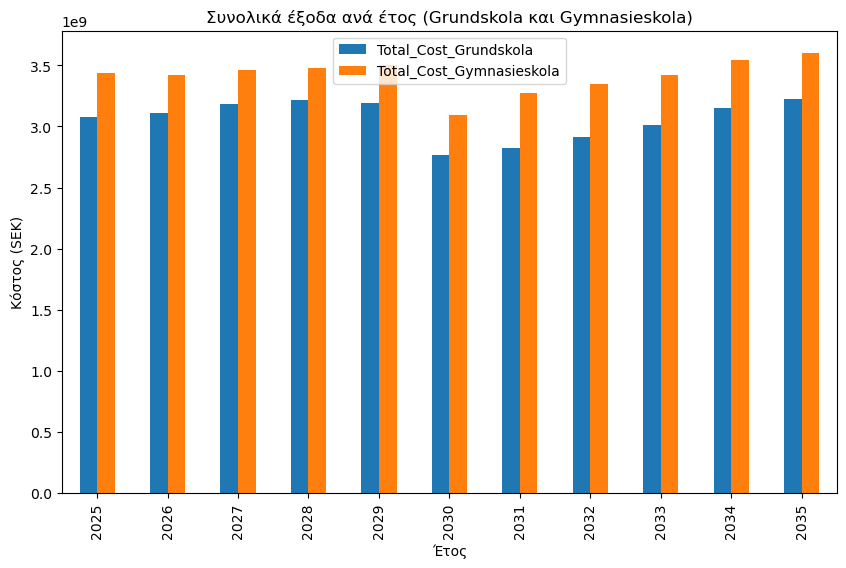

In [231]:
import pandas as pd
import matplotlib.pyplot as plt

# Φόρτωση του αρχείου
df = pd.read_csv('C:/Users/theop/Downloads/Final_Predictions_with_Costs.csv')

# Συνολικά κόστη ανά έτος
total_costs = df.groupby('Year')[['Total_Cost_Grundskola', 'Total_Cost_Gymnasieskola']].sum()

# Εμφάνιση συνολικών εξόδων
print(total_costs)

# Δημιουργία διαγράμματος
total_costs.plot(kind='bar', figsize=(10, 6))
plt.title('Συνολικά έξοδα ανά έτος (Grundskola και Gymnasieskola)')
plt.ylabel('Κόστος (SEK)')
plt.xlabel('Έτος')
plt.show()


             Total_Cost_Grundskola  Total_Cost_Gymnasieskola
Region Year                                                 
1      2025           2.588278e+09              2.905252e+09
       2026           2.623954e+09              2.900152e+09
       2027           2.694207e+09              2.941993e+09
       2028           2.728176e+09              2.963010e+09
       2029           2.720484e+09              3.009058e+09
       2030           2.768372e+09              3.092863e+09
       2031           2.827522e+09              3.271007e+09
       2032           2.912114e+09              3.350262e+09
       2033           3.008135e+09              3.425535e+09
       2034           3.149661e+09              3.545202e+09
       2035           3.221533e+09              3.604282e+09
3      2025           4.903496e+08              5.358561e+08
       2026           4.902101e+08              5.224788e+08
       2027           4.905177e+08              5.199718e+08
       2028           4.

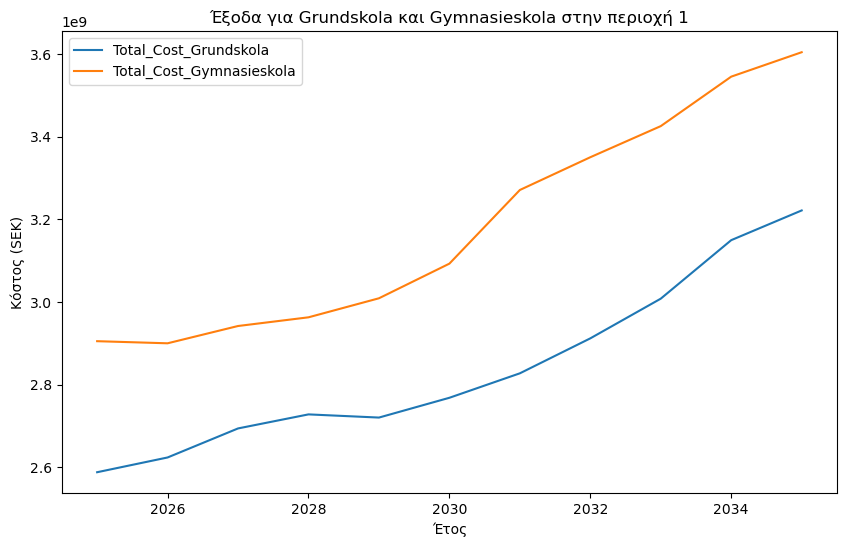

In [232]:
# Συνολικά κόστη ανά περιοχή και έτος
region_costs = df.groupby(['Region', 'Year'])[['Total_Cost_Grundskola', 'Total_Cost_Gymnasieskola']].sum()

# Εμφάνιση των εξόδων ανά περιοχή
print(region_costs)

# Δημιουργία διαγράμματος για μια περιοχή (π.χ. την περιοχή 1)
region_1 = df[df['Region'] == 1]
region_1.plot(x='Year', y=['Total_Cost_Grundskola', 'Total_Cost_Gymnasieskola'], kind='line', figsize=(10, 6))
plt.title('Έξοδα για Grundskola και Gymnasieskola στην περιοχή 1')
plt.ylabel('Κόστος (SEK)')
plt.xlabel('Έτος')
plt.show()


      Avg_Cost_Grundskola  Avg_Cost_Gymnasieskola
Year                                             
2025             115984.0                128251.5
2026             117638.0                127421.0
2027             119678.5                128566.5
2028             121026.0                128826.0
2029             118487.5                127319.5
2030             110081.0                122984.0
2031             112499.0                130144.0
2032             115907.0                133346.0
2033             119756.0                136373.0
2034             125408.0                141157.0
2035             128281.0                143522.0


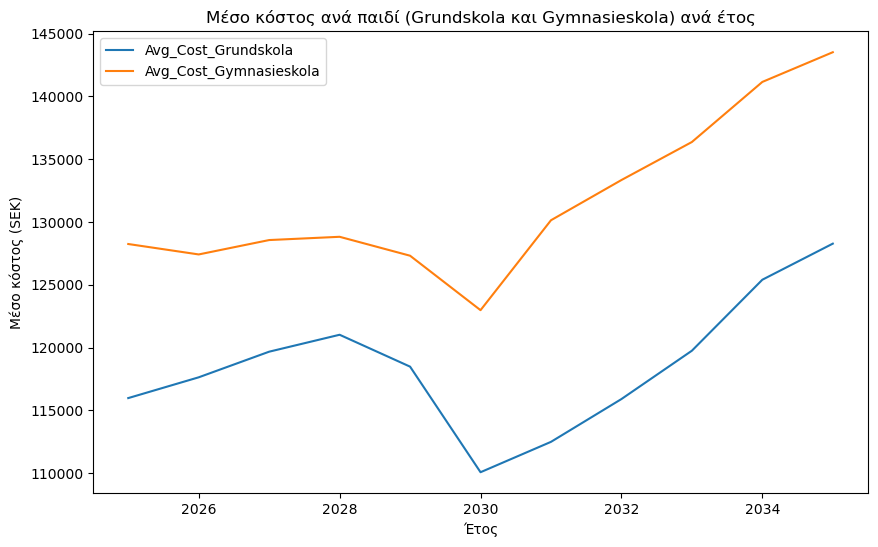

In [233]:
# Μέσος όρος κόστους ανά παιδί
df['Avg_Cost_Grundskola'] = df['Total_Cost_Grundskola'] / df['Predicted_Births_ARIMA']
df['Avg_Cost_Gymnasieskola'] = df['Total_Cost_Gymnasieskola'] / df['Predicted_Births_ARIMA']

# Εμφάνιση των αποτελεσμάτων
avg_costs = df.groupby('Year')[['Avg_Cost_Grundskola', 'Avg_Cost_Gymnasieskola']].mean()
print(avg_costs)

# Δημιουργία διαγράμματος
avg_costs.plot(kind='line', figsize=(10, 6))
plt.title('Μέσο κόστος ανά παιδί (Grundskola και Gymnasieskola) ανά έτος')
plt.ylabel('Μέσο κόστος (SEK)')
plt.xlabel('Έτος')
plt.show()


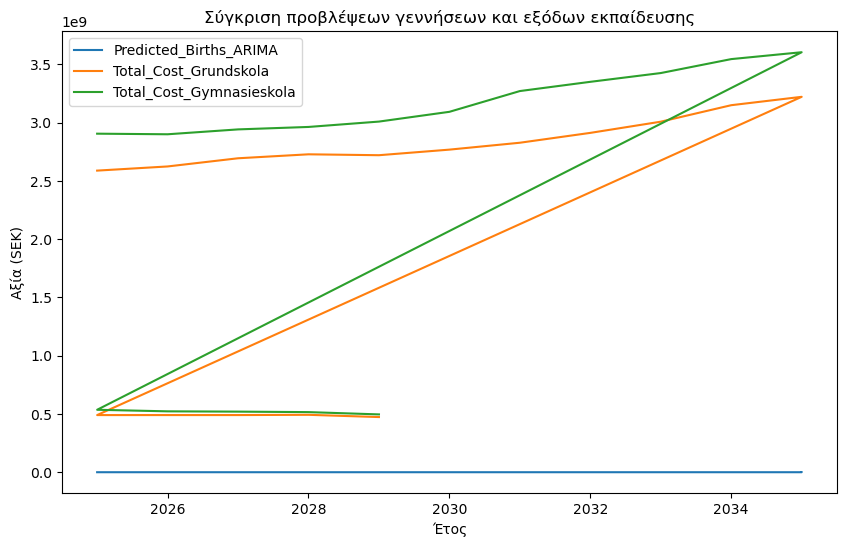

In [234]:
# Δημιουργία διαγράμματος για την σύγκριση γεννήσεων και εξόδων
df.plot(x='Year', y=['Predicted_Births_ARIMA', 'Total_Cost_Grundskola', 'Total_Cost_Gymnasieskola'], kind='line', figsize=(10, 6))
plt.title('Σύγκριση προβλέψεων γεννήσεων και εξόδων εκπαίδευσης')
plt.ylabel('Αξία (SEK)')
plt.xlabel('Έτος')
plt.show()


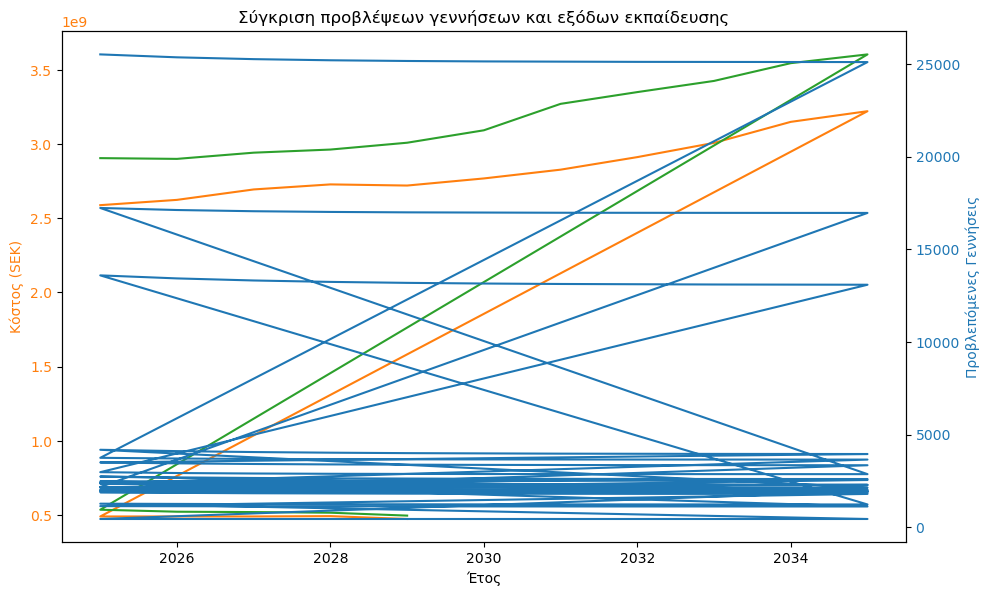

In [235]:
# Δημιουργία διαγράμματος με δευτερεύοντα άξονα για τις γεννήσεις
fig, ax1 = plt.subplots(figsize=(10, 6))

# Πρώτος άξονας για το κόστος
ax1.set_xlabel('Έτος')
ax1.set_ylabel('Κόστος (SEK)', color='tab:orange')
ax1.plot(df['Year'], df['Total_Cost_Grundskola'], label='Total_Cost_Grundskola', color='tab:orange')
ax1.plot(df['Year'], df['Total_Cost_Gymnasieskola'], label='Total_Cost_Gymnasieskola', color='tab:green')
ax1.tick_params(axis='y', labelcolor='tab:orange')

# Δεύτερος άξονας για τις προβλέψεις γεννήσεων
ax2 = ax1.twinx()
ax2.set_ylabel('Προβλεπόμενες Γεννήσεις', color='tab:blue')
ax2.plot(df['Year'], df['Predicted_Births_ARIMA'], label='Predicted_Births_ARIMA', color='tab:blue')
ax2.tick_params(axis='y', labelcolor='tab:blue')

# Τίτλος και εμφάνιση
fig.tight_layout()
plt.title('Σύγκριση προβλέψεων γεννήσεων και εξόδων εκπαίδευσης')
plt.show()


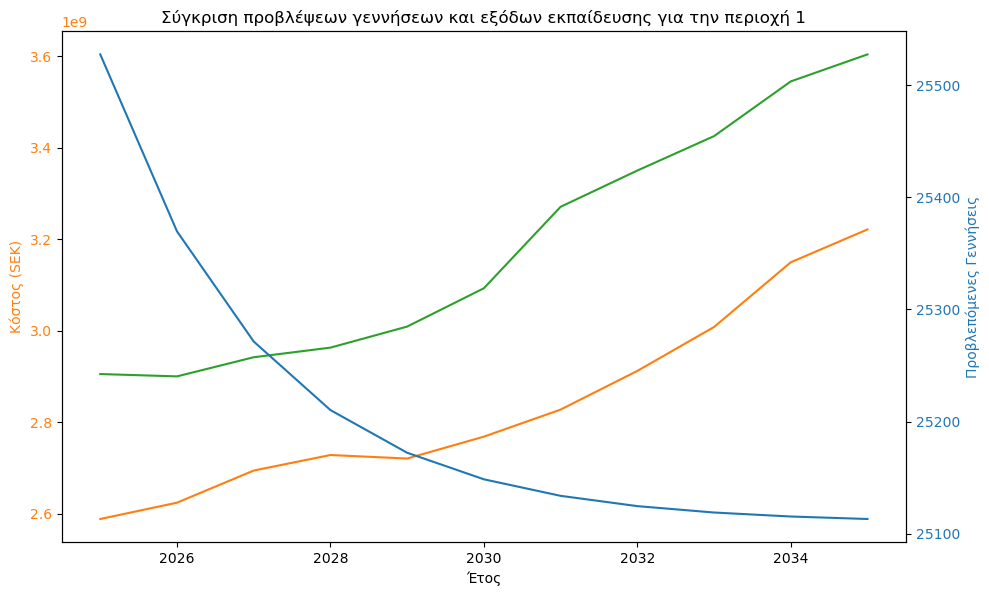

In [236]:
# Φιλτράρισμα για μια συγκεκριμένη περιοχή, π.χ. περιοχή 1
region = 1  # Μπορείς να αλλάξεις την τιμή για να δεις άλλες περιοχές
filtered_df = df[df['Region'] == region]

# Δημιουργία διαγράμματος για την περιοχή 1
fig, ax1 = plt.subplots(figsize=(10, 6))

# Πρώτος άξονας για το κόστος
ax1.set_xlabel('Έτος')
ax1.set_ylabel('Κόστος (SEK)', color='tab:orange')
ax1.plot(filtered_df['Year'], filtered_df['Total_Cost_Grundskola'], label='Total_Cost_Grundskola', color='tab:orange')
ax1.plot(filtered_df['Year'], filtered_df['Total_Cost_Gymnasieskola'], label='Total_Cost_Gymnasieskola', color='tab:green')
ax1.tick_params(axis='y', labelcolor='tab:orange')

# Δεύτερος άξονας για τις προβλέψεις γεννήσεων
ax2 = ax1.twinx()
ax2.set_ylabel('Προβλεπόμενες Γεννήσεις', color='tab:blue')
ax2.plot(filtered_df['Year'], filtered_df['Predicted_Births_ARIMA'], label='Predicted_Births_ARIMA', color='tab:blue')
ax2.tick_params(axis='y', labelcolor='tab:blue')

# Τίτλος και εμφάνιση
fig.tight_layout()
plt.title(f'Σύγκριση προβλέψεων γεννήσεων και εξόδων εκπαίδευσης για την περιοχή {region}')
plt.show()


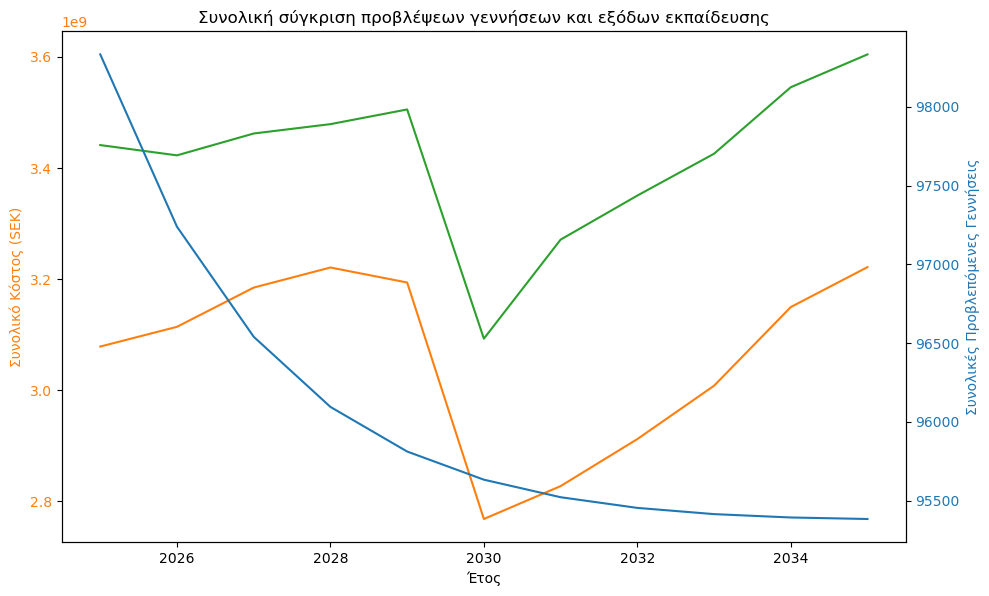

In [237]:
# Ομαδοποίηση των δεδομένων για όλες τις περιοχές
grouped_df = df.groupby('Year').sum()

# Δημιουργία διαγράμματος με τα συνολικά δεδομένα
fig, ax1 = plt.subplots(figsize=(10, 6))

# Πρώτος άξονας για το συνολικό κόστος
ax1.set_xlabel('Έτος')
ax1.set_ylabel('Συνολικό Κόστος (SEK)', color='tab:orange')
ax1.plot(grouped_df.index, grouped_df['Total_Cost_Grundskola'], label='Total_Cost_Grundskola', color='tab:orange')
ax1.plot(grouped_df.index, grouped_df['Total_Cost_Gymnasieskola'], label='Total_Cost_Gymnasieskola', color='tab:green')
ax1.tick_params(axis='y', labelcolor='tab:orange')

# Δεύτερος άξονας για τις συνολικές προβλέψεις γεννήσεων
ax2 = ax1.twinx()
ax2.set_ylabel('Συνολικές Προβλεπόμενες Γεννήσεις', color='tab:blue')
ax2.plot(grouped_df.index, grouped_df['Predicted_Births_ARIMA'], label='Predicted_Births_ARIMA', color='tab:blue')
ax2.tick_params(axis='y', labelcolor='tab:blue')

# Τίτλος και εμφάνιση
fig.tight_layout()
plt.title('Συνολική σύγκριση προβλέψεων γεννήσεων και εξόδων εκπαίδευσης')
plt.show()


In [238]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# 1. Φόρτωση των δεδομένων μας (θα χρησιμοποιήσουμε τα δεδομένα προβλέψεων από το ARIMA για σύγκριση)
# Χρησιμοποίησε το σωστό path στο αρχείο σου αν χρειάζεται
data = pd.read_csv('C:/Users/theop/Downloads/Final_ARIMA_Predictions.csv')

# Εμφάνιση των πρώτων γραμμών για έλεγχο
print(data.head())

# 2. Επιλέγουμε τις στήλες που μας ενδιαφέρουν
# Έστω ότι θα χρησιμοποιήσουμε τα δεδομένα των γεννήσεων για την περιοχή 1 ως παράδειγμα
births_data = data[data['Region'] == 1]['Predicted_Births_ARIMA'].values

# 3. Κανονικοποίηση των δεδομένων
scaler = MinMaxScaler(feature_range=(0, 1))
births_data_normalized = scaler.fit_transform(births_data.reshape(-1, 1))

# Εμφάνιση των κανονικοποιημένων δεδομένων για έλεγχο
print(births_data_normalized[:5])

# 4. Μετατροπή σε διαδοχικές χρονικές ακολουθίες (χρησιμοποιούμε π.χ. 3 έτη ιστορικών δεδομένων για κάθε πρόβλεψη)
def create_sequences(data, time_steps=3):
    sequences = []
    labels = []
    for i in range(len(data) - time_steps):
        sequence = data[i:i + time_steps]
        label = data[i + time_steps]
        sequences.append(sequence)
        labels.append(label)
    return np.array(sequences), np.array(labels)

# Δημιουργία των ακολουθιών με 3 προηγούμενα χρονικά σημεία
time_steps = 3
X, y = create_sequences(births_data_normalized, time_steps)

# Έλεγχος των δεδομένων μας
print(f'Input shape (X): {X.shape}, Output shape (y): {y.shape}')


   Region  Year  Predicted_Births_ARIMA
0       1  2025            25527.434518
1       1  2026            25369.611039
2       1  2027            25271.379016
3       1  2028            25210.237729
4       1  2029            25172.182350
[[1.        ]
 [0.61909326]
 [0.38201041]
 [0.234446  ]
 [0.1425994 ]]
Input shape (X): (8, 3, 1), Output shape (y): (8, 1)


In [239]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# 1. Δημιουργία του μοντέλου LSTM
model = Sequential()

# Προσθέτουμε ένα LSTM layer με 50 νευρώνες
model.add(LSTM(50, activation='relu', input_shape=(time_steps, 1)))

# Προσθέτουμε ένα Dense layer για την πρόβλεψη
model.add(Dense(1))

# 2. Σύνθεση του μοντέλου
model.compile(optimizer='adam', loss='mse')

# 3. Εκπαίδευση του μοντέλου
history = model.fit(X, y, epochs=200, verbose=1)

# 4. Πρόβλεψη
predicted_births_lstm = model.predict(X)

# 5. Αναστροφή της κανονικοποίησης για να επαναφέρουμε τις τιμές στην αρχική τους κλίμακα
predicted_births_lstm_rescaled = scaler.inverse_transform(predicted_births_lstm)

# 6. Εμφάνιση των πρώτων προβλέψεων
print(predicted_births_lstm_rescaled[:5])


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0071
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0064
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0057
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0052
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0046
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0042
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0038
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0034
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0030
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0028
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0025
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0023
Epoch 13/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0021
Epoch 14/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0020
Epoch 15/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0018
Epoch 16/200
1/1 ━━━━

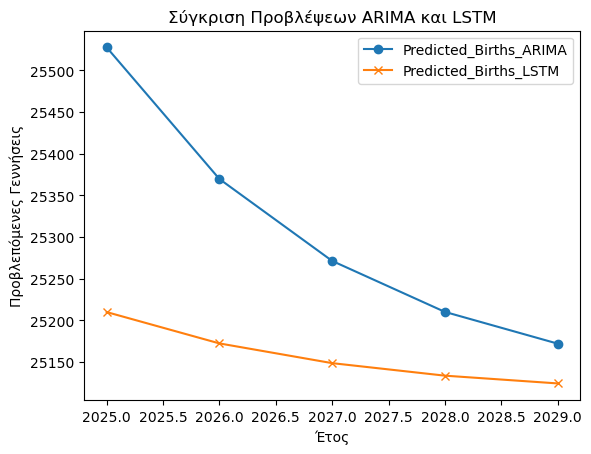

In [240]:
import matplotlib.pyplot as plt

# Προβλέψεις ARIMA (από τα προηγούμενα βήματα)
predicted_arima = [25527.434518, 25369.611039, 25271.379016, 25210.237729, 25172.182350]

# Προβλέψεις LSTM (από το παραπάνω βήμα)
predicted_lstm = [25210.006, 25172.43, 25148.771, 25133.762, 25124.451]

# Έτη
years = [2025, 2026, 2027, 2028, 2029]

# Σχεδίαση του διαγράμματος
plt.plot(years, predicted_arima, label='Predicted_Births_ARIMA', marker='o')
plt.plot(years, predicted_lstm, label='Predicted_Births_LSTM', marker='x')
plt.xlabel('Έτος')
plt.ylabel('Προβλεπόμενες Γεννήσεις')
plt.title('Σύγκριση Προβλέψεων ARIMA και LSTM')
plt.legend()
plt.show()


In [242]:
import pandas as pd

# Φόρτωση του αρχείου scb_region_birth_data.csv
birth_data_df = pd.read_csv('C:/Users/theop/Downloads/scb_region_birth_data.csv')

# Δημιουργία του λεξικού birth_data με βάση την περιοχή
birth_data = {}
regions = birth_data_df['Region'].unique()  # Λήψη όλων των μοναδικών περιοχών

for region in regions:
    # Φιλτράρισμα των γεννήσεων για την τρέχουσα περιοχή και αποθήκευση σε λίστα
    region_births = birth_data_df[birth_data_df['Region'] == region]['Number'].tolist()
    birth_data[region] = region_births

# Τώρα το birth_data έχει όλα τα ιστορικά δεδομένα γεννήσεων ανά περιοχή
print(birth_data)  # Προαιρετικά για να δεις αν όλα έχουν φορτωθεί σωστά


{1: [20095, 19703, 21113, 22834, 22316, 21235, 20778, 19292, 18695, 18055, 17761, 18702, 19380, 18287, 18067, 17750, 18565, 19487, 20820, 21642, 23217, 23935, 25322, 24986, 25546, 24827, 24398, 22626, 21354, 20646, 20815, 20863, 21837, 22622, 24084, 25028, 25779, 25836, 26983, 27421, 27948, 28570, 29619, 28650, 28932, 29613, 29496, 29381, 29457, 28805, 28706, 28409, 28466, 29067, 26356, 25781], 3: [3559, 3458, 3502, 3805, 3670, 3599, 3631, 3376, 3137, 3065, 2981, 3147, 3287, 3097, 3015, 3073, 3070, 3426, 3509, 3619, 3770, 4021, 4206, 4311, 4209, 4094, 4076, 3681, 3252, 3123, 3091, 2919, 3078, 3180, 3322, 3450, 3625, 3497, 3679, 3825, 4069, 3965, 4141, 3999, 4124, 3931, 3997, 4167, 4274, 4149, 4231, 4278, 4142, 4261, 3991, 3816], 4: [3615, 3376, 3246, 3478, 3344, 3307, 3385, 3075, 2819, 2775, 2788, 2859, 2805, 2769, 2647, 2661, 2694, 2813, 2851, 2936, 3157, 3366, 3605, 3576, 3439, 3417, 3122, 2888, 2615, 2347, 2282, 2368, 2420, 2470, 2597, 2714, 2619, 2664, 2762, 2865, 2833, 2863, 3003,

In [243]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Χρησιμοποιούμε έναν scaler για να κλιμακώσουμε τα δεδομένα μεταξύ 0 και 1
scaler = MinMaxScaler()

# Διάλεξε μια περιοχή για παράδειγμα (θα το κάνουμε για όλες τις περιοχές στον κώδικα αργότερα)
region = 1  # Αντικατάστησε με την περιοχή που θες να δεις
region_births = np.array(birth_data[region]).reshape(-1, 1)

# Κλιμάκωση των δεδομένων γεννήσεων
scaled_births = scaler.fit_transform(region_births)

# Ετοιμασία των δεδομένων για το LSTM (παράδειγμα με window size = 3)
X = []
y = []
window_size = 3

for i in range(len(scaled_births) - window_size):
    X.append(scaled_births[i:i+window_size])
    y.append(scaled_births[i+window_size])

X = np.array(X)
y = np.array(y)

# Έλεγχος των σχημάτων για να δεις αν είναι σωστά τα δεδομένα
print("Input shape (X):", X.shape)
print("Output shape (y):", y.shape)


Input shape (X): (53, 3, 1)
Output shape (y): (53, 1)


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.4075
Epoch 2/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4059 
Epoch 3/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3676
Epoch 4/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3586 
Epoch 5/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3631 
Epoch 6/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3464
Epoch 7/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3452 
Epoch 8/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3230
Epoch 9/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3161 
Epoch 10/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step - loss: 0.3000  
Epoch 11/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2939 
Epoch 12/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2846 
Epoch 13/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2703 
Epoch 14/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2605 
Epoch 15/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2414 
Epoch 16/200
2/2 ━━

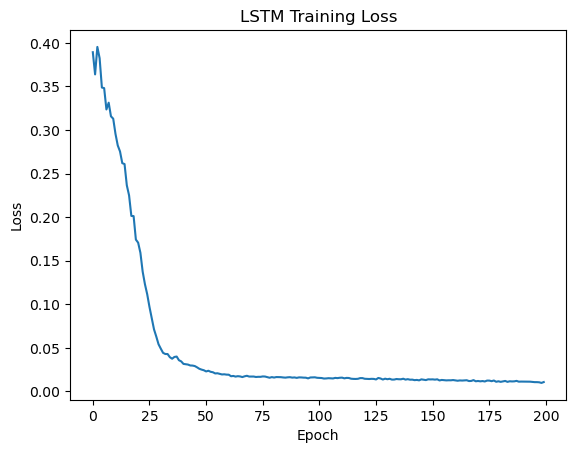

In [244]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Δημιουργία του LSTM μοντέλου
model = Sequential()

# Προσθήκη του LSTM επιπέδου με 50 μονάδες και εισαγωγή σχήματος δεδομένων
model.add(LSTM(50, activation='relu', input_shape=(X.shape[1], X.shape[2])))

# Προσθήκη του επιπέδου Dense για έξοδο 1 νευρώνα
model.add(Dense(1))

# Σύνταξη του μοντέλου
model.compile(optimizer='adam', loss='mse')

# Εκπαίδευση του LSTM μοντέλου
history = model.fit(X, y, epochs=200, verbose=1)

# Προβολή των απωλειών κατά την εκπαίδευση
import matplotlib.pyplot as plt

plt.plot(history.history['loss'])
plt.title('LSTM Training Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()


In [246]:
# Πρόβλεψη για τα επόμενα 11 χρόνια (2025–2035)
future_steps = 11  # Τα χρόνια για τα οποία θέλουμε να κάνουμε προβλέψεις

predictions_lstm = []
current_input = X[-1].reshape(1, X.shape[1], X.shape[2])  # Ξεκινάμε από τα τελευταία δεδομένα εισόδου

for _ in range(future_steps):
    # Πρόβλεψη για το επόμενο βήμα
    predicted_value = model.predict(current_input)
    predictions_lstm.append(predicted_value[0, 0])
    
    # Ανανεώνουμε το input για το επόμενο βήμα
    predicted_value = predicted_value.reshape(1, 1, 1)  # Προσαρμογή του σχήματος της πρόβλεψης
    current_input = np.append(current_input[:, 1:, :], predicted_value, axis=1)

# Αποκωδικοποίηση των προβλέψεων από τα κλιμακωμένα δεδομένα πίσω στις πραγματικές τιμές
predictions_lstm_actual = scaler.inverse_transform(np.array(predictions_lstm).reshape(-1, 1))

# Προβολή των προβλέψεων
for i, year in enumerate(range(2025, 2036)):
    print(f"Year: {year}, Predicted Births (LSTM): {predictions_lstm_actual[i][0]}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Year: 2025, Predicted Births (LSTM): 27342.5859375
Year: 2026, Predicted Births (LSTM): 27184.939453125
Year: 2027, Predicted Births (LSTM): 27026.193359375
Year: 2028, Predicted Births (LSTM): 27121.763671875
Year: 2029, Predicted Births (LSTM): 27104.42578125
Year: 2030, Predicted Births (LSTM): 27083.880859375
Year: 2031, Predicted Births (LSTM): 27090.02734375
Year: 2032, Predicted Births (LSTM): 27085.646484375
Year: 2033, Predicted Births (LSTM): 27080.18359375
Year: 2034, Predicted Births (LSTM): 27077.783203125
Year: 2035, Predicted Births (LSTM): 27074.556640625


In [248]:
# Φόρτωμα του αρχείου με τα δεδομένα γέννησης
birth_data = pd.read_csv('C:/Users/theop/Downloads/scb_region_birth_data.csv')

# Έλεγχος αν οι στήλες είναι σωστές
print(birth_data.columns)
print(birth_data.head())


Index(['Region', 'Year', 'Number'], dtype='object')
   Region  Year  Number
0       1  1968   20095
1       1  1969   19703
2       1  1970   21113
3       1  1971   22834
4       1  1972   22316


In [251]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Εισαγωγή δεδομένων
birth_data = pd.read_csv('C:/Users/theop/Downloads/scb_region_birth_data.csv')

# Κανονικοποίηση των δεδομένων
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = {}

regions = birth_data['Region'].unique()

for region in regions:
    region_data = birth_data[birth_data['Region'] == region]
    scaled_data[region] = scaler.fit_transform(region_data['Number'].values.reshape(-1, 1))

# Λίστα για να αποθηκεύσουμε τις προβλέψεις
final_predictions_lstm = []

# Πρόβλεψη LSTM για κάθε περιοχή
for region in regions:
    region_data = birth_data[birth_data['Region'] == region]
    scaled_region_data = scaled_data[region]
    
    # Δημιουργία εισόδου και εξόδου για το μοντέλο
    X, y = [], []
    for i in range(len(scaled_region_data) - 3):
        X.append(scaled_region_data[i:i+3])
        y.append(scaled_region_data[i+3])
    
    X = np.array(X)
    y = np.array(y)
    
    # Διαμόρφωση δεδομένων για το LSTM
    X = np.reshape(X, (X.shape[0], X.shape[1], 1))
    
    # Δημιουργία του μοντέλου LSTM
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(X.shape[1], 1)))
    model.add(LSTM(units=50))
    model.add(Dense(1))
    
    # Σύνταξη του μοντέλου
    model.compile(optimizer='adam', loss='mean_squared_error')
    
    # Εκπαίδευση του μοντέλου
    model.fit(X, y, epochs=200, batch_size=32, verbose=0)
    
    # Δημιουργία των προβλέψεων για τα έτη 2025-2035
    predictions_lstm = []
    current_input = X[-1].reshape(1, 3, 1)
    
    for year in range(2025, 2036):
        predicted_value = model.predict(current_input)
        predictions_lstm.append(predicted_value[0, 0])
        
        # Ανανεώνουμε το input για το επόμενο βήμα
        predicted_value = np.reshape(predicted_value, (1, 1, 1))  # Σωστή διαμόρφωση του predicted_value
        current_input = np.append(current_input[:, 1:, :], predicted_value, axis=1)
    
    # Αποκωδικοποίηση των προβλέψεων από τα κλιμακωμένα δεδομένα πίσω στις πραγματικές τιμές
    predictions_lstm_actual = scaler.inverse_transform(np.array(predictions_lstm).reshape(-1, 1))
    
    # Προσθήκη των προβλέψεων στη λίστα με τη μορφή περιοχής-έτος
    for i, year in enumerate(range(2025, 2036)):
        final_predictions_lstm.append({
            'Region': region,
            'Year': year,
            'Predicted_Births_LSTM': predictions_lstm_actual[i][0]
        })

# Μετατροπή της λίστας με τις προβλέψεις σε DataFrame
predictions_lstm_df = pd.DataFrame(final_predictions_lstm)

# Αποθήκευση του αρχείου CSV με τις προβλέψεις
predictions_lstm_df.to_csv('LSTM_predictions_per_region.csv', index=False)

# Εμφάνιση των πρώτων αποτελεσμάτων
print(predictions_lstm_df.head())


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
   Region  Year  Predicted_Births_LSTM
0       1  2025            3681.184570
1       1  2026            3633.375488
2       1  2027            3575.998779
3       1  2028            3600.510742
4       1  2029            3576.133545


In [253]:
print(birth_data.columns)


Index(['Region', 'Year', 'Predicted_Births_ARIMA'], dtype='object')


In [255]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Εισαγωγή των σωστών δεδομένων από το αρχείο
birth_data = pd.read_csv('C:/Users/theop/Downloads/scb_region_birth_data.csv')

# Σιγουρευόμαστε ότι το αρχείο έχει τις σωστές στήλες
print(birth_data.columns)

# Κανονικοποίηση των δεδομένων
scaler = MinMaxScaler(feature_range=(0, 1))

# Λίστα για τις προβλέψεις από όλες τις περιοχές
final_predictions_lstm = []

# Τρέχουμε το LSTM για κάθε περιοχή
regions = birth_data['Region'].unique()

for region in regions:
    region_data = birth_data[birth_data['Region'] == region]
    
    # Χρησιμοποιούμε τη στήλη 'Number' που περιέχει τον αριθμό των γεννήσεων
    region_births = region_data[['Number']].values
    
    # Κανονικοποίηση των δεδομένων
    scaled_data = scaler.fit_transform(region_births)
    
    # Δημιουργία των δεδομένων εισόδου (X) και εξόδου (y)
    X, y = [], []
    for i in range(3, len(scaled_data)):
        X.append(scaled_data[i-3:i, 0])  # Παίρνουμε τα προηγούμενα 3 δεδομένα ως input
        y.append(scaled_data[i, 0])  # Το τρέχον δεδομένο ως output
    
    X, y = np.array(X), np.array(y)
    
    # Αναδιαμόρφωση για να ταιριάζει με το LSTM
    X = np.reshape(X, (X.shape[0], X.shape[1], 1))
    
    # Δημιουργία του LSTM μοντέλου
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(X.shape[1], 1)))
    model.add(LSTM(50))
    model.add(Dense(1))
    
    model.compile(optimizer='adam', loss='mean_squared_error')
    
    # Εκπαίδευση του μοντέλου
    model.fit(X, y, epochs=200, batch_size=32, verbose=0)
    
    # Δημιουργία προβλέψεων για τα έτη 2025-2035
    predictions_lstm = []
    current_input = scaled_data[-3:].reshape(1, 3, 1)  # Χρησιμοποιούμε τα 3 τελευταία δεδομένα ως input
    
    for _ in range(11):  # Προβλέπουμε για 11 χρόνια
        predicted_value = model.predict(current_input)
        predictions_lstm.append(predicted_value[0, 0])
        
        # Ανανεώνουμε το input για το επόμενο βήμα
        predicted_value_reshaped = np.array([[[predicted_value[0, 0]]]])  # Προσαρμόζουμε τις διαστάσεις σωστά
        current_input = np.append(current_input[:, 1:, :], predicted_value_reshaped, axis=1)
    
    # Αποκωδικοποίηση των προβλέψεων από τα κλιμακωμένα δεδομένα στις πραγματικές τιμές
    predictions_lstm_actual = scaler.inverse_transform(np.array(predictions_lstm).reshape(-1, 1))
    
    # Προσθήκη των προβλέψεων στη λίστα με τα αποτελέσματα
    for i, year in enumerate(range(2025, 2036)):
        final_predictions_lstm.append({
            'Region': region,
            'Year': year,
            'Predicted_Births_LSTM': predictions_lstm_actual[i][0]
        })

# Μετατροπή των αποτελεσμάτων σε DataFrame
final_predictions_df = pd.DataFrame(final_predictions_lstm)

# Εμφάνιση των πρώτων γραμμών των αποτελεσμάτων
print(final_predictions_df.head())

# Αποθήκευση των αποτελεσμάτων σε αρχείο CSV
final_predictions_df.to_csv('C:/Users/theop/Downloads/Final_LSTM_Predictions.csv', index=False)


Index(['Region', 'Year', 'Number'], dtype='object')


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 847ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
   Region  Year  Predicted_Births_LSTM
0       1  2025           26732.964844
1       1  2026           26135.876953
2       1  2027           26103.000000
3       1  2028           26147.337891
4       1  2029           25987.943359


In [256]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Εισαγωγή των δεδομένων γεννήσεων από το σωστό αρχείο
birth_data = pd.read_csv('C:/Users/theop/Downloads/scb_region_birth_data.csv')

# Έλεγχος αν οι στήλες είναι σωστές
print(birth_data.columns)

# Λίστα για να αποθηκεύσουμε τις τελικές προβλέψεις από όλες τις περιοχές
final_predictions_lstm = []

# Τρέχουμε το LSTM για κάθε περιοχή
regions = birth_data['Region'].unique()

for region in regions:
    region_data = birth_data[birth_data['Region'] == region]
    
    # Χρησιμοποιούμε τη στήλη 'Number' που περιέχει τον αριθμό γεννήσεων
    region_births = region_data[['Number']].values
    
    # Κανονικοποίηση των δεδομένων
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(region_births)
    
    # Δημιουργία των δεδομένων εισόδου (X) και εξόδου (y)
    X, y = [], []
    for i in range(3, len(scaled_data)):
        X.append(scaled_data[i-3:i, 0])  # Παίρνουμε τα προηγούμενα 3 δεδομένα ως input
        y.append(scaled_data[i, 0])  # Το τρέχον δεδομένο ως output
    
    X, y = np.array(X), np.array(y)
    
    # Αναδιαμόρφωση για να ταιριάζει με το LSTM
    X = np.reshape(X, (X.shape[0], X.shape[1], 1))
    
    # Δημιουργία του LSTM μοντέλου
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(X.shape[1], 1)))
    model.add(LSTM(50))
    model.add(Dense(1))
    
    model.compile(optimizer='adam', loss='mean_squared_error')
    
    # Εκπαίδευση του μοντέλου
    model.fit(X, y, epochs=200, batch_size=32, verbose=0)
    
    # Δημιουργία προβλέψεων για τα έτη 2025-2035
    predictions_lstm = []
    current_input = scaled_data[-3:].reshape(1, 3, 1)  # Χρησιμοποιούμε τα 3 τελευταία δεδομένα ως input
    
    for _ in range(11):  # Προβλέπουμε για 11 χρόνια (2025–2035)
        predicted_value = model.predict(current_input)
        predictions_lstm.append(predicted_value[0, 0])
        
        # Ανανεώνουμε το input για το επόμενο βήμα
        predicted_value_reshaped = np.array([[[predicted_value[0, 0]]]])  # Προσαρμόζουμε τις διαστάσεις σωστά
        current_input = np.append(current_input[:, 1:, :], predicted_value_reshaped, axis=1)
    
    # Αποκωδικοποίηση των προβλέψεων από τα κλιμακωμένα δεδομένα στις πραγματικές τιμές
    predictions_lstm_actual = scaler.inverse_transform(np.array(predictions_lstm).reshape(-1, 1))
    
    # Προσθήκη των προβλέψεων στη λίστα με τα αποτελέσματα για κάθε περιοχή
    for i, year in enumerate(range(2025, 2036)):
        final_predictions_lstm.append({
            'Region': region,
            'Year': year,
            'Predicted_Births_LSTM': predictions_lstm_actual[i][0]
        })

# Μετατροπή των τελικών προβλέψεων σε DataFrame
final_predictions_df = pd.DataFrame(final_predictions_lstm)

# Εμφάνιση των πρώτων γραμμών των τελικών προβλέψεων
print(final_predictions_df.head())

# Αποθήκευση των αποτελεσμάτων σε αρχείο CSV
final_predictions_df.to_csv('C:/Users/theop/Downloads/Final_LSTM_Predictions_All_Regions.csv', index=False)


Index(['Region', 'Year', 'Number'], dtype='object')


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
   Region  Year  Predicted_Births_LSTM
0       1  2025           26784.730469
1       1  2026           26168.650391
2       1  2027           26155.535156
3       1  2028           26217.507812
4       1  2029           26059.820312


In [257]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Εισαγωγή δεδομένων γεννήσεων από το σωστό αρχείο
birth_data = pd.read_csv('C:/Users/theop/Downloads/scb_region_birth_data.csv')

# Έλεγχος αν οι στήλες είναι σωστές
print(birth_data.columns)

# Λίστα για να αποθηκεύσουμε τις τελικές προβλέψεις από όλες τις περιοχές
final_predictions_lstm = []

# Παίρνουμε όλες τις μοναδικές περιοχές
regions = birth_data['Region'].unique()

# Τρέχουμε το LSTM για κάθε περιοχή ξεχωριστά
for region in regions:
    region_data = birth_data[birth_data['Region'] == region]
    
    # Χρησιμοποιούμε τη στήλη 'Number' που περιέχει τον αριθμό γεννήσεων
    region_births = region_data[['Number']].values
    
    # Κανονικοποίηση των δεδομένων
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(region_births)
    
    # Δημιουργία των δεδομένων εισόδου (X) και εξόδου (y)
    X, y = [], []
    for i in range(3, len(scaled_data)):
        X.append(scaled_data[i-3:i, 0])  # Παίρνουμε τα προηγούμενα 3 δεδομένα ως input
        y.append(scaled_data[i, 0])  # Το τρέχον δεδομένο ως output
    
    X, y = np.array(X), np.array(y)
    
    # Αναδιαμόρφωση για να ταιριάζει με το LSTM
    X = np.reshape(X, (X.shape[0], X.shape[1], 1))
    
    # Δημιουργία του LSTM μοντέλου
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(X.shape[1], 1)))
    model.add(LSTM(50))
    model.add(Dense(1))
    
    model.compile(optimizer='adam', loss='mean_squared_error')
    
    # Εκπαίδευση του μοντέλου
    model.fit(X, y, epochs=200, batch_size=32, verbose=0)
    
    # Δημιουργία προβλέψεων για τα έτη 2025-2035
    predictions_lstm = []
    current_input = scaled_data[-3:].reshape(1, 3, 1)  # Χρησιμοποιούμε τα 3 τελευταία δεδομένα ως input
    
    for _ in range(11):  # Προβλέπουμε για 11 χρόνια (2025–2035)
        predicted_value = model.predict(current_input)
        predictions_lstm.append(predicted_value[0, 0])
        
        # Ανανεώνουμε το input για το επόμενο βήμα
        current_input = np.append(current_input[:, 1:, :], np.reshape(predicted_value, (1, 1, 1)), axis=1)
    
    # Αποκωδικοποίηση των προβλέψεων από τα κλιμακωμένα δεδομένα στις πραγματικές τιμές
    predictions_lstm_actual = scaler.inverse_transform(np.array(predictions_lstm).reshape(-1, 1))
    
    # Προσθήκη των προβλέψεων στη λίστα με τα αποτελέσματα για κάθε περιοχή
    for i, year in enumerate(range(2025, 2036)):
        final_predictions_lstm.append({
            'Region': region,
            'Year': year,
            'Predicted_Births_LSTM': predictions_lstm_actual[i][0]
        })

# Μετατροπή των τελικών προβλέψεων σε DataFrame
final_predictions_df = pd.DataFrame(final_predictions_lstm)

# Εμφάνιση των πρώτων γραμμών των τελικών προβλέψεων
print(final_predictions_df.head())

# Αποθήκευση των αποτελεσμάτων σε αρχείο CSV
final_predictions_df.to_csv('C:/Users/theop/Downloads/Final_LSTM_Predictions_All_Regions.csv', index=False)


Index(['Region', 'Year', 'Number'], dtype='object')


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
   Region  Year  Predicted_Births_LSTM
0       1  2025           26892.146484
1       1  2026           26162.578125
2       1  2027           26152.705078
3       1  2028           26247.587891
4       1  2029           26039.632812


In [258]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Εισαγωγή δεδομένων γεννήσεων από το σωστό αρχείο
birth_data = pd.read_csv('C:/Users/theop/Downloads/scb_region_birth_data.csv')

# Έλεγχος αν οι στήλες είναι σωστές
print(birth_data.columns)

# Λίστα για να αποθηκεύσουμε τις τελικές προβλέψεις από όλες τις περιοχές
final_predictions_lstm = []

# Παίρνουμε όλες τις μοναδικές περιοχές
regions = birth_data['Region'].unique()

# Τρέχουμε το LSTM για κάθε περιοχή ξεχωριστά
for region in regions:
    region_data = birth_data[birth_data['Region'] == region]
    
    # Χρησιμοποιούμε τη στήλη 'Number' που περιέχει τον αριθμό γεννήσεων
    region_births = region_data[['Number']].values
    
    # Κανονικοποίηση των δεδομένων
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(region_births)
    
    # Δημιουργία των δεδομένων εισόδου (X) και εξόδου (y)
    X, y = [], []
    for i in range(3, len(scaled_data)):
        X.append(scaled_data[i-3:i, 0])  # Παίρνουμε τα προηγούμενα 3 δεδομένα ως input
        y.append(scaled_data[i, 0])  # Το τρέχον δεδομένο ως output
    
    X, y = np.array(X), np.array(y)
    
    # Αναδιαμόρφωση για να ταιριάζει με το LSTM
    X = np.reshape(X, (X.shape[0], X.shape[1], 1))
    
    # Δημιουργία του LSTM μοντέλου
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(X.shape[1], 1)))
    model.add(LSTM(50))
    model.add(Dense(1))
    
    model.compile(optimizer='adam', loss='mean_squared_error')
    
    # Εκπαίδευση του μοντέλου
    model.fit(X, y, epochs=200, batch_size=32, verbose=0)
    
    # Δημιουργία προβλέψεων για τα έτη 2025-2035
    predictions_lstm = []
    current_input = scaled_data[-3:].reshape(1, 3, 1)  # Χρησιμοποιούμε τα 3 τελευταία δεδομένα ως input
    
    for _ in range(11):  # Προβλέπουμε για 11 χρόνια (2025–2035)
        predicted_value = model.predict(current_input)
        predictions_lstm.append(predicted_value[0, 0])
        
        # Ανανεώνουμε το input για το επόμενο βήμα
        current_input = np.append(current_input[:, 1:, :], np.reshape(predicted_value, (1, 1, 1)), axis=1)
    
    # Αποκωδικοποίηση των προβλέψεων από τα κλιμακωμένα δεδομένα στις πραγματικές τιμές
    predictions_lstm_actual = scaler.inverse_transform(np.array(predictions_lstm).reshape(-1, 1))
    
    # Προσθήκη των προβλέψεων στη λίστα με τα αποτελέσματα για κάθε περιοχή
    for i, year in enumerate(range(2025, 2036)):
        final_predictions_lstm.append({
            'Region': region,
            'Year': year,
            'Predicted_Births_LSTM': predictions_lstm_actual[i][0]
        })

# Μετατροπή των τελικών προβλέψεων σε DataFrame
final_predictions_df = pd.DataFrame(final_predictions_lstm)

# Εμφάνιση των πρώτων γραμμών των τελικών προβλέψεων
print(final_predictions_df.head())

# Αποθήκευση των αποτελεσμάτων σε αρχείο CSV
final_predictions_df.to_csv('C:/Users/theop/Downloads/Final_LSTM_Predictions_All_Regions.csv', index=False)


Index(['Region', 'Year', 'Number'], dtype='object')


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
   Region  Year  Predicted_Births_LSTM
0       1  2025           26855.203125
1       1  2026           26246.648438
2       1  2027           26272.888672
3       1  2028           26367.062500
4       1  2029           26234.794922


In [259]:
import pandas as pd

# Φόρτωση αρχείων προβλέψεων και κόστους
predictions_df = pd.read_csv("C:/Users/theop/Downloads/Final_LSTM_Predictions.csv")
grundskola_costs = pd.read_csv("C:/Users/theop/Downloads/grundskola_costs_per_child.csv")
gymnasieskola_costs = pd.read_csv("C:/Users/theop/Downloads/gymnasieskola_costs_per_child.csv")

# Έλεγχος δεδομένων κόστους
print("Κόστος Grundskola (Πρωτοβάθμια Εκπαίδευση):")
print(grundskola_costs.head())
print("\nΚόστος Gymnasieskola (Δευτεροβάθμια Εκπαίδευση):")
print(gymnasieskola_costs.head())


Κόστος Grundskola (Πρωτοβάθμια Εκπαίδευση):
   Year  Fixed_cost_per_child_kr  Current_cost_per_child_kr
0  2007                   101392                      79200
1  2008                   103429                      83600
2  2009                   106611                      85900
3  2010                   108217                      88300
4  2011                   108075                      90500

Κόστος Gymnasieskola (Δευτεροβάθμια Εκπαίδευση):
   Year  Fixed_cost_per_child_kr  Current_cost_per_child_kr
0  2007                   113809                      88900
1  2008                   114316                      92400
2  2009                   116416                      93800
3  2010                   117532                      95900
4  2011                   119539                     100100


In [261]:
# Αποθήκευση τελικών αποτελεσμάτων
final_costs = []

# Υπολογισμός κόστους
for _, row in predictions_df.iterrows():
    region = row['Region']
    year = row['Year']
    births = row['Predicted_Births_LSTM']
    
    # Έλεγχος για κόστος Grundskola και Gymnasieskola για το τρέχον έτος
    grundskola_year_cost = grundskola_costs[grundskola_costs['Year'] == year]
    gymnasieskola_year_cost = gymnasieskola_costs[gymnasieskola_costs['Year'] == year]
    
    # Αν δεν υπάρχει κόστος για το τρέχον έτος, παραλείπουμε την εγγραφή
    if grundskola_year_cost.empty or gymnasieskola_year_cost.empty:
        print(f"Κενό κόστος για το έτος {year}. Παραλείπεται.")
        continue

    total_grundskola_cost = 0
    total_gymnasieskola_cost = 0
    
    # Κόστος πρωτοβάθμιας εκπαίδευσης ανά τάξη
    for age, klass in grundskola_classes.items():
        students_in_class = births / 10  # Εκτίμηση ίσου αριθμού ανά τάξη
        fixed_cost = grundskola_year_cost['Fixed_cost_per_child_kr'].values[0]
        current_cost = grundskola_year_cost['Current_cost_per_child_kr'].values[0]
        
        total_grundskola_cost += students_in_class * (fixed_cost + current_cost)
    
    # Κόστος δευτεροβάθμιας εκπαίδευσης ανά τάξη
    for age, klass in gymnasieskola_classes.items():
        students_in_class = births / 3  # Εκτίμηση ίσου αριθμού ανά τάξη
        fixed_cost = gymnasieskola_year_cost['Fixed_cost_per_child_kr'].values[0]
        current_cost = gymnasieskola_year_cost['Current_cost_per_child_kr'].values[0]
        
        total_gymnasieskola_cost += students_in_class * (fixed_cost + current_cost)
    
    # Αποθήκευση αποτελεσμάτων
    final_costs.append({
        'Region': region,
        'Year': year,
        'Total_Cost_Grundskola': total_grundskola_cost,
        'Total_Cost_Gymnasieskola': total_gymnasieskola_cost
    })

# Μετατροπή σε DataFrame και αποθήκευση
costs_df = pd.DataFrame(final_costs)
costs_df.to_csv("C:/Users/theop/Downloads/Predicted_Education_Costs.csv", index=False)
print("Το αρχείο με τα κόστη αποθηκεύτηκε επιτυχώς.")


Κενό κόστος για το έτος 2025.0. Παραλείπεται.
Κενό κόστος για το έτος 2026.0. Παραλείπεται.
Κενό κόστος για το έτος 2027.0. Παραλείπεται.
Κενό κόστος για το έτος 2028.0. Παραλείπεται.
Κενό κόστος για το έτος 2029.0. Παραλείπεται.
Κενό κόστος για το έτος 2030.0. Παραλείπεται.
Κενό κόστος για το έτος 2031.0. Παραλείπεται.
Κενό κόστος για το έτος 2032.0. Παραλείπεται.
Κενό κόστος για το έτος 2033.0. Παραλείπεται.
Κενό κόστος για το έτος 2034.0. Παραλείπεται.
Κενό κόστος για το έτος 2035.0. Παραλείπεται.
Κενό κόστος για το έτος 2025.0. Παραλείπεται.
Κενό κόστος για το έτος 2026.0. Παραλείπεται.
Κενό κόστος για το έτος 2027.0. Παραλείπεται.
Κενό κόστος για το έτος 2028.0. Παραλείπεται.
Κενό κόστος για το έτος 2029.0. Παραλείπεται.
Κενό κόστος για το έτος 2030.0. Παραλείπεται.
Κενό κόστος για το έτος 2031.0. Παραλείπεται.
Κενό κόστος για το έτος 2032.0. Παραλείπεται.
Κενό κόστος για το έτος 2033.0. Παραλείπεται.
Κενό κόστος για το έτος 2034.0. Παραλείπεται.
Κενό κόστος για το έτος 2035.0. Πα

In [263]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Εισαγωγή των δεδομένων κόστους μέχρι το 2022 με τα σωστά μονοπάτια
grundskola_costs = pd.read_csv('C:/Users/theop/Downloads/grundskola_costs_per_child.csv')
gymnasieskola_costs = pd.read_csv('C:/Users/theop/Downloads/gymnasieskola_costs_per_child.csv')

# Κανονικοποίηση των δεδομένων
scaler_grundskola = MinMaxScaler(feature_range=(0, 1))
scaler_gymnasieskola = MinMaxScaler(feature_range=(0, 1))

# Κανονικοποιημένα κόστη ανά έτος
grundskola_costs[['Fixed_cost_per_child_kr', 'Current_cost_per_child_kr']] = scaler_grundskola.fit_transform(grundskola_costs[['Fixed_cost_per_child_kr', 'Current_cost_per_child_kr']])
gymnasieskola_costs[['Fixed_cost_per_child_kr', 'Current_cost_per_child_kr']] = scaler_gymnasieskola.fit_transform(gymnasieskola_costs[['Fixed_cost_per_child_kr', 'Current_cost_per_child_kr']])

# Προβολή κανονικοποιημένων δεδομένων
print("Κανονικοποιημένα κόστη Grundskola:")
print(grundskola_costs.head())
print("\nΚανονικοποιημένα κόστη Gymnasieskola:")
print(gymnasieskola_costs.head())


Κανονικοποιημένα κόστη Grundskola:
   Year  Fixed_cost_per_child_kr  Current_cost_per_child_kr
0  2007                 0.000000                   0.000000
1  2008                 0.062787                   0.088531
2  2009                 0.160867                   0.134809
3  2010                 0.210369                   0.183099
4  2011                 0.205992                   0.227364

Κανονικοποιημένα κόστη Gymnasieskola:
   Year  Fixed_cost_per_child_kr  Current_cost_per_child_kr
0  2007                 0.000000                   0.000000
1  2008                 0.017063                   0.075758
2  2009                 0.087739                   0.106061
3  2010                 0.125299                   0.151515
4  2011                 0.192845                   0.242424


In [264]:
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Προετοιμασία δεδομένων για το LSTM
def prepare_data(cost_data):
    X, y = [], []
    for i in range(len(cost_data) - 3):  # Χρησιμοποιούμε τα τελευταία τρία έτη για να προβλέψουμε το επόμενο
        X.append(cost_data[i:i+3])
        y.append(cost_data[i+3])
    return np.array(X), np.array(y)

# Εκπαίδευση και πρόβλεψη για κάθε τύπο κόστους
def train_and_predict_lstm(costs_data, scaler, years_to_predict=11):
    # Χρήση μόνο των στηλών κόστους για εκπαίδευση του LSTM
    cost_data = costs_data[['Fixed_cost_per_child_kr', 'Current_cost_per_child_kr']].values
    X, y = prepare_data(cost_data)

    # Αναδιαμόρφωση για το LSTM
    X = X.reshape((X.shape[0], X.shape[1], 2))

    # Δημιουργία του μοντέλου LSTM
    model = Sequential([
        LSTM(50, activation='relu', input_shape=(X.shape[1], X.shape[2])),
        Dense(2)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=200, verbose=1)

    # Προβλέψεις για τα έτη 2025-2035
    predictions = []
    input_seq = cost_data[-3:].reshape((1, 3, 2))  # Αρχική ακολουθία εισόδου για τις προβλέψεις
    for _ in range(years_to_predict):
        predicted_cost = model.predict(input_seq, verbose=0)
        predictions.append(predicted_cost[0])

        # Ανανεώνουμε το input_seq με την πρόβλεψη
        input_seq = np.append(input_seq[:, 1:, :], predicted_cost.reshape((1, 1, 2)), axis=1)

    # Αποκατάσταση των κανονικοποιημένων δεδομένων στις πραγματικές τιμές
    predictions_actual = scaler.inverse_transform(predictions)
    return predictions_actual

# Πρόβλεψη για Grundskola και Gymnasieskola
predicted_grundskola_costs = train_and_predict_lstm(grundskola_costs, scaler_grundskola)
predicted_gymnasieskola_costs = train_and_predict_lstm(gymnasieskola_costs, scaler_gymnasieskola)

# Δημιουργία DataFrame για τα προβλεπόμενα αποτελέσματα και εμφάνιση
future_years = list(range(2025, 2036))
predicted_costs_df = pd.DataFrame({
    'Year': future_years,
    'Grundskola_Fixed_Cost_per_Child': predicted_grundskola_costs[:, 0],
    'Grundskola_Current_Cost_per_Child': predicted_grundskola_costs[:, 1],
    'Gymnasieskola_Fixed_Cost_per_Child': predicted_gymnasieskola_costs[:, 0],
    'Gymnasieskola_Current_Cost_per_Child': predicted_gymnasieskola_costs[:, 1]
})

print(predicted_costs_df)


C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.4067
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4005
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.3943
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.3883
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.3824
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.3765
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.3707
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.3650
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3594
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.3539
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.3485
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3431
Epoch 13/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.3379
Epoch 14/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3327
Epoch 15/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.3276
Epoch 16/200
1/1 ━━━━

C:\Users\theop\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.5083
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.4979
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.4878
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.4779
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.4682
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.4588
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.4496
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.4406
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.4319
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.4233
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.4150
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.4068
Epoch 13/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.3989
Epoch 14/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.3911
Epoch 15/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3836
Epoch 16/200
1/1 ━━━━━━━━━━━━━━━━

In [267]:
# Βεβαιώσου ότι το DataFrame έχει δεδομένα
print(predicted_costs_df.head())

# Αποθήκευση σε CSV με πλήρη διαδρομή
predicted_costs_df.to_csv('C:/Users/theop/Downloads/predicted_education_costs_2025_2035.csv', index=False)
print("Το αρχείο αποθηκεύτηκε επιτυχώς.")


   Year  Grundskola_Fixed_Cost_per_Child  Grundskola_Current_Cost_per_Child  \
0  2025                    137064.472752                      129376.109028   
1  2026                    139413.016366                      132407.601142   
2  2027                    141963.675895                      136077.485788   
3  2028                    146089.756657                      142691.082168   
4  2029                    150370.220564                      149067.826748   

   Gymnasieskola_Fixed_Cost_per_Child  Gymnasieskola_Current_Cost_per_Child  
0                       142420.433531                         130713.383412  
1                       142991.975927                         131589.539146  
2                       143771.634159                         132578.217983  
3                       145279.505662                         134474.359763  
4                       146229.175959                         135869.316339  
Το αρχείο αποθηκεύτηκε επιτυχώς.


In [269]:
import pandas as pd

# Φόρτωση των προβλέψεων γεννήσεων και του εκπαιδευτικού κόστους
birth_predictions = pd.read_csv('C:/Users/theop/Downloads/Final_LSTM_Predictions_All_Regions.csv')
education_costs = pd.read_csv('C:/Users/theop/Downloads/predicted_education_costs_2025_2035.csv')

# Συγχώνευση των δεδομένων κόστους με τις γεννήσεις, βάση του έτους
final_data = pd.merge(birth_predictions, education_costs, on='Year')

# Υπολογισμός συνολικού εκπαιδευτικού κόστους για κάθε περιοχή και έτος
final_data['Total_Grundskola_Cost'] = (
    final_data['Predicted_Births_LSTM'] * (final_data['Grundskola_Fixed_Cost_per_Child'] + final_data['Grundskola_Current_Cost_per_Child'])
)

final_data['Total_Gymnasieskola_Cost'] = (
    final_data['Predicted_Births_LSTM'] * (final_data['Gymnasieskola_Fixed_Cost_per_Child'] + final_data['Gymnasieskola_Current_Cost_per_Child'])
)

# Αποθήκευση των τελικών αποτελεσμάτων σε νέο CSV αρχείο
final_data.to_csv('C:/Users/theop/Downloads/Total_Education_Costs_2025_2035.csv', index=False)
print("Τα δεδομένα αποθηκεύτηκαν επιτυχώς στο αρχείο Total_Education_Costs_2025_2035.csv")


Τα δεδομένα αποθηκεύτηκαν επιτυχώς στο αρχείο Total_Education_Costs_2025_2035.csv


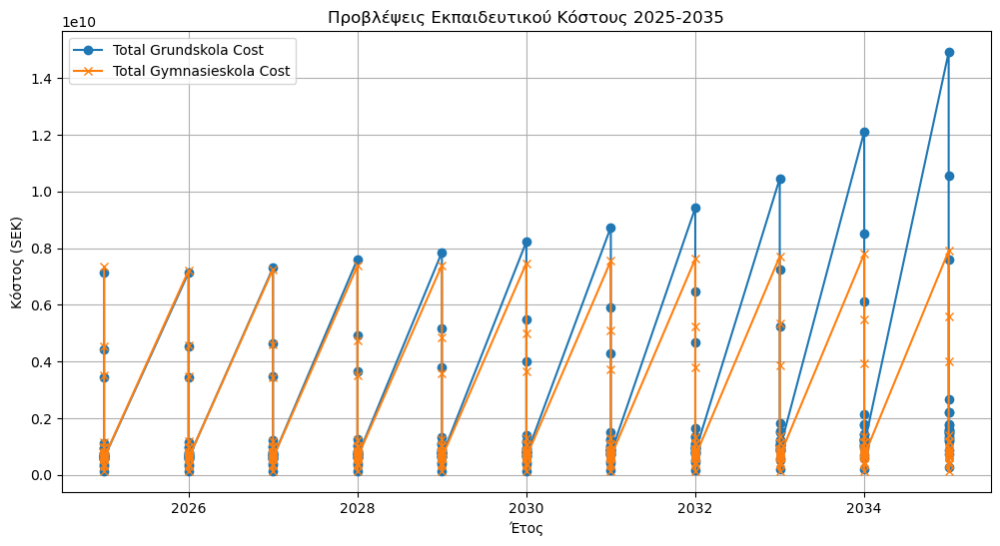

In [270]:
import matplotlib.pyplot as plt

# Φόρτωση των τελικών δεδομένων για ευκολία
final_data = pd.read_csv('C:/Users/theop/Downloads/Total_Education_Costs_2025_2035.csv')

# Σταδιακή ανάλυση κόστους Grundskola και Gymnasieskola για το σύνολο
plt.figure(figsize=(12, 6))

# Κόστος Grundskola
plt.plot(final_data['Year'], final_data['Total_Grundskola_Cost'], label='Total Grundskola Cost', marker='o')
plt.plot(final_data['Year'], final_data['Total_Gymnasieskola_Cost'], label='Total Gymnasieskola Cost', marker='x')

# Προσθήκη τίτλων και περιγραφών
plt.title("Προβλέψεις Εκπαιδευτικού Κόστους 2025-2035")
plt.xlabel("Έτος")
plt.ylabel("Κόστος (SEK)")
plt.legend()
plt.grid()

# Εμφάνιση των γραφημάτων
plt.show()


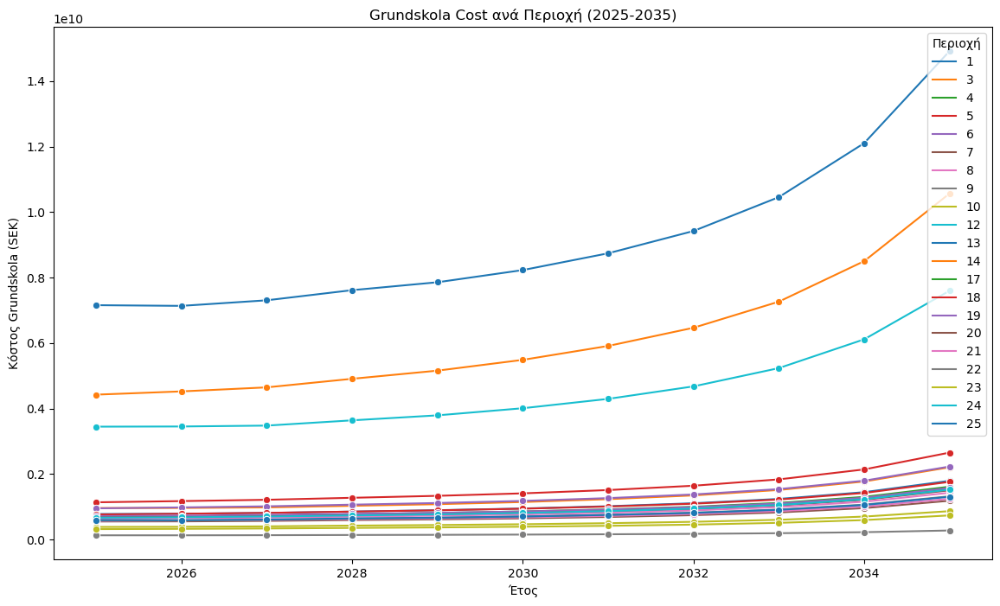

In [271]:
import seaborn as sns

plt.figure(figsize=(14, 8))
sns.lineplot(data=final_data, x='Year', y='Total_Grundskola_Cost', hue='Region', marker="o", palette="tab10")
plt.title("Grundskola Cost ανά Περιοχή (2025-2035)")
plt.xlabel("Έτος")
plt.ylabel("Κόστος Grundskola (SEK)")
plt.legend(title="Περιοχή")
plt.show()


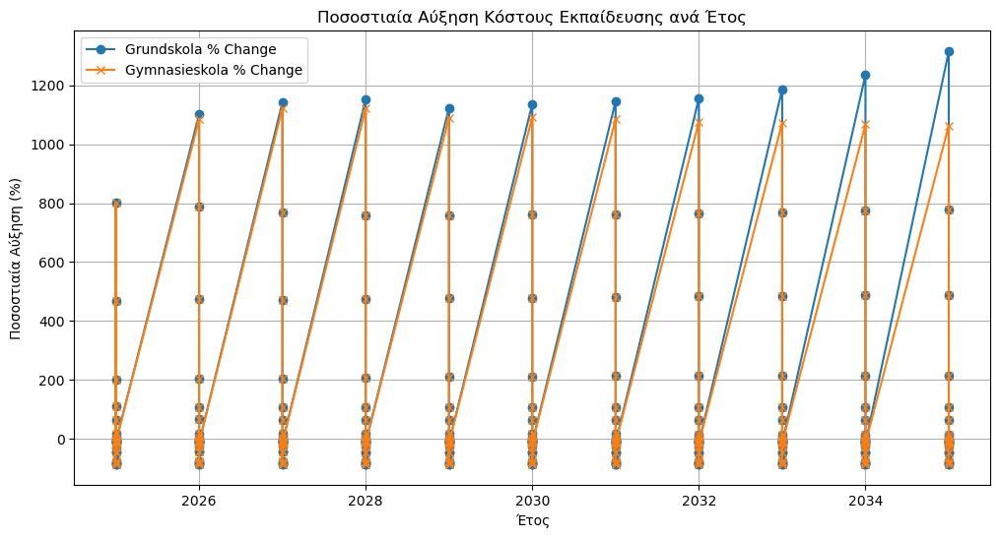

In [272]:
final_data['Grundskola_Cost_Percentage_Change'] = final_data['Total_Grundskola_Cost'].pct_change() * 100
final_data['Gymnasieskola_Cost_Percentage_Change'] = final_data['Total_Gymnasieskola_Cost'].pct_change() * 100

plt.figure(figsize=(12, 6))
plt.plot(final_data['Year'], final_data['Grundskola_Cost_Percentage_Change'], label='Grundskola % Change', marker='o')
plt.plot(final_data['Year'], final_data['Gymnasieskola_Cost_Percentage_Change'], label='Gymnasieskola % Change', marker='x')
plt.title("Ποσοστιαία Αύξηση Κόστους Εκπαίδευσης ανά Έτος")
plt.xlabel("Έτος")
plt.ylabel("Ποσοστιαία Αύξηση (%)")
plt.legend()
plt.grid()
plt.show()


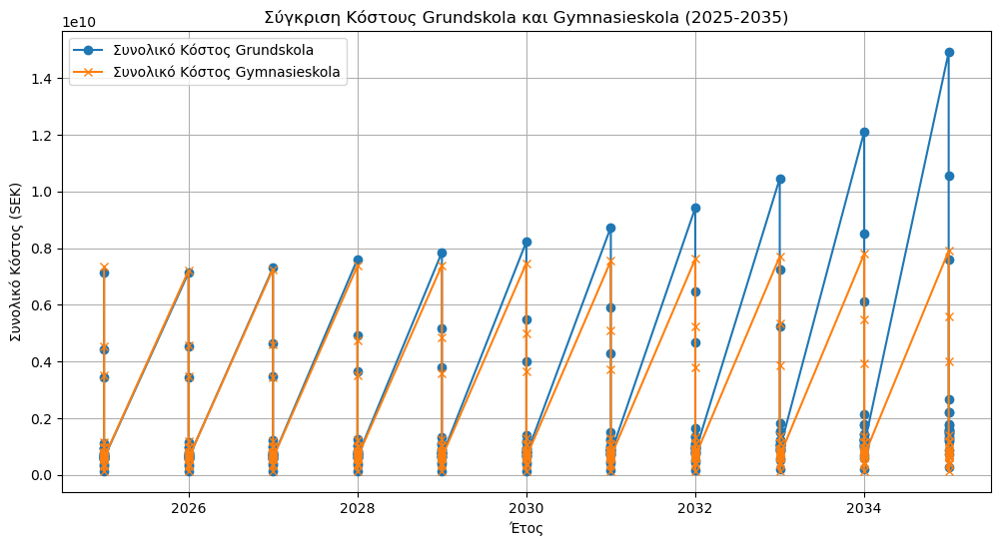

In [273]:
import matplotlib.pyplot as plt

# Σύνολο κόστους ανά έτος για Grundskola και Gymnasieskola
plt.figure(figsize=(12, 6))
plt.plot(final_data['Year'], final_data['Total_Grundskola_Cost'], label='Συνολικό Κόστος Grundskola', marker='o')
plt.plot(final_data['Year'], final_data['Total_Gymnasieskola_Cost'], label='Συνολικό Κόστος Gymnasieskola', marker='x')
plt.title("Σύγκριση Κόστους Grundskola και Gymnasieskola (2025-2035)")
plt.xlabel("Έτος")
plt.ylabel("Συνολικό Κόστος (SEK)")
plt.legend()
plt.grid()
plt.show()


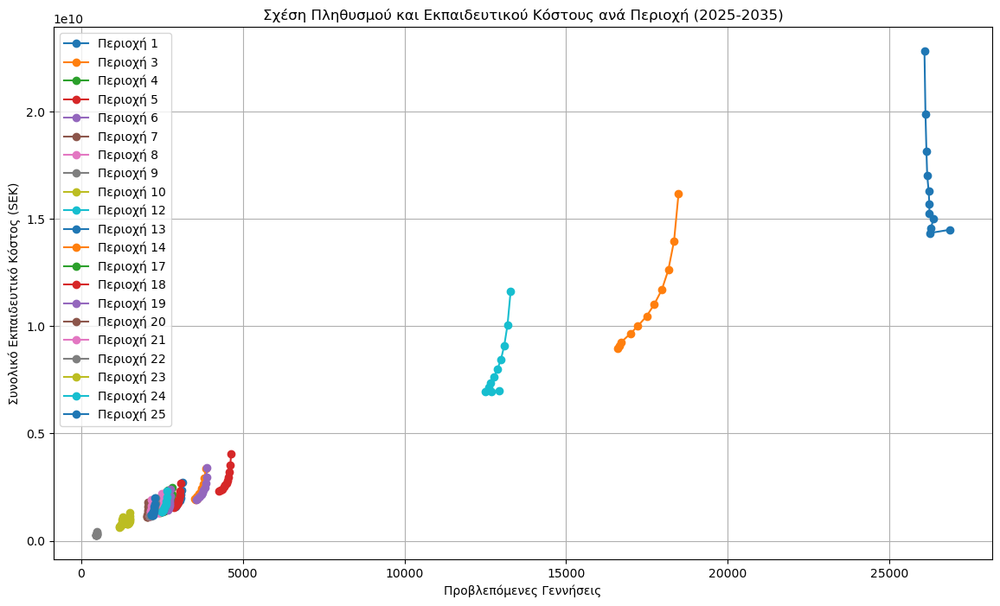

In [276]:
import matplotlib.pyplot as plt

# Γραμμές για το συνολικό εκπαιδευτικό κόστος (Grundskola + Gymnasieskola) σε σχέση με τις γεννήσεις
plt.figure(figsize=(14, 8))
for region in combined_data['Region'].unique():
    region_data = combined_data[combined_data['Region'] == region]
    total_education_cost = region_data['Total_Grundskola_Cost'] + region_data['Total_Gymnasieskola_Cost']
    plt.plot(region_data['Predicted_Births_LSTM_x'], total_education_cost, marker='o', label=f'Περιοχή {region}')

plt.title("Σχέση Πληθυσμού και Εκπαιδευτικού Κόστους ανά Περιοχή (2025-2035)")
plt.xlabel("Προβλεπόμενες Γεννήσεις")
plt.ylabel("Συνολικό Εκπαιδευτικό Κόστος (SEK)")
plt.legend()
plt.grid()
plt.show()
